In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import netCDF4
import os
from tqdm import tqdm, trange
import itertools

import cartopy.crs as ccrs

import matplotlib.pyplot as graph
import seaborn as sns

import scipy.stats as stats
import statsmodels.api as sm

pd.options.mode.chained_assignment = None  # default='warn'
import warnings
warnings.filterwarnings('ignore')


In [12]:
df = xr.open_dataset('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/isimip_ice/albm_gfdl-esm2m_historical_rcp26_icestart_1901_2099.nc', 
                     decode_times=False)

In [37]:
path = '/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/'

for file in tqdm(os.listdir(f'{path}isimip_ice/')):
    file_name = file.split('.nc')[0]
    ds = xr.open_dataset(f'{path}isimip_ice/{file}', decode_times=False)
    df = ds.to_dataframe()
    df.dropna(inplace=True)
    df.reset_index(inplace=True)
    df['years'] = 1901 -240 + df['time']
    df.to_csv(f'{path}Csv_files_no_nan/{file_name}.csv', index=False)

100%|██████████| 93/93 [24:51<00:00, 16.03s/it]


# Get icestart and iceend, and different rcp into lists

In [3]:
path = '/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/'

iceend_files = [file for file in os.listdir(f'{path}Csv_files_no_nan/') if 'iceend' in file]
rcp_26_iceend_files = [file for file in iceend_files if 'rcp26' in file]
rcp_60_iceend_files = [file for file in iceend_files if 'rcp60' in file]
rcp_85_iceend_files = [file for file in iceend_files if 'rcp85' in file]

iceend = []
for file in tqdm(iceend_files):
    rcp = file.split('_rcp')[1].split('_')[0]
    model = file.split('_historical')[0]
    df = pd.read_csv(f'{path}Csv_files_no_nan/{file}')
    df['rcp'] = rcp
    df['model'] = model
#     df = df[['years', 'iceend', 'rcp', 'model']]
    iceend.append(df)

100%|██████████| 46/46 [01:20<00:00,  1.74s/it]


In [4]:
%%time
df_iceend = pd.concat(iceend)
# df_iceend.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/iceend_all.csv', 
#                    index=False)

CPU times: user 28min 43s, sys: 4min 9s, total: 32min 53s
Wall time: 39min 1s


In [5]:
display(df_iceend.head())

,lat,lon,time,iceend,years,rcp,model
0,83.25,-75.25,240.0,363.0,1901.0,26,albm_gfdl-esm2m
1,83.25,-75.25,241.0,363.0,1902.0,26,albm_gfdl-esm2m
2,83.25,-75.25,242.0,363.0,1903.0,26,albm_gfdl-esm2m
3,83.25,-75.25,243.0,364.0,1904.0,26,albm_gfdl-esm2m
4,83.25,-75.25,244.0,362.0,1905.0,26,albm_gfdl-esm2m


In [2]:
%%time
df_iceend = pd.read_csv("/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/iceend_all.csv")
display(df_iceend.head())

df_icestart = pd.read_csv("/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/icestart_all.csv")
display(df_icestart.head())

,lat,lon,time,iceend,years,rcp,model
0,83.25,-75.25,240.0,363.0,1901.0,26,albm_gfdl-esm2m
1,83.25,-75.25,241.0,363.0,1902.0,26,albm_gfdl-esm2m
2,83.25,-75.25,242.0,363.0,1903.0,26,albm_gfdl-esm2m
3,83.25,-75.25,243.0,364.0,1904.0,26,albm_gfdl-esm2m
4,83.25,-75.25,244.0,362.0,1905.0,26,albm_gfdl-esm2m


,lat,lon,time,icestart,years,rcp,model
0,83.25,-75.25,240.0,-1.0,1901.0,26,albm_gfdl-esm2m
1,83.25,-75.25,241.0,-1.0,1902.0,26,albm_gfdl-esm2m
2,83.25,-75.25,242.0,-1.0,1903.0,26,albm_gfdl-esm2m
3,83.25,-75.25,243.0,-1.0,1904.0,26,albm_gfdl-esm2m
4,83.25,-75.25,244.0,-1.0,1905.0,26,albm_gfdl-esm2m


CPU times: user 1min 50s, sys: 1min 43s, total: 3min 34s
Wall time: 3min 42s


In [40]:
for rcp in [26, 60, 85]:
    rcp_df = df_iceend[df_iceend['rcp'] == rcp]
    
    ks_df = []    
    for model in tqdm(itertools.product(rcp_df['model'].unique(), repeat=2)):
        model_1, model_2 = model[0], model[1]
        model_1_df = rcp_df[rcp_df['model'] == model_1]['iceend']
        model_2_df = rcp_df[rcp_df['model'] == model_2]['iceend']
        ks_p = stats.ks_2samp(model_1_df, model_2_df)[1]
        ks_df.append([model_1, model_2, ks_p])
    
    ks_df = pd.DataFrame(ks_df, columns=['model_1', 'model_2', 'ks_p_val'])
    display(ks_df.head())
    ks_df.to_csv(f'/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/rcp_{rcp}_iceend_ks_test.csv', 
                 index=False)

256it [22:14,  5.21s/it]


,model_1,model_2,ks_p_val
0,albm_gfdl-esm2m,albm_gfdl-esm2m,1.000000e+00
1,albm_gfdl-esm2m,albm_hadgem2-es,0.000000e+00
2,albm_gfdl-esm2m,albm_ipsl-cm5a-lr,2.830220e-127
3,albm_gfdl-esm2m,albm_miroc5,1.053563e-248
4,albm_gfdl-esm2m,clm45_gfdl-esm2m,0.000000e+00


256it [23:36,  5.53s/it]


,model_1,model_2,ks_p_val
0,albm_gfdl-esm2m,albm_gfdl-esm2m,1.000000e+00
1,albm_gfdl-esm2m,albm_hadgem2-es,0.000000e+00
2,albm_gfdl-esm2m,albm_ipsl-cm5a-lr,1.575543e-80
3,albm_gfdl-esm2m,albm_miroc5,5.221832e-294
4,albm_gfdl-esm2m,clm45_gfdl-esm2m,0.000000e+00


196it [14:49,  4.54s/it]


,model_1,model_2,ks_p_val
0,albm_gfdl-esm2m,albm_gfdl-esm2m,1.000000e+00
1,albm_gfdl-esm2m,albm_hadgem2-es,0.000000e+00
2,albm_gfdl-esm2m,albm_ipsl-cm5a-lr,2.288182e-219
3,albm_gfdl-esm2m,albm_miroc5,0.000000e+00
4,albm_gfdl-esm2m,clm45_gfdl-esm2m,0.000000e+00


# Kevin's all dataset

In [19]:
kevin = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/all_lakes_ts_minimal_KB_Aug31.csv')
kevin = kevin[['start_year', 'froze', 'froze_1', 'froze_2', 'froze_3', 'froze_4', 'froze_5', 'froze_6', 'ice_on_1', 
               'ice_off_1', 'ice_on_2', 'ice_off_2', 'ice_on_3', 'ice_off_3', 'ice_on_4', 'ice_off_4', 'ice_on_5', 
               'ice_off_5', 'ice_on_6', 'ice_off_6', 'orig_duration', 'orig_duration_column', 'latitude', 'longitude']]

kevin['lat_long'] = kevin['latitude'].round(1).astype(str) + '_' + kevin['longitude'].round(1).astype(str)
display(kevin.head())

/home/arshad/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (9,21) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,start_year,froze,froze_1,froze_2,froze_3,froze_4,froze_5,froze_6,ice_on_1,ice_off_1,...,ice_off_4,ice_on_5,ice_off_5,ice_on_6,ice_off_6,orig_duration,orig_duration_column,latitude,longitude,lat_long
0,1443,Y,Y,NaN,NaN,NaN,NaN,NaN,1444-01-07,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,36.0_138.1
1,1444,Y,Y,NaN,NaN,NaN,NaN,NaN,1444-12-23,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,36.0_138.1
2,1445,Y,Y,NaN,NaN,NaN,NaN,NaN,1445-12-31,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,36.0_138.1
3,1446,Y,Y,NaN,NaN,NaN,NaN,NaN,1447-01-01,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,36.0_138.1
4,1447,Y,Y,NaN,NaN,NaN,NaN,NaN,1447-12-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,36.0_138.1


In [20]:
kevin = kevin[['start_year', 'froze', 'froze_1', 'ice_on_1', 'ice_off_1', 'orig_duration', 'orig_duration_column', 
               'latitude', 'longitude']]

kevin['lat_long'] = kevin['latitude'].round(1).astype(str) + '_' + kevin['longitude'].round(1).astype(str)
kevin = kevin.loc[kevin['start_year'] > 1900]

print(len(kevin))

kevin.dropna(subset=['ice_on_1', 'ice_off_1'], how='all', inplace=True)
print(len(kevin))
display(kevin.head())

57249
46077


,start_year,froze,froze_1,ice_on_1,ice_off_1,orig_duration,orig_duration_column,latitude,longitude,lat_long
458,1901,Y,Y,1901-12-31,NaN,NaN,None,36.04,138.08,36.0_138.1
459,1902,Y,Y,1903-01-15,NaN,NaN,None,36.04,138.08,36.0_138.1
460,1903,Y,Y,1903-12-22,NaN,NaN,None,36.04,138.08,36.0_138.1
461,1904,Y,Y,1904-12-25,NaN,NaN,None,36.04,138.08,36.0_138.1
462,1905,Y,Y,1906-01-16,NaN,NaN,None,36.04,138.08,36.0_138.1


In [21]:
kevin['days_in_year'] = pd.to_datetime(kevin['start_year'].astype(str) + '-12-31').dt.dayofyear

kevin['ice_on_year'] = kevin['ice_on_1'].str.split('-').str.get(0).astype(float)
kevin['ice_off_year'] = kevin['ice_off_1'].str.split('-').str.get(0).astype(float)

kevin['days_ice_on'] = pd.to_datetime(kevin['ice_on_1']).dt.dayofyear
kevin['days_ice_off'] = pd.to_datetime(kevin['ice_off_1']).dt.dayofyear

kevin['ice_on_doy'] = np.where(kevin['ice_on_year'] > kevin['start_year'], kevin['days_ice_on'], np.nan)
kevin['ice_on_doy'] = np.where(kevin['ice_on_year'] == kevin['start_year'], kevin['days_ice_on'] - kevin['days_in_year'], 
                               kevin['ice_on_doy'])

kevin['ice_off_doy'] = np.where(kevin['ice_off_year'] > kevin['start_year'], kevin['days_ice_off'], np.nan)
kevin['ice_off_doy'] = np.where(kevin['ice_off_year'] == kevin['start_year'], kevin['days_ice_off'] - kevin['days_in_year'], 
                                kevin['ice_off_doy'])

kevin.drop(columns=['days_in_year', 'ice_on_year', 'ice_off_year', 'days_ice_on', 'days_ice_off'], inplace=True)

kevin.sample(5)

,start_year,froze,froze_1,ice_on_1,ice_off_1,orig_duration,orig_duration_column,latitude,longitude,lat_long,ice_on_doy,ice_off_doy
51746,2014,Y,Y,NaN,2015-04-28,NaN,None,48.44958,-92.62190,48.4_-92.6,NaN,118.0
48589,1993,Y,Y,1993-11-27,1994-04-13,NaN,None,45.53179,-94.42756,45.5_-94.4,-34.0,103.0
15203,1938,Y,Y,1938-12-18,1939-05-15,148.0,duration,61.55400,29.43400,61.6_29.4,-13.0,135.0
23136,1912,Y,Y,NaN,1913-04-20,NaN,duration,45.18000,-79.73000,45.2_-79.7,NaN,110.0
60905,2002,Y,Y,2002-11-26,2003-04-14,NaN,None,46.20530,-93.81363,46.2_-93.8,-35.0,104.0


In [22]:
kevin.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/kevin_lakes_in_situ_aug_31.csv', 
             index=False)

In [19]:
unique_lat_longs = list(kevin['lat_long'].unique())
df_lat_longs = pd.Series(unique_lat_longs)
df_lat_longs.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/kevin_lat_longs.csv', 
                        index=False)

/home/arshad/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  after removing the cwd from sys.path.


# merged Kevin and Iestyn data

/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/arshad/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  inframe=inframe)
/home/arshad/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


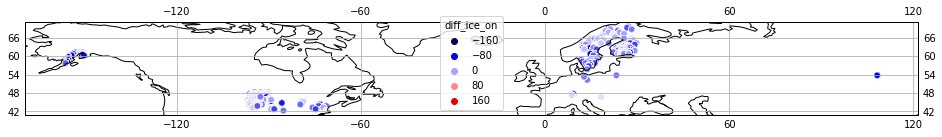

In [9]:
graph.figure(figsize=(16, 9))
ax = graph.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.gridlines(draw_labels=True)

sns.scatterplot(df_diff_ice_on['lon'], df_diff_ice_on['lat'], hue=df_diff_ice_on['diff_ice_on'], 
                transform=ccrs.PlateCarree(), palette='seismic', s=40)

graph.show()

/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/arshad/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  inframe=inframe)
/home/arshad/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


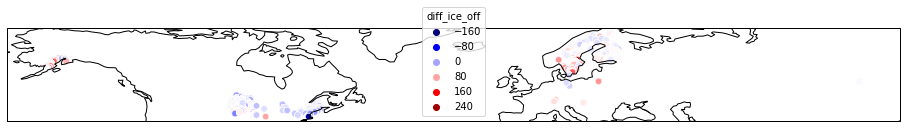

In [14]:
graph.figure(figsize=(16, 9))
# ax = graph.axes(projection=ccrs.Orthographic(0, 90))
ax = graph.axes(projection=ccrs.PlateCarree())

ax.coastlines(zorder=3)
# sns.color_palette("coolwarm", as_cmap=True, center=0)

sns.scatterplot(df_diff_ice_off['lon'], df_diff_ice_off['lat'], hue=df_diff_ice_off['diff_ice_off'], 
                transform=ccrs.PlateCarree(), palette='seismic', s=40)

graph.show()

/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


/home/arshad/miniconda3/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:388: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  inframe=inframe)
/home/arshad/miniconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


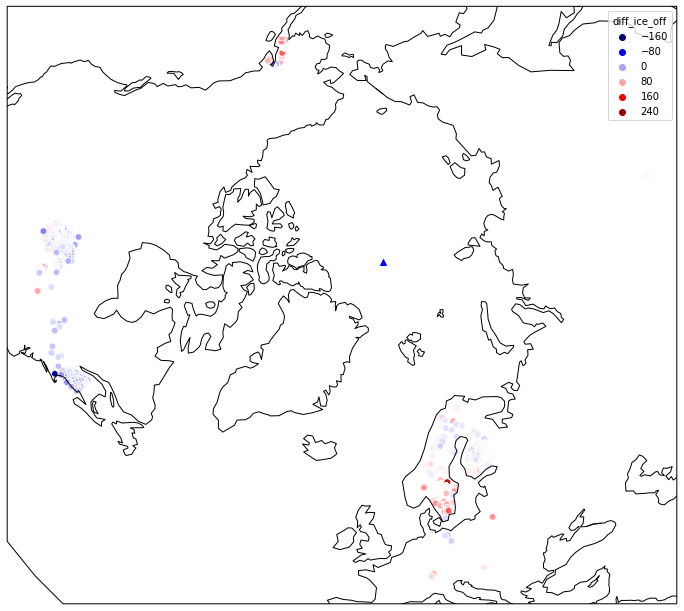

In [30]:
## TOP oF THE WORLD MAP

graph.figure(figsize=(12, 12))

ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

# create the geoaxes for an orthographic projection
ax = graph.axes(projection=ortho)

# transform lat/lons points to othographic points
points = ortho.transform_points(geo, df_diff_ice_off['lon'].values, df_diff_ice_off['lat'].values)

# plot native orthographic points                                                                                
sns.scatterplot(points[:, 0], points[:, 1], hue=df_diff_ice_off['diff_ice_off'], palette='seismic', s=40)

# plot north pole for reference (with a projection transform)                                                                                           
ax.plot([0], [90], 'b^', transform=geo)
ax.coastlines(zorder=3)                                                                                        

/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


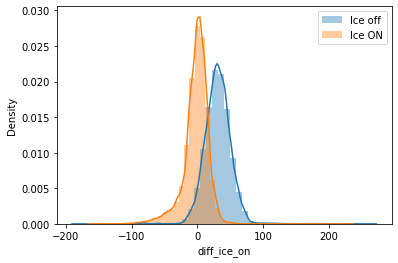

In [31]:
sns.distplot(df_diff_ice_off['diff_ice_off'], label='Ice off')
sns.distplot(df_diff_ice_on['diff_ice_on'], label='Ice ON')
graph.legend()
graph.show()

In [36]:
rcp_85 = df.loc[df['rcp'] == 85]
rcp_85 = rcp_85.loc[rcp_85['years'] > 2004]

rcp_85['grouped_iceend_year'] = rcp_85.groupby(['model', 'lat_long'])['grouped_iceend'].transform('mean')
rcp_85['grouped_iceoff_year'] = rcp_85.groupby(['model', 'lat_long'])['grouped_ice_off'].transform('mean')
rcp_85['diff_grouped_year'] = rcp_85['grouped_iceend_year'] - rcp_85['grouped_iceoff_year']

rcp_85['number_days_year'] = pd.to_datetime((rcp_85['years']).astype(int).astype(str) + '-12-31').dt.dayofyear
rcp_85['number_days_to_oct'] = pd.to_datetime((rcp_85['years']).astype(int).astype(str) + '-10-01').dt.dayofyear
rcp_85['transformed_ice_off'] = rcp_85['number_days_to_oct'] + rcp_85['iceend'] - rcp_85['number_days_year']
rcp_85['grouped_transformed_ice_off'] = rcp_85.groupby(['model', 'lat_long', 'years'])['transformed_ice_off'].transform('mean')

rcp_85['diff_ice_off_transformed'] = rcp_85['grouped_transformed_ice_off'] - rcp_85['grouped_ice_off']
rcp_85['location'] = np.where(rcp_85['lon'] > 0, 'EAST', 'WEST')
rcp_85['grouped_ice_off_years'] = rcp_85.groupby(['model', 'lat_long'])['diff_ice_off'].transform('mean')
rcp_85['grouped_ice_on_years'] = rcp_85.groupby(['model', 'lat_long'])['diff_ice_on'].transform('mean')

rcp_85['grouped_ice_off_year_periods'] = rcp_85.groupby(['model', 'lat_long', 'year_periods'])['diff_ice_off'].transform('mean')
rcp_85['grouped_ice_on_year_periods'] = rcp_85.groupby(['model', 'lat_long', 'year_periods'])['diff_ice_on'].transform('mean')

east_rcp_85 = rcp_85.loc[rcp_85['lon'] > 0]
west_rcp_85 = rcp_85.loc[rcp_85['lon'] < 0]

display(rcp_85.head())

,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,...,diff_grouped_year,number_days_year,number_days_to_oct,transformed_ice_off,grouped_transformed_ice_off,diff_ice_off_transformed,grouped_ice_off_years,grouped_ice_on_years,grouped_ice_off_year_periods,grouped_ice_on_year_periods
6611,69.75,27.25,29.0,2005.0,85,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,189.0,...,41.500000,365,274,189.0,189.0,48.0,44.0,1.333333,44.0,1.333333
6614,69.75,27.25,33.0,2005.0,85,albm_hadgem2-es,69.75_27.25,-58.0,276.0,185.0,...,42.833333,365,274,185.0,185.0,44.0,42.5,5.000000,42.5,5.000000
6617,69.75,27.25,46.0,2005.0,85,albm_ipsl-cm5a-lr,69.75_27.25,-45.0,269.0,178.0,...,42.500000,365,274,178.0,178.0,37.0,40.5,4.666667,40.5,4.666667
6620,69.75,27.25,36.0,2005.0,85,albm_miroc5,69.75_27.25,-55.0,278.0,187.0,...,37.500000,365,274,187.0,187.0,46.0,40.5,9.000000,40.5,9.000000
6623,69.75,27.25,17.0,2005.0,85,clm45_gfdl-esm2m,69.75_27.25,-74.0,280.0,189.0,...,44.166667,365,274,189.0,189.0,48.0,47.5,-16.333333,47.5,-16.333333


In [38]:
mendota = rcp_85.loc[(rcp_85['lon'] < - 50) & (rcp_85['lat'] > 42) & (rcp_85['lat'] < 51) & (rcp_85['lon'] > - 84)]
mendota = mendota[['lat', 'lon', 'icestart', 'iceend', 'years', 'rcp', 'model', 'grouped_ice_on', 'grouped_ice_off', 
                   'grouped_iceend']]
mendota

,lat,lon,icestart,iceend,years,rcp,model,grouped_ice_on,grouped_ice_off,grouped_iceend
893390,47.25,-68.75,60.0,248.0,2005.0,85,albm_gfdl-esm2m,NaN,119.0,157.0
893393,47.25,-68.75,59.0,244.0,2005.0,85,albm_hadgem2-es,NaN,119.0,153.0
893396,47.25,-68.75,58.0,249.0,2005.0,85,albm_ipsl-cm5a-lr,NaN,119.0,158.0
893399,47.25,-68.75,62.0,233.0,2005.0,85,albm_miroc5,NaN,119.0,142.0
893402,47.25,-68.75,49.0,267.0,2005.0,85,clm45_gfdl-esm2m,NaN,119.0,176.0
...,...,...,...,...,...,...,...,...,...,...
1952445,42.75,-74.75,86.0,199.0,2015.0,85,lake_ipsl-cm5a-lr,45.0,72.0,108.0
1952452,42.75,-74.75,69.0,216.0,2017.0,85,lake_hadgem2-es,1.0,114.0,125.0
1952455,42.75,-74.75,63.0,200.0,2017.0,85,lake_ipsl-cm5a-lr,1.0,114.0,109.0
1952462,42.75,-74.75,65.0,206.0,2018.0,85,lake_hadgem2-es,16.0,103.0,115.0


/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


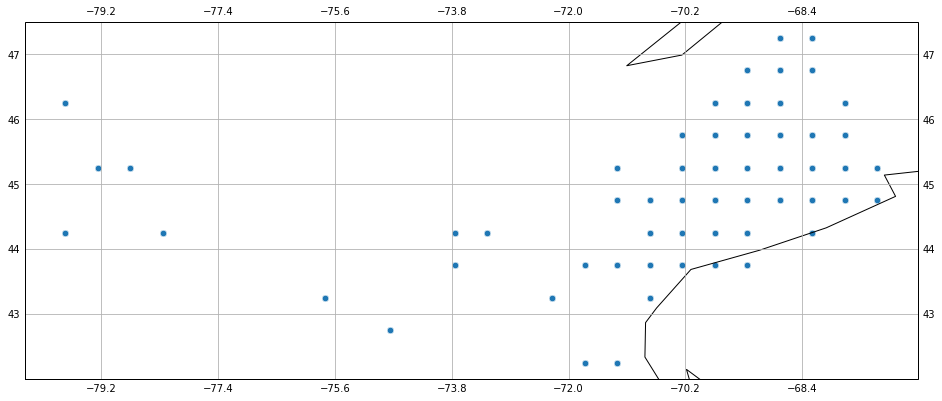

In [39]:
graph.figure(figsize=(16, 9))
ax = graph.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.gridlines(draw_labels=True)

# sns.color_palette("coolwarm", as_cmap=True, center=0)

sns.scatterplot(mendota['lon'], mendota['lat'], 
                transform=ccrs.PlateCarree(), palette='seismic', s=40)

graph.show()

# Trend for Anomaly
- 1950-2018
- 2005-2018

In [8]:
# df['number_days_year'] = pd.to_datetime(df['years'].astype(int).astype(str) + '-12-31').dt.dayofyear
# df['number_days_to_sep'] = pd.to_datetime(df['years'].astype(int).astype(str) + '-09-01').dt.dayofyear
# df['ice_end_converted'] = df['number_days_to_sep'] + df['iceend'] - df['number_days_year']
# df['grouped_iceend'] = df.groupby(['lat_long', 'years', 'rcp', 'model'])['ice_end_converted'].transform('mean')

# df['diff_ice_off'] = df['grouped_iceend'] - df['grouped_ice_off']

# df.drop(columns = ['number_days_year', 'number_days_to_sep'], inplace=True)
# df.to_csv()

# display(df.head())

,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted
0,74.75,101.25,0.0,1959.0,26,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
1,74.75,101.25,0.0,1959.0,60,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
2,74.75,101.25,0.0,1959.0,85,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
3,74.75,101.25,-1.0,1959.0,26,albm_hadgem2-es,74.75_101.25,-92.0,338.0,217.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0
4,74.75,101.25,-1.0,1959.0,60,albm_hadgem2-es,74.75_101.25,-92.0,338.0,217.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0


In [2]:
%%time
df = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/merged_kev_iestyn_jul_28_2021.csv')
print(len(df))
df['lake_model'] = df['model'].str.split('_').str.get(0)
df.dropna(subset=['diff_ice_on', 'diff_ice_off'], how='all', inplace=True)
print(len(df))
df_after_2005 = df.loc[df['years'] > 2004]
df_before_2005 = df.loc[df['years'] < 2005]

print(len(df_before_2005), len(df_after_2005))
display(df_after_2005.head())

1954156
1944496
1539987 404509


,Unnamed: 0,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,...,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted,lake_model
6609,6609,69.75,27.25,29.0,2005.0,26,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,69.75,27.25,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm
6610,6610,69.75,27.25,29.0,2005.0,60,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,69.75,27.25,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm
6611,6611,69.75,27.25,29.0,2005.0,85,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,69.75,27.25,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm
6612,6612,69.75,27.25,33.0,2005.0,26,albm_hadgem2-es,69.75_27.25,-58.0,276.0,...,69.75,27.25,-57.0,141.0,-57.0,141.0,-1.0,14.0,155.0,albm
6613,6613,69.75,27.25,33.0,2005.0,60,albm_hadgem2-es,69.75_27.25,-58.0,276.0,...,69.75,27.25,-57.0,141.0,-57.0,141.0,-1.0,14.0,155.0,albm


CPU times: user 8.45 s, sys: 3.64 s, total: 12.1 s
Wall time: 12.6 s


In [3]:
df_ice_on = df[['lat', 'lon', 'icestart', 'years', 'rcp', 'model', 'lake_model', 'lat_long',
       'grouped_icestart', 'latitude', 'longitude', 'grouped_ice_on']]
df_ice_on.dropna(inplace=True)

df_ice_off = df[['lat', 'lon', 'iceend', 'ice_end_converted', 'years', 'rcp', 'model', 'lake_model', 
                                       'lat_long', 'grouped_iceend', 'latitude', 'longitude', 'grouped_ice_off']]
df_ice_off.dropna(inplace=True)

print(f"# unique ice on locations = {len(df_ice_on['lat_long'].unique())}")
print(f"# unique ice off locations = {len(df_ice_off['lat_long'].unique())}")

after_2005_ice_on_lat_longs = df_ice_on['lat_long'].unique()
after_2005_ice_off_lat_longs = df_ice_off['lat_long'].unique()

print(len(df_ice_on), len(df_ice_off))
display(df_ice_on.head(), df_ice_off.head())

# unique ice on locations = 459
# unique ice off locations = 535
1498855 1875608


,lat,lon,icestart,years,rcp,model,lake_model,lat_long,grouped_icestart,latitude,longitude,grouped_ice_on
47,74.75,101.25,1.0,1960.0,26,albm_gfdl-esm2m,albm,74.75_101.25,-90.0,74.75,101.25,-89.0
48,74.75,101.25,1.0,1960.0,60,albm_gfdl-esm2m,albm,74.75_101.25,-90.0,74.75,101.25,-89.0
49,74.75,101.25,1.0,1960.0,85,albm_gfdl-esm2m,albm,74.75_101.25,-90.0,74.75,101.25,-89.0
50,74.75,101.25,-1.0,1960.0,26,albm_hadgem2-es,albm,74.75_101.25,-92.0,74.75,101.25,-89.0
51,74.75,101.25,-1.0,1960.0,60,albm_hadgem2-es,albm,74.75_101.25,-92.0,74.75,101.25,-89.0


,lat,lon,iceend,ice_end_converted,years,rcp,model,lake_model,lat_long,grouped_iceend,latitude,longitude,grouped_ice_off
0,74.75,101.25,315.0,194.0,1959.0,26,albm_gfdl-esm2m,albm,74.75_101.25,194.0,74.75,101.25,166.0
1,74.75,101.25,315.0,194.0,1959.0,60,albm_gfdl-esm2m,albm,74.75_101.25,194.0,74.75,101.25,166.0
2,74.75,101.25,315.0,194.0,1959.0,85,albm_gfdl-esm2m,albm,74.75_101.25,194.0,74.75,101.25,166.0
3,74.75,101.25,338.0,217.0,1959.0,26,albm_hadgem2-es,albm,74.75_101.25,217.0,74.75,101.25,166.0
4,74.75,101.25,338.0,217.0,1959.0,60,albm_hadgem2-es,albm,74.75_101.25,217.0,74.75,101.25,166.0


In [4]:
df_after_2005_ice_on = df_after_2005[['lat', 'lon', 'icestart', 'years', 'rcp', 'model', 'lake_model', 'lat_long',
       'grouped_icestart', 'latitude', 'longitude', 'grouped_ice_on']]
df_after_2005_ice_on.dropna(inplace=True)

df_after_2005_ice_off = df_after_2005[['lat', 'lon', 'iceend', 'ice_end_converted', 'years', 'rcp', 'model', 'lake_model', 
                                       'lat_long', 'grouped_iceend', 'latitude', 'longitude', 'grouped_ice_off']]
df_after_2005_ice_off.dropna(inplace=True)

print(f"# unique ice on locations = {len(df_after_2005_ice_on['lat_long'].unique())}")
print(f"# unique ice off locations = {len(df_after_2005_ice_off['lat_long'].unique())}")

after_2005_ice_on_lat_longs = df_after_2005_ice_on['lat_long'].unique()
after_2005_ice_off_lat_longs = df_after_2005_ice_off['lat_long'].unique()

print(len(df_after_2005_ice_on), len(df_after_2005_ice_off))
display(df_after_2005_ice_on.head(), df_after_2005_ice_off.head())

# WAS 14639 18195

# unique ice on locations = 209
# unique ice off locations = 270
328811 393150


,lat,lon,icestart,years,rcp,model,lake_model,lat_long,grouped_icestart,latitude,longitude,grouped_ice_on
6609,69.75,27.25,29.0,2005.0,26,albm_gfdl-esm2m,albm,69.75_27.25,-62.0,69.75,27.25,-57.0
6610,69.75,27.25,29.0,2005.0,60,albm_gfdl-esm2m,albm,69.75_27.25,-62.0,69.75,27.25,-57.0
6611,69.75,27.25,29.0,2005.0,85,albm_gfdl-esm2m,albm,69.75_27.25,-62.0,69.75,27.25,-57.0
6612,69.75,27.25,33.0,2005.0,26,albm_hadgem2-es,albm,69.75_27.25,-58.0,69.75,27.25,-57.0
6613,69.75,27.25,33.0,2005.0,60,albm_hadgem2-es,albm,69.75_27.25,-58.0,69.75,27.25,-57.0


,lat,lon,iceend,ice_end_converted,years,rcp,model,lake_model,lat_long,grouped_iceend,latitude,longitude,grouped_ice_off
6609,69.75,27.25,280.0,159.0,2005.0,26,albm_gfdl-esm2m,albm,69.75_27.25,159.0,69.75,27.25,141.0
6610,69.75,27.25,280.0,159.0,2005.0,60,albm_gfdl-esm2m,albm,69.75_27.25,159.0,69.75,27.25,141.0
6611,69.75,27.25,280.0,159.0,2005.0,85,albm_gfdl-esm2m,albm,69.75_27.25,159.0,69.75,27.25,141.0
6612,69.75,27.25,276.0,155.0,2005.0,26,albm_hadgem2-es,albm,69.75_27.25,155.0,69.75,27.25,141.0
6613,69.75,27.25,276.0,155.0,2005.0,60,albm_hadgem2-es,albm,69.75_27.25,155.0,69.75,27.25,141.0


In [268]:
df_before_2005_ice_on = df_before_2005[['lat', 'lon', 'icestart', 'years', 'model', 'lat_long', 'lake_model', 
       'grouped_icestart', 'latitude', 'longitude', 'grouped_ice_on']]
df_before_2005_ice_on.dropna(inplace=True)
df_before_2005_ice_on.drop_duplicates(inplace=True)
df_before_2005_ice_on = df_before_2005_ice_on.loc[df_before_2005_ice_on['lat_long'].isin(after_2005_ice_on_lat_longs)]


df_before_2005_ice_off = df_before_2005[['lat', 'lon', 'iceend', 'years', 'model', 'lat_long', 'lake_model', 
       'grouped_iceend', 'latitude', 'longitude', 'grouped_ice_off']]
df_before_2005_ice_off.dropna(inplace=True)
df_before_2005_ice_off.drop_duplicates(inplace=True)
df_before_2005_ice_off = df_before_2005_ice_off.loc[df_before_2005_ice_off['lat_long'].isin(after_2005_ice_off_lat_longs)]


print(f"# unique ice on locations = {len(df_before_2005_ice_on['lat_long'].unique())}")
print(f"# unique ice off locations = {len(df_before_2005_ice_off['lat_long'].unique())}")

print(len(df_before_2005_ice_on), len(df_before_2005_ice_off))
display(df_before_2005_ice_on.head(), df_before_2005_ice_off.head())

# unique ice on locations = 162
# unique ice off locations = 211
123320 190987


,lat,lon,icestart,years,model,lat_long,lake_model,grouped_icestart,latitude,longitude,grouped_ice_on
4588,69.75,27.25,44.0,1962.0,albm_gfdl-esm2m,69.75_27.25,albm,-47.0,69.75,27.25,-76.0
4591,69.75,27.25,32.0,1962.0,albm_hadgem2-es,69.75_27.25,albm,-59.0,69.75,27.25,-76.0
4594,69.75,27.25,29.0,1962.0,albm_ipsl-cm5a-lr,69.75_27.25,albm,-62.0,69.75,27.25,-76.0
4597,69.75,27.25,29.0,1962.0,albm_miroc5,69.75_27.25,albm,-62.0,69.75,27.25,-76.0
4600,69.75,27.25,18.0,1962.0,clm45_gfdl-esm2m,69.75_27.25,clm45,-73.0,69.75,27.25,-76.0


,lat,lon,iceend,years,model,lat_long,lake_model,grouped_iceend,latitude,longitude,grouped_ice_off
4541,69.75,27.25,273.0,1961.0,albm_gfdl-esm2m,69.75_27.25,albm,152.0,69.75,27.25,160.0
4544,69.75,27.25,286.0,1961.0,albm_hadgem2-es,69.75_27.25,albm,165.0,69.75,27.25,160.0
4547,69.75,27.25,278.0,1961.0,albm_ipsl-cm5a-lr,69.75_27.25,albm,157.0,69.75,27.25,160.0
4550,69.75,27.25,272.0,1961.0,albm_miroc5,69.75_27.25,albm,151.0,69.75,27.25,160.0
4553,69.75,27.25,272.0,1961.0,clm45_gfdl-esm2m,69.75_27.25,clm45,151.0,69.75,27.25,160.0


### Ice ON / IceStart

## Calculate linear trends

In [10]:
orig_ice_on_slopes = []

for location in tqdm(df_after_2005_ice_on['lat_long'].unique()):
    temp_ice_on = df_after_2005_ice_on.loc[df_after_2005_ice_on['lat_long'] == location]
    temp_ice_on = temp_ice_on[['years', 'grouped_ice_on']]
    temp_ice_on.drop_duplicates(inplace=True)
    
    if len(temp_ice_on) < 10:
        continue
        
    start_year = float(temp_ice_on['years'].min()) 
    end_year = float(temp_ice_on['years'].max())
    
    x_cons = sm.add_constant(temp_ice_on['years'])
    model = sm.OLS(temp_ice_on['grouped_ice_on'], x_cons).fit()
    
    slope = model.params.values[1]
    mean = temp_ice_on['grouped_ice_on'].mean() # mean
    
    #Extreme Events
    sd = temp_ice_on['grouped_ice_on'].std(ddof=True)
    low_extreme_range, high_extreme_range = mean - 2*sd, mean + 2*sd
    temp_ice_on['extreme_day'] = temp_ice_on['grouped_ice_on'].between(low_extreme_range, high_extreme_range, inclusive='both')

    extreme_days = temp_ice_on['extreme_day'].sum()
    perc_extreme = (len(temp_ice_on) - extreme_days)/len(temp_ice_on)
    
    orig_ice_on_slopes.append([location, len(temp_ice_on), start_year, end_year, 'ice_on', mean, slope, perc_extreme])
    
df_orig_ice_on_slopes = pd.DataFrame(orig_ice_on_slopes, 
                                     columns = ['lat_long', 'len_in_situ_data', 'start_year', 'end_year', 'variable', 
                                                'mean_in_situ', 'slope_in_situ', 'perc_extreme'])
display(df_orig_ice_on_slopes.head())

100%|██████████| 209/209 [00:03<00:00, 54.82it/s]


,lat_long,len_in_situ_data,start_year,end_year,variable,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,2005.0,2018.0,ice_on,-44.142857,0.628571,0.071429
1,69.25_26.75,12,2005.0,2018.0,ice_on,-43.083333,0.521090,0.000000
2,68.75_28.25,14,2005.0,2018.0,ice_on,-58.785714,0.731868,0.000000
3,68.25_23.75,13,2005.0,2018.0,ice_on,-57.153846,1.335453,0.076923
4,67.75_20.75,14,2005.0,2018.0,ice_on,-57.357143,-0.221978,0.000000


In [275]:
##################### BEFORE #########################
orig_ice_on_slopes = []

for location in tqdm(df_before_2005_ice_on['lat_long'].unique()):
    temp_ice_on = df_before_2005_ice_on.loc[df_before_2005_ice_on['lat_long'] == location]
    temp_ice_on = temp_ice_on[['years', 'grouped_ice_on']]
    temp_ice_on.drop_duplicates(inplace=True)
    
    if len(temp_ice_on) < 10:
        continue
        
    x_cons = sm.add_constant(temp_ice_on['years'])
    model = sm.OLS(temp_ice_on['grouped_ice_on'], x_cons).fit()
    slope = model.params.values[1]
    
    mean = temp_ice_on['grouped_ice_on'].mean() # mean
    cov = stats.variation(temp_ice_on['grouped_ice_on']) # cov
    end_year = 2004
    
    orig_ice_on_slopes.append([location, len(temp_ice_on), 'ice_on', end_year, mean, slope, cov])

100%|██████████| 162/162 [00:02<00:00, 72.13it/s]


In [15]:
##################### ALL #########################
orig_ice_on_slopes = []

for location in tqdm(df_ice_on['lat_long'].unique()):
    temp_ice_on = df_ice_on.loc[df_ice_on['lat_long'] == location]
    temp_ice_on = temp_ice_on[['years', 'grouped_ice_on']]
    temp_ice_on.drop_duplicates(inplace=True)
    
    if len(temp_ice_on) < 10:
        continue
        
    start_year = float(temp_ice_on['years'].min()) 
    end_year = float(temp_ice_on['years'].max())
    
    x_cons = sm.add_constant(temp_ice_on['years'])
    model = sm.OLS(temp_ice_on['grouped_ice_on'], x_cons).fit()
    
    slope = model.params.values[1]
    mean = temp_ice_on['grouped_ice_on'].mean() # mean
    
    #Extreme Events
    sd = temp_ice_on['grouped_ice_on'].std(ddof=True)
    low_extreme_range, high_extreme_range = mean - 2*sd, mean + 2*sd
    temp_ice_on['extreme_day'] = temp_ice_on['grouped_ice_on'].between(low_extreme_range, high_extreme_range, inclusive='both')

    extreme_days = temp_ice_on['extreme_day'].sum()
    perc_extreme = (len(temp_ice_on) - extreme_days)/len(temp_ice_on)
    
    orig_ice_on_slopes.append([location, len(temp_ice_on), start_year, end_year, 'ice_on', mean, slope, perc_extreme])
    
df_orig_ice_on_slopes = pd.DataFrame(orig_ice_on_slopes, 
                                     columns = ['lat_long', 'len_in_situ_data', 'start_year', 'end_year', 'variable', 
                                                'mean_in_situ', 'slope_in_situ', 'perc_extreme'])
display(df_orig_ice_on_slopes.head())

100%|██████████| 459/459 [01:15<00:00,  6.08it/s]


,lat_long,len_in_situ_data,start_year,end_year,variable,mean_in_situ,slope_in_situ,perc_extreme
0,74.75_101.25,26,1960.0,1985.0,ice_on,-87.653846,0.234872,0.076923
1,71.75_-124.75,21,1958.0,1985.0,ice_on,-96.571429,-0.137363,0.047619
2,70.75_-117.75,18,1940.0,1966.0,ice_on,-94.055556,-0.199419,0.055556
3,69.75_-128.75,27,1962.0,1991.0,ice_on,-84.481481,0.106399,0.037037
4,69.75_27.25,46,1962.0,2007.0,ice_on,-65.413043,0.213938,0.021739


In [6]:
df_orig_ice_on_slopes = pd.DataFrame(orig_ice_on_slopes, 
                                columns = ['lat_long', 'len_in_situ_data', 'variable', 'start_year', 'mean_in_situ', 
                                           'slope_in_situ', 'cov_in_situ'])
# df_orig_ice_on_slopes.sort_values(by='slope_in_situ', ascending=False, inplace=True)
display(df_orig_ice_on_slopes.head())

,lat_long,len_in_situ_data,variable,start_year,mean_in_situ,slope_in_situ,cov_in_situ
0,69.25_20.75,14,ice_on,2005,-44.142857,0.628571,-0.209533
1,69.25_26.75,12,ice_on,2005,-43.083333,0.521090,-0.208566
2,68.75_28.25,14,ice_on,2005,-58.785714,0.731868,-0.181192
3,68.25_23.75,13,ice_on,2005,-57.153846,1.335453,-0.159305
4,67.75_20.75,14,ice_on,2005,-57.357143,-0.221978,-0.154767


  0%|          | 0/104 [00:00<?, ?it/s]

58.25_-155.75
Slope is 4.303030303029292


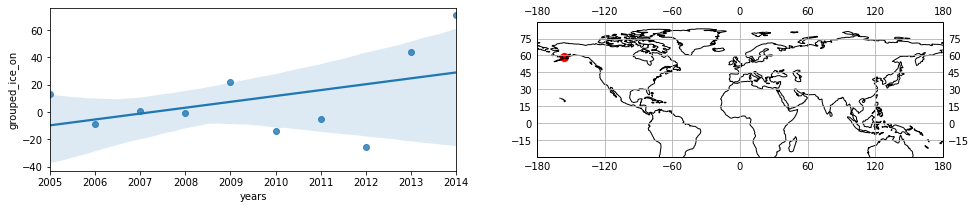

  1%|          | 1/104 [00:00<01:26,  1.20it/s]

58.75_-155.75
Slope is 3.030303030302663


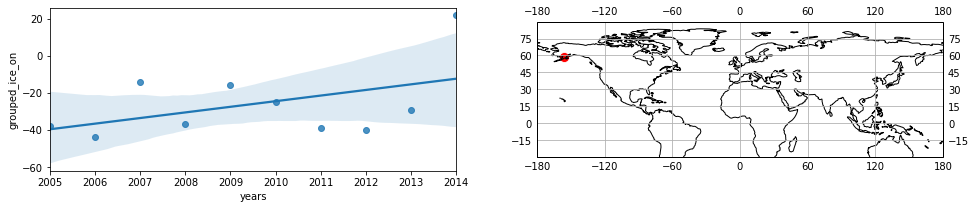

  2%|▏         | 2/104 [00:01<01:30,  1.13it/s]

59.25_-155.25
Slope is 2.693939393938933


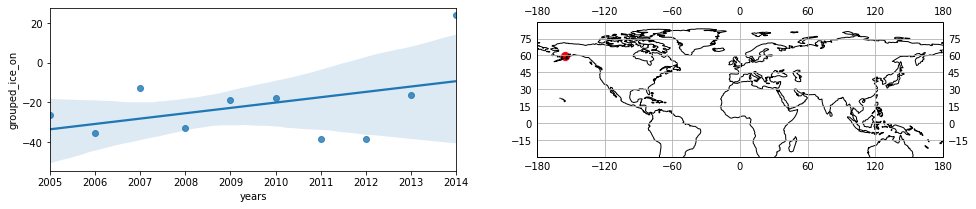

  3%|▎         | 3/104 [00:02<01:30,  1.12it/s]

52.25_13.75
Slope is 2.1330827067669347


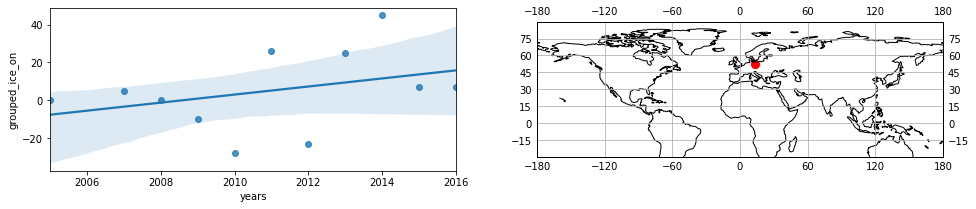

  4%|▍         | 4/104 [00:03<01:32,  1.08it/s]

60.75_-153.75
Slope is 2.027272727272445


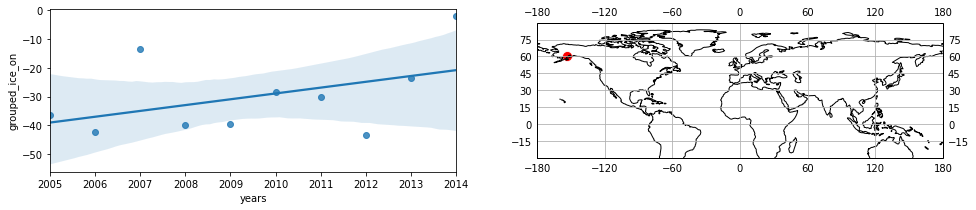

  5%|▍         | 5/104 [00:04<01:34,  1.05it/s]

60.25_-150.25
Slope is 1.957575757575208


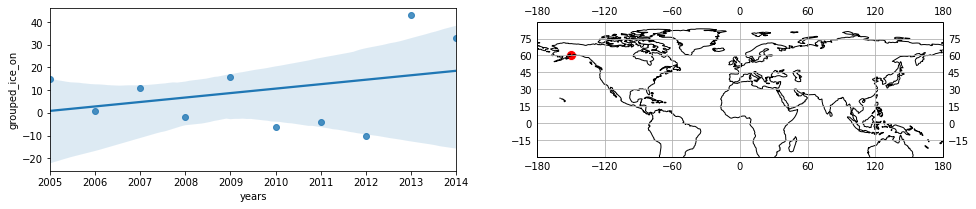

  6%|▌         | 6/104 [00:05<01:31,  1.07it/s]

65.75_15.75
Slope is 1.591208791208814


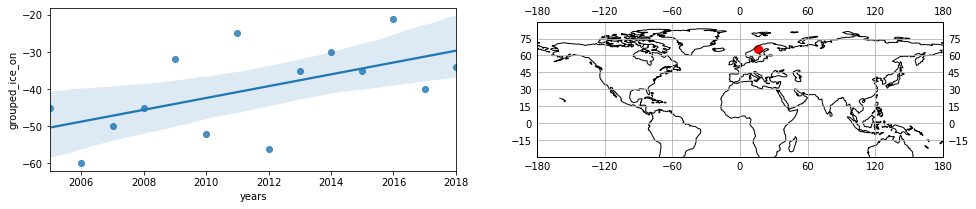

  7%|▋         | 7/104 [00:06<01:26,  1.12it/s]

68.25_23.75
Slope is 1.3354525056096334


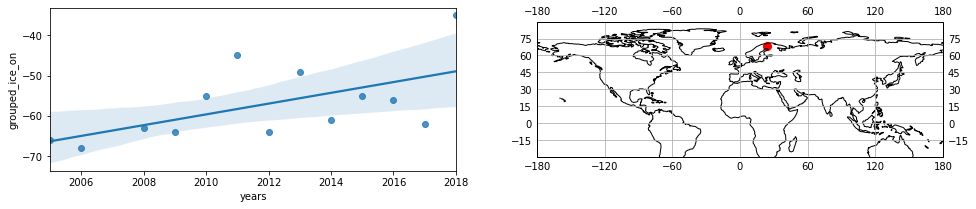

  8%|▊         | 8/104 [00:07<01:24,  1.13it/s]

47.25_-93.75
Slope is 1.1556693306694088


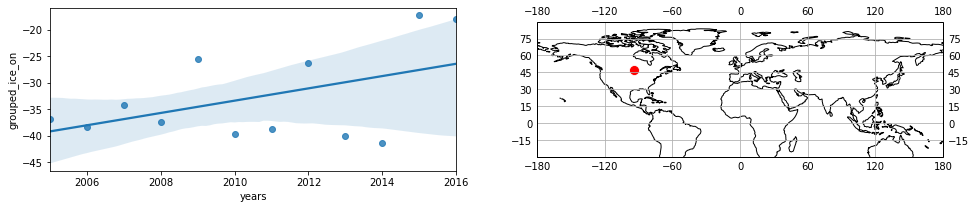

  9%|▊         | 9/104 [00:08<01:27,  1.08it/s]

46.75_-93.25
Slope is 1.145820845820948


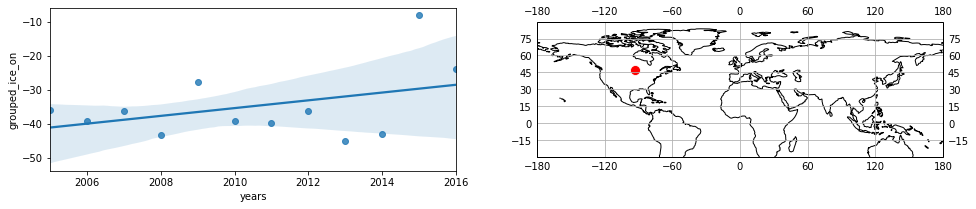

 10%|▉         | 10/104 [00:09<01:29,  1.05it/s]

45.75_-95.25
Slope is 1.0480283605284413


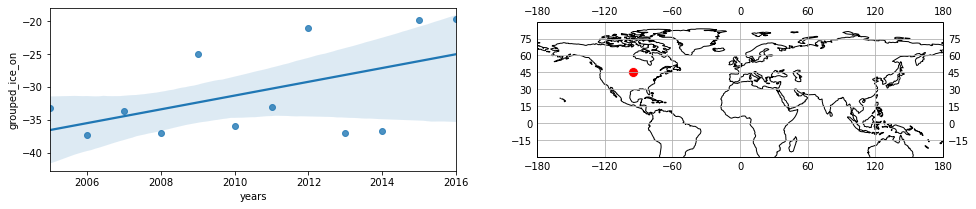

 11%|█         | 11/104 [00:10<01:29,  1.04it/s]

62.75_24.25
Slope is 1.0351648351648477


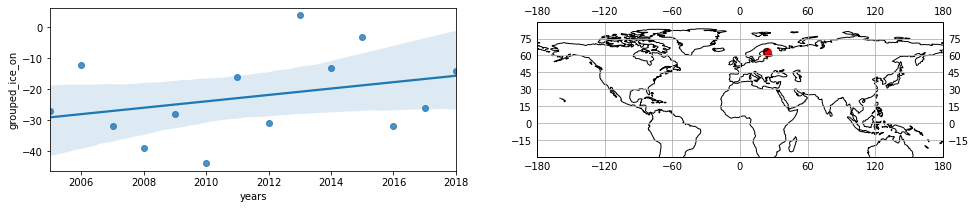

 12%|█▏        | 12/104 [00:11<01:28,  1.04it/s]

46.25_-95.75
Slope is 0.9530885780886132


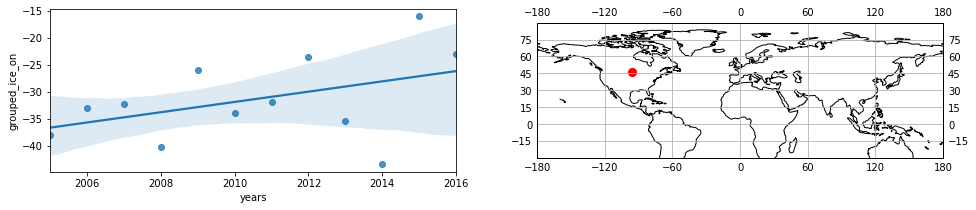

 12%|█▎        | 13/104 [00:12<01:27,  1.04it/s]

62.75_25.25
Slope is 0.9230769230770585


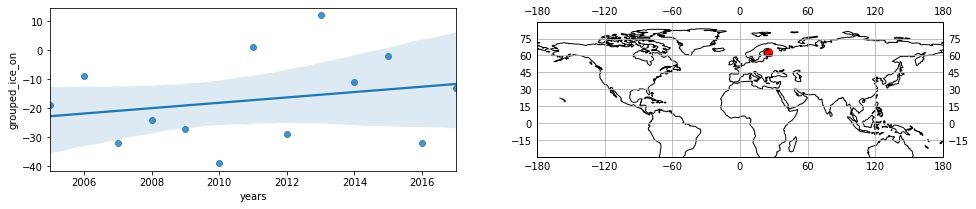

 13%|█▎        | 14/104 [00:13<01:25,  1.05it/s]

61.25_22.25
Slope is 0.9156853509185454


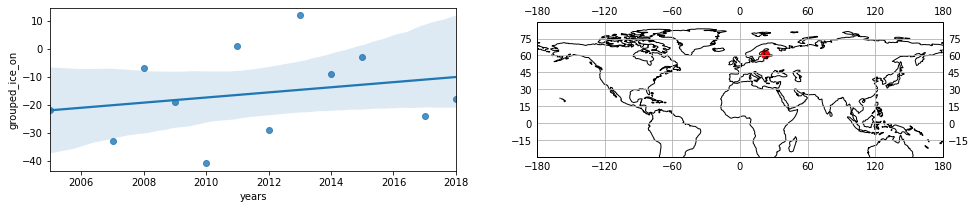

 14%|█▍        | 15/104 [00:14<01:24,  1.05it/s]

44.75_-93.25
Slope is 0.8875781203096853


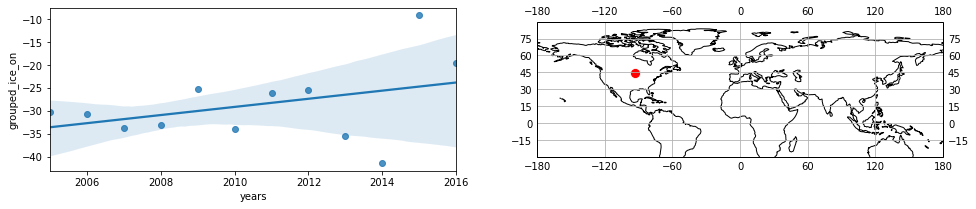

 15%|█▌        | 16/104 [00:15<01:23,  1.05it/s]

61.25_-150.75
Slope is 0.8848484848484994


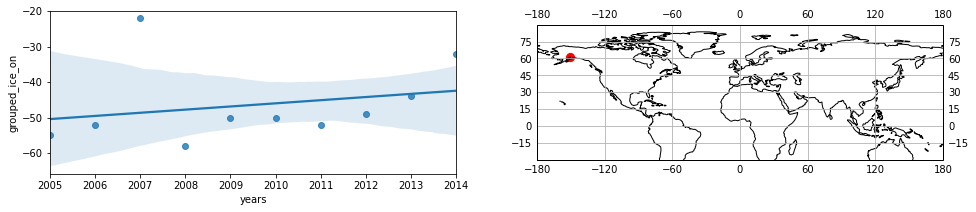

 16%|█▋        | 17/104 [00:17<01:51,  1.29s/it]

46.25_-94.75
Slope is 0.8350000000000151


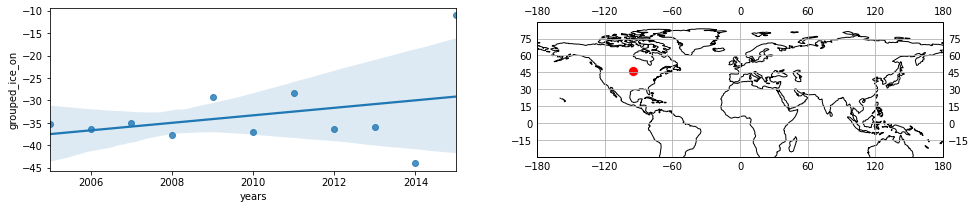

 17%|█▋        | 18/104 [00:18<01:43,  1.21s/it]

45.25_-92.75
Slope is 0.8141507615192382


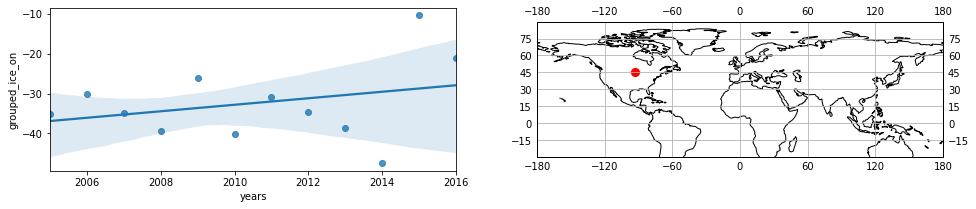

 18%|█▊        | 19/104 [00:19<01:36,  1.13s/it]

44.25_-93.75
Slope is 0.7656676656677113


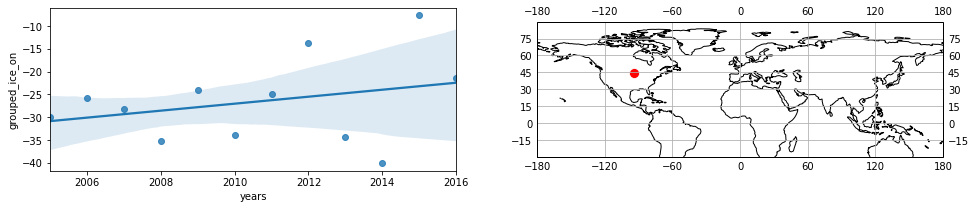

 19%|█▉        | 20/104 [00:19<01:27,  1.04s/it]

60.75_-150.75
Slope is 0.7454545454546162


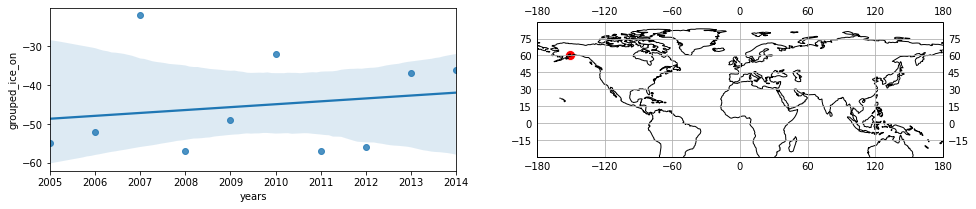

 20%|██        | 21/104 [00:20<01:23,  1.01s/it]

46.75_-92.25
Slope is 0.7415151515151535


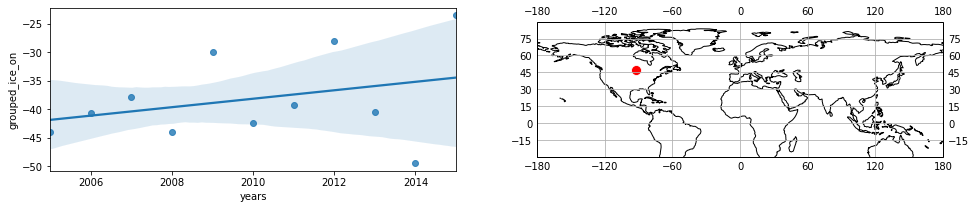

 21%|██        | 22/104 [00:21<01:22,  1.01s/it]

68.75_28.25
Slope is 0.731868131868151


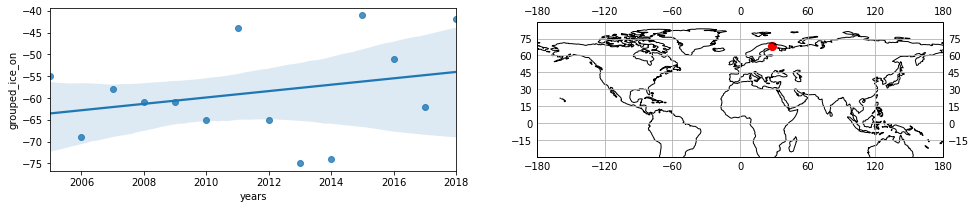

 22%|██▏       | 23/104 [00:22<01:21,  1.00s/it]

46.25_-93.75
Slope is 0.7300442204854671


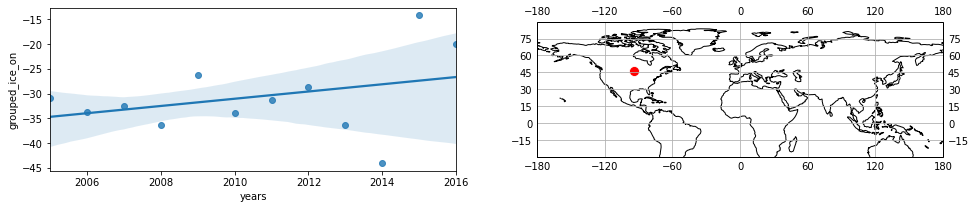

 23%|██▎       | 24/104 [00:23<01:18,  1.01it/s]

48.25_-90.25
Slope is 0.6848484848485796


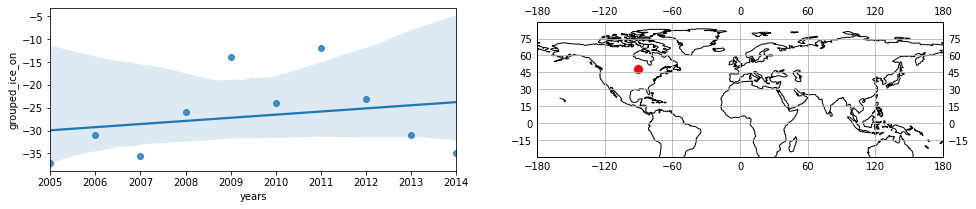

 24%|██▍       | 25/104 [00:24<01:19,  1.00s/it]

63.25_25.25
Slope is 0.6648351648352857


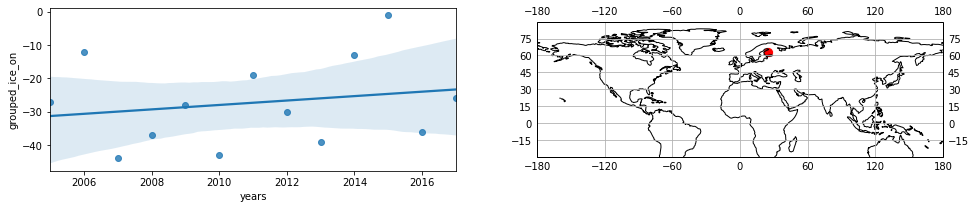

 25%|██▌       | 26/104 [00:26<01:29,  1.15s/it]

46.75_-92.75
Slope is 0.6459720730397245


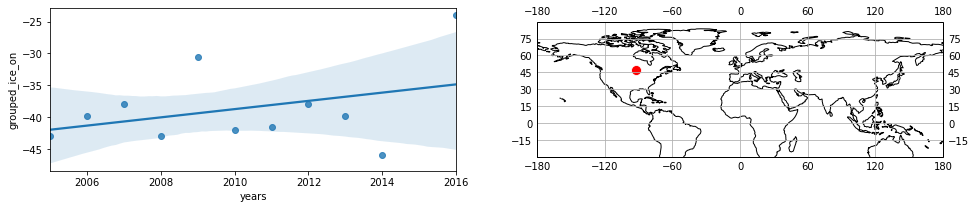

 26%|██▌       | 27/104 [00:27<01:34,  1.23s/it]

53.75_108.25
Slope is 0.6395604395604465


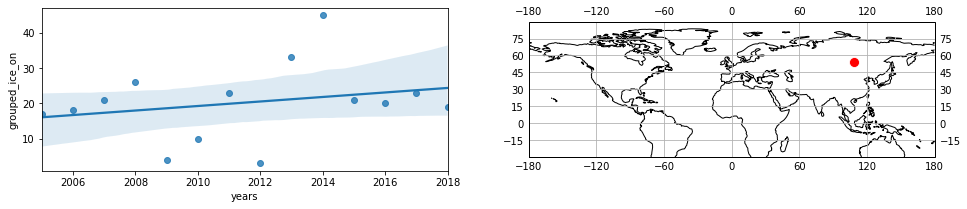

 27%|██▋       | 28/104 [00:29<01:39,  1.31s/it]

69.25_20.75
Slope is 0.6285714285714539


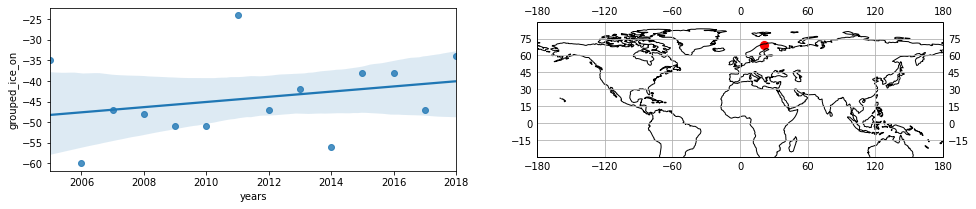

 28%|██▊       | 29/104 [00:30<01:31,  1.23s/it]

62.75_24.75
Slope is 0.5906593406593806


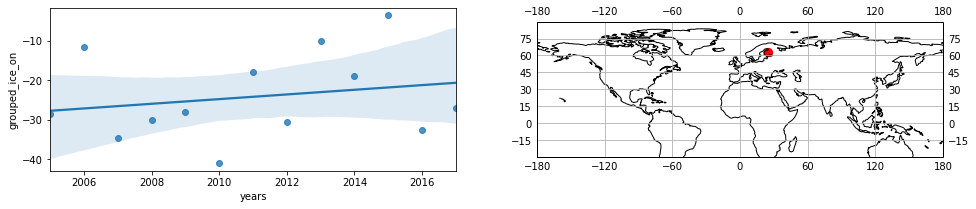

 29%|██▉       | 30/104 [00:31<01:27,  1.18s/it]

47.75_-94.75
Slope is 0.5812954091363876


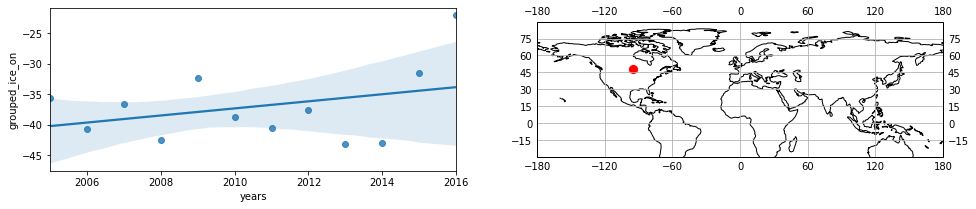

 30%|██▉       | 31/104 [00:32<01:20,  1.10s/it]

43.25_-75.75
Slope is 0.5736263736263663


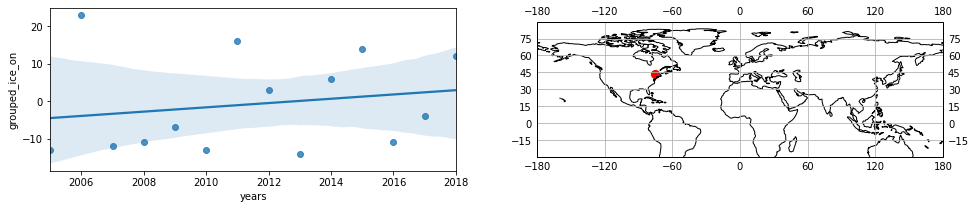

 31%|███       | 32/104 [00:33<01:19,  1.10s/it]

61.25_26.25
Slope is 0.5629370629371391


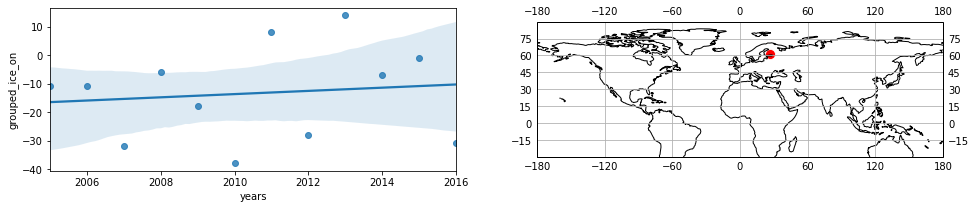

 32%|███▏      | 33/104 [00:34<01:16,  1.07s/it]

63.25_25.75
Slope is 0.5326530612244609


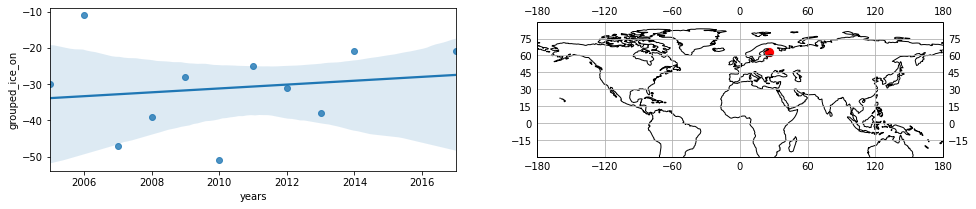

 33%|███▎      | 34/104 [00:35<01:12,  1.04s/it]

69.25_26.75
Slope is 0.5210896309314927


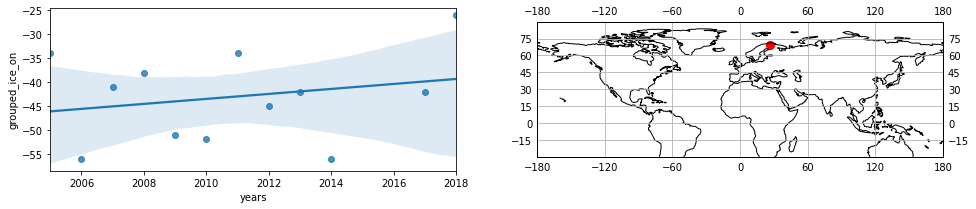

 34%|███▎      | 35/104 [00:36<01:06,  1.04it/s]

45.25_-93.25
Slope is 0.5102661184166201


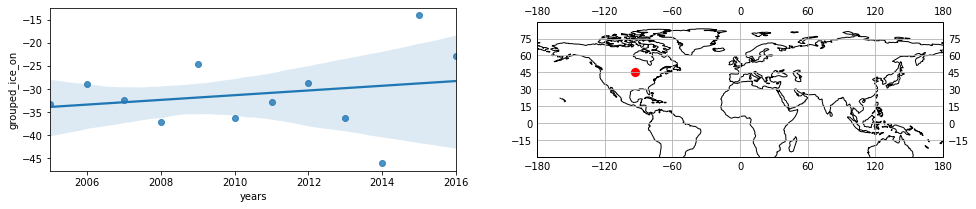

 35%|███▍      | 36/104 [00:36<00:59,  1.15it/s]

47.75_-91.75
Slope is 0.47435897435904906


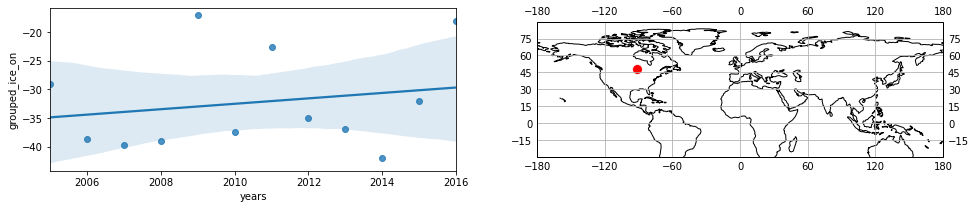

 36%|███▌      | 37/104 [00:37<01:03,  1.06it/s]

45.75_-94.75
Slope is 0.4575507825507912


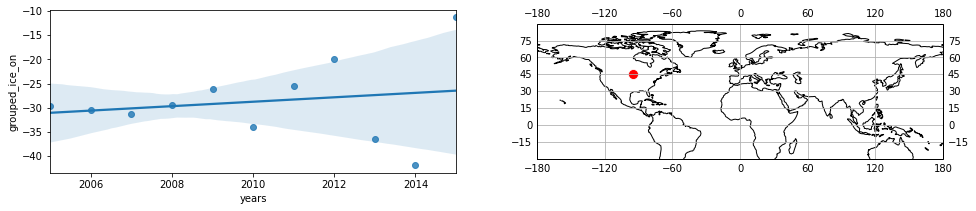

 37%|███▋      | 38/104 [00:38<01:03,  1.03it/s]

47.75_-93.25
Slope is 0.4264580873671777


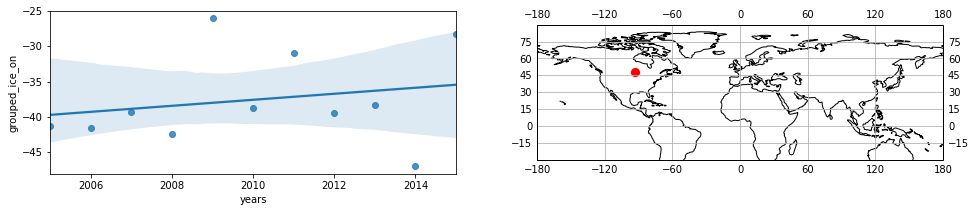

 38%|███▊      | 39/104 [00:40<01:17,  1.19s/it]

64.25_27.25
Slope is 0.41700680272105917


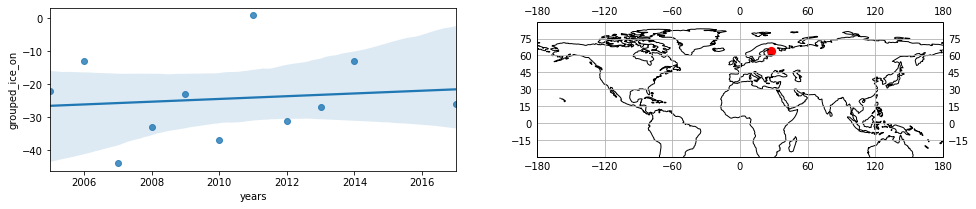

 38%|███▊      | 40/104 [00:41<01:11,  1.12s/it]

45.25_-94.25
Slope is 0.4025839545070786


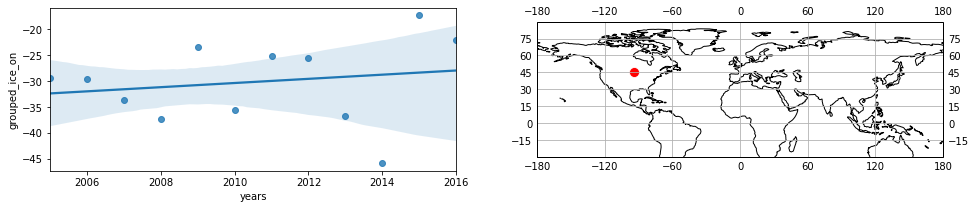

 39%|███▉      | 41/104 [00:42<01:05,  1.03s/it]

44.75_-93.75
Slope is 0.3891757592365166


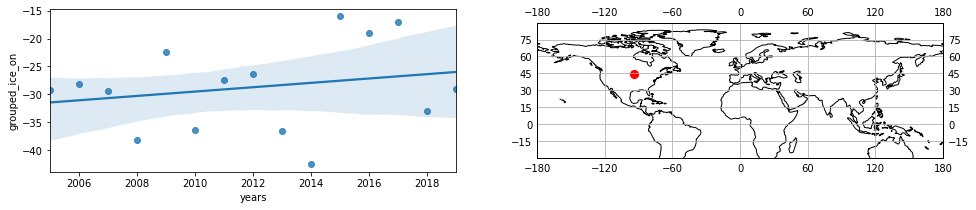

 40%|████      | 42/104 [00:43<01:01,  1.00it/s]

62.75_26.75
Slope is 0.3791208791208761


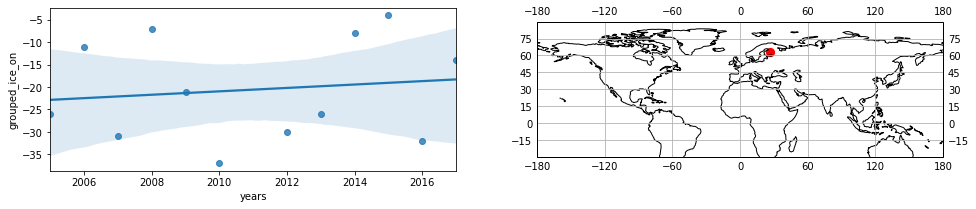

 41%|████▏     | 43/104 [00:44<01:00,  1.01it/s]

45.25_-93.75
Slope is 0.3618073593073641


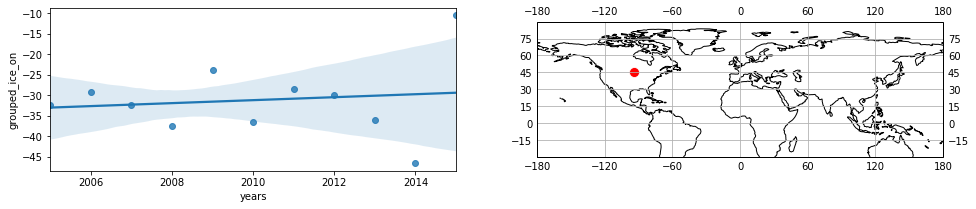

 42%|████▏     | 44/104 [00:45<00:59,  1.01it/s]

63.75_29.25
Slope is 0.3010989010989116


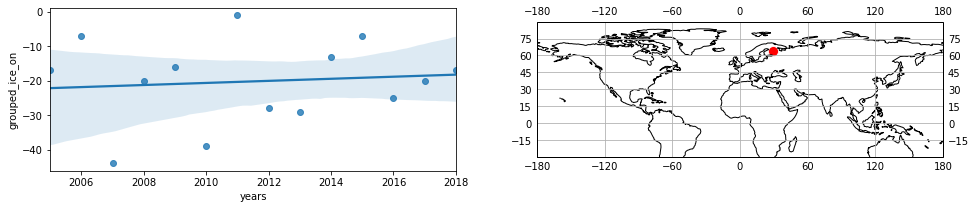

 43%|████▎     | 45/104 [00:46<00:57,  1.03it/s]

47.25_-94.75
Slope is 0.28861201727337205


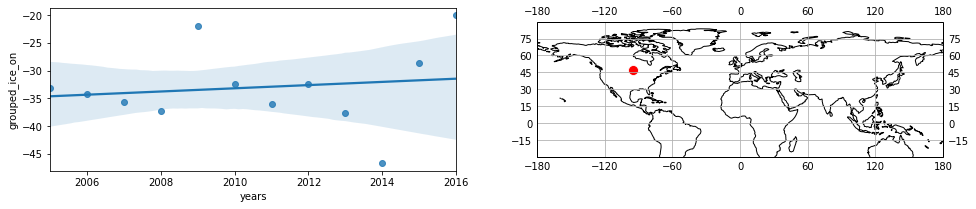

 44%|████▍     | 46/104 [00:47<00:58,  1.01s/it]

45.75_-91.75
Slope is 0.18749999999999312


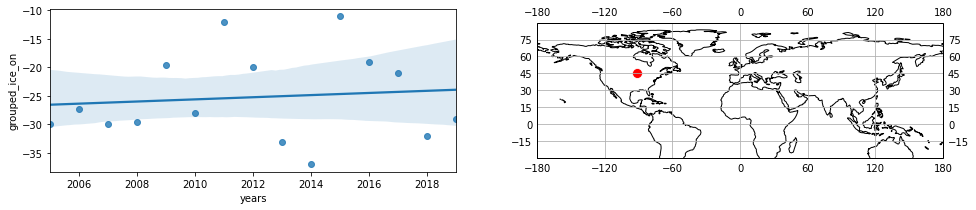

 45%|████▌     | 47/104 [00:48<01:00,  1.07s/it]

44.75_-94.25
Slope is 0.18268398268399233


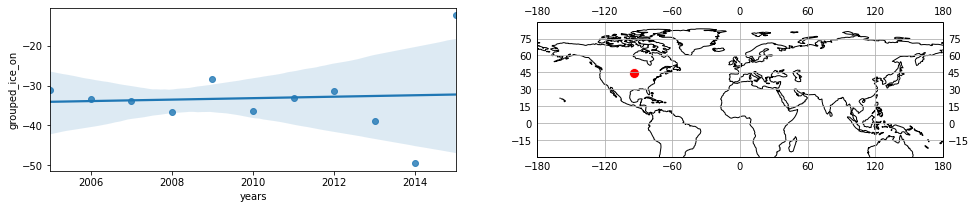

 46%|████▌     | 48/104 [00:49<00:58,  1.04s/it]

45.75_-94.25
Slope is 0.16472138972138417


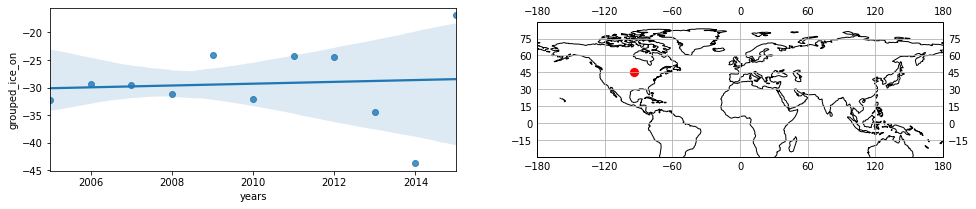

 47%|████▋     | 49/104 [00:50<00:56,  1.02s/it]

43.75_-73.75
Slope is 0.14058956916082055


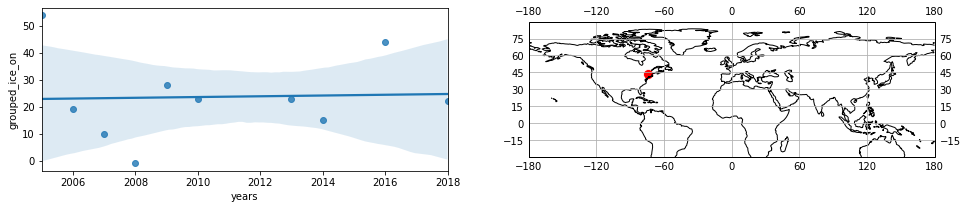

 48%|████▊     | 50/104 [00:51<00:55,  1.02s/it]

61.75_26.25
Slope is 0.1289776574136075


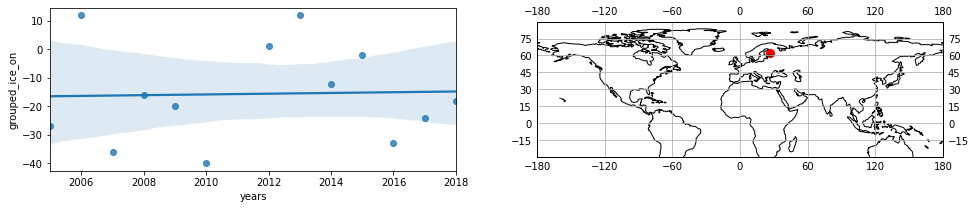

 49%|████▉     | 51/104 [00:52<00:55,  1.05s/it]

45.25_-94.75
Slope is 0.12266679399031988


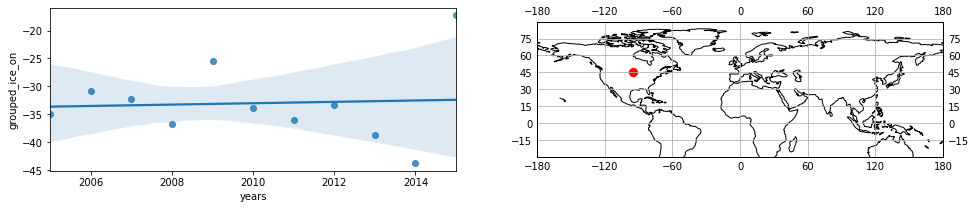

 50%|█████     | 52/104 [00:53<00:53,  1.03s/it]

42.25_-71.25
Slope is 0.0769230769228505


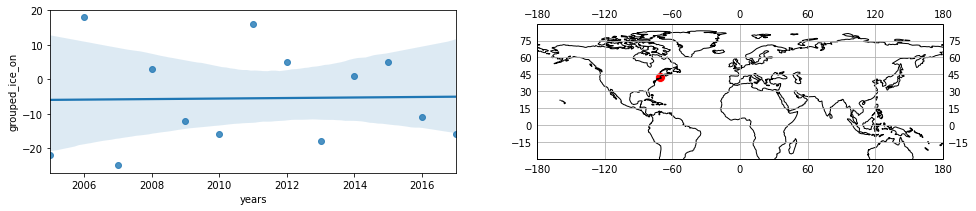

 51%|█████     | 53/104 [00:54<00:51,  1.01s/it]

45.75_-93.25
Slope is 0.047474747474747225


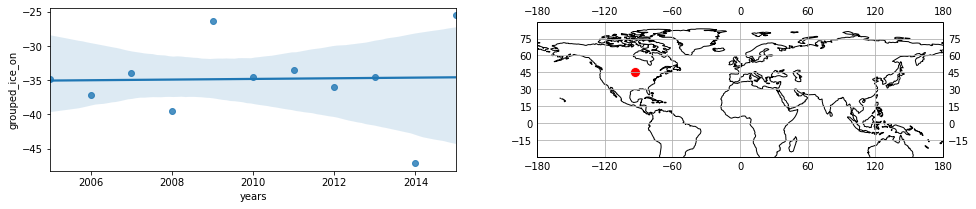

 52%|█████▏    | 54/104 [00:55<00:51,  1.02s/it]

47.75_-93.75
Slope is 0.01767714437397494


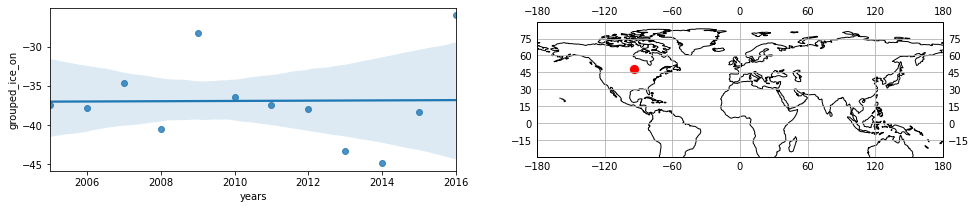

 53%|█████▎    | 55/104 [00:56<00:54,  1.11s/it]

46.75_-95.75
Slope is 0.0022581912899600765


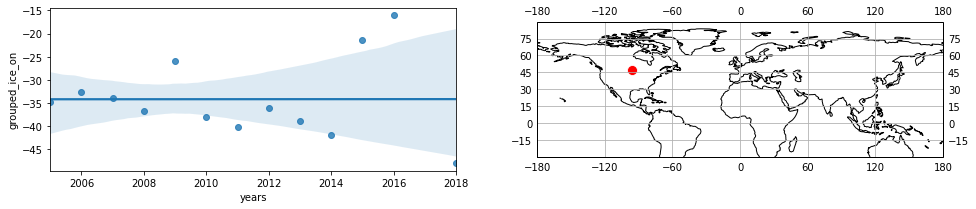

 54%|█████▍    | 56/104 [00:58<00:53,  1.11s/it]

46.75_-93.75
Slope is 0.0009906759906940232


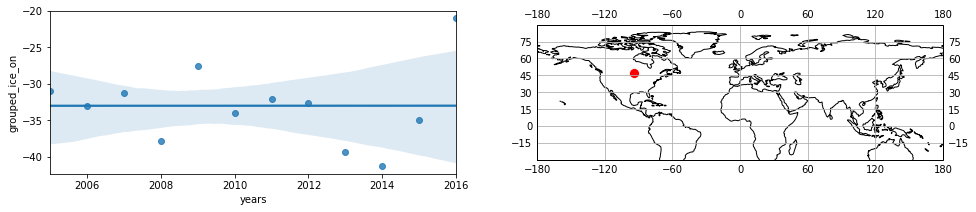

 55%|█████▍    | 57/104 [00:59<00:52,  1.12s/it]

44.25_-93.25
Slope is -0.026158730158735155


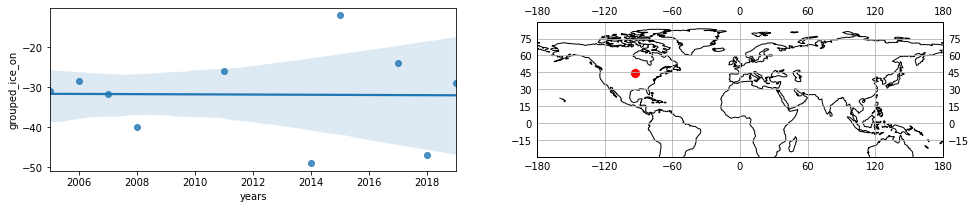

 56%|█████▌    | 58/104 [01:00<00:48,  1.06s/it]

46.75_-94.25
Slope is -0.06719769682382859


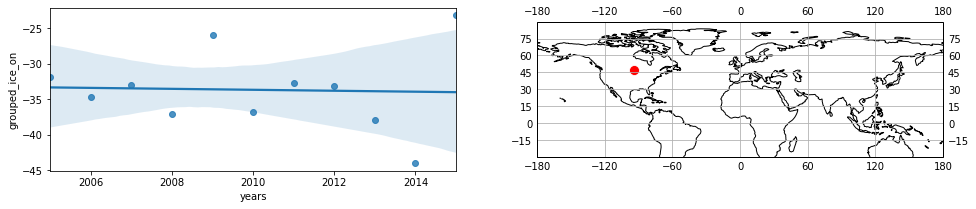

 57%|█████▋    | 59/104 [01:01<00:45,  1.02s/it]

62.75_27.25
Slope is -0.0857142857142843


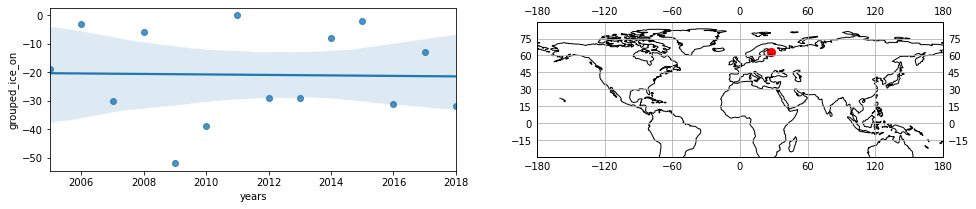

 58%|█████▊    | 60/104 [01:02<00:45,  1.02s/it]

62.75_23.25
Slope is -0.08791208791208592


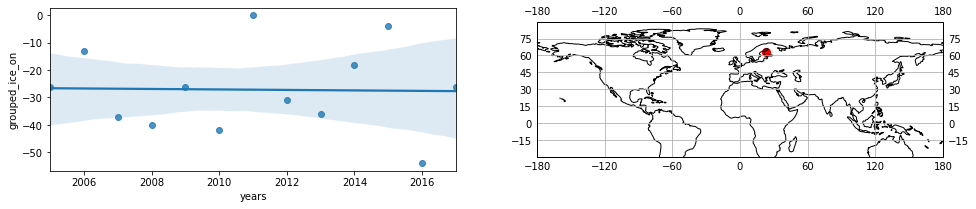

 59%|█████▊    | 61/104 [01:04<00:59,  1.38s/it]

62.25_28.75
Slope is -0.10329670329670215


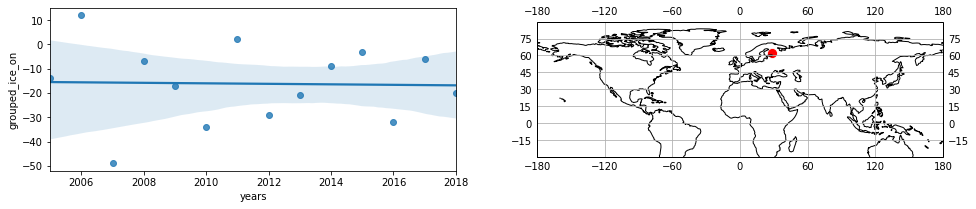

 60%|█████▉    | 62/104 [01:05<00:55,  1.32s/it]

47.25_-92.25
Slope is -0.10514069264070791


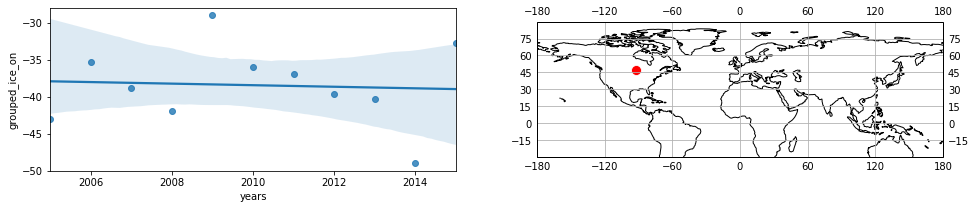

 61%|██████    | 63/104 [01:06<00:54,  1.34s/it]

47.25_-95.25
Slope is -0.15145973607963237


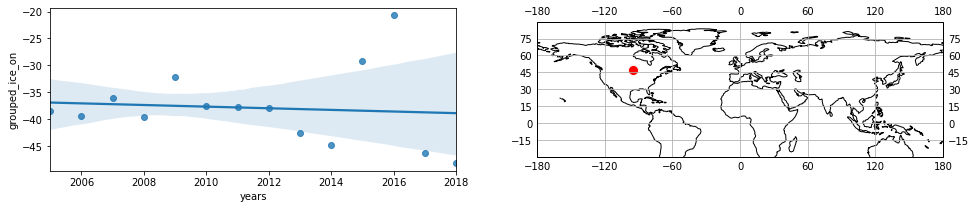

 62%|██████▏   | 64/104 [01:07<00:49,  1.24s/it]

60.25_15.75
Slope is -0.17802197802197817


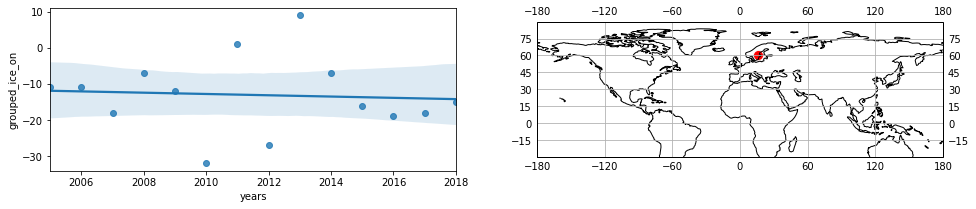

 62%|██████▎   | 65/104 [01:08<00:44,  1.14s/it]

46.25_-89.75
Slope is -0.18549450549451252


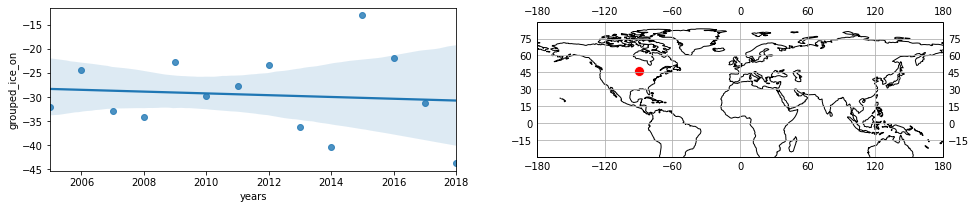

 63%|██████▎   | 66/104 [01:09<00:41,  1.09s/it]

44.25_-79.75
Slope is -0.1892857142857507


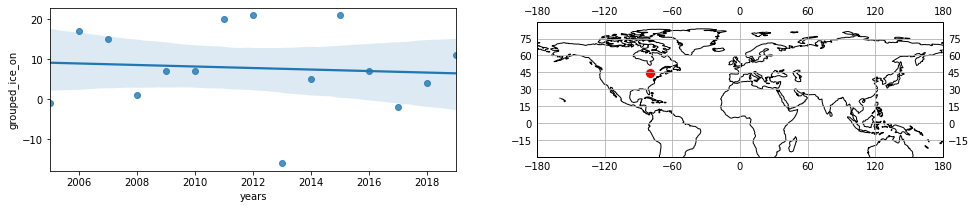

 64%|██████▍   | 67/104 [01:10<00:38,  1.04s/it]

46.25_-94.25
Slope is -0.19818181818182357


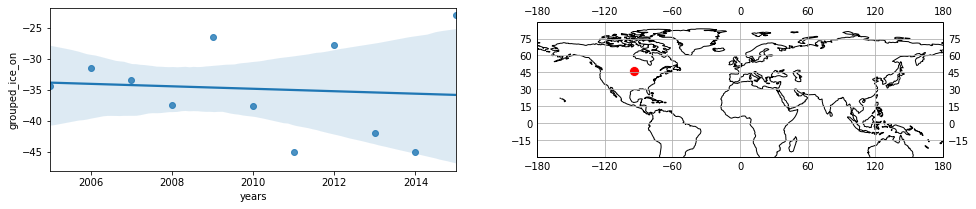

 65%|██████▌   | 68/104 [01:11<00:36,  1.02s/it]

64.25_27.75
Slope is -0.2153846153846216


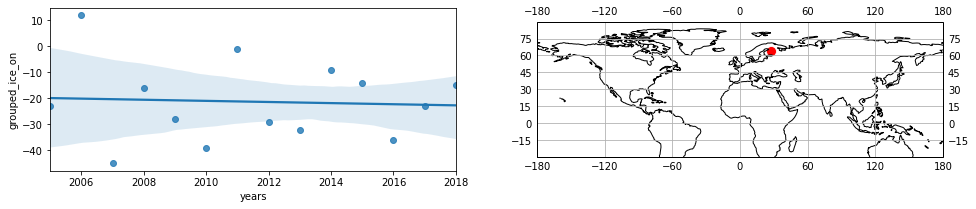

 66%|██████▋   | 69/104 [01:12<00:34,  1.01it/s]

67.75_20.75
Slope is -0.22197802197800875


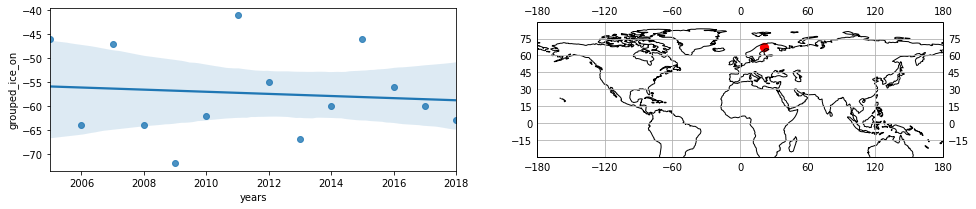

 67%|██████▋   | 70/104 [01:13<00:32,  1.06it/s]

61.75_29.25
Slope is -0.24835164835165635


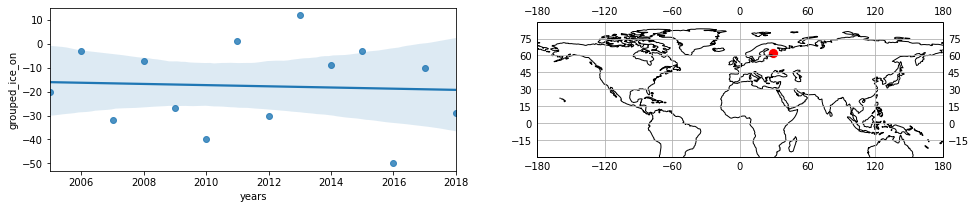

 68%|██████▊   | 71/104 [01:14<00:32,  1.00it/s]

45.75_-89.75
Slope is -0.26373626373636394


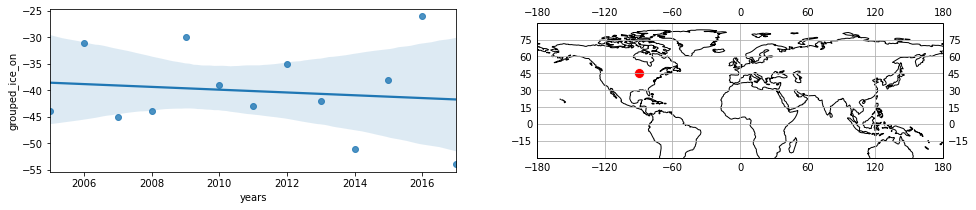

 69%|██████▉   | 72/104 [01:15<00:36,  1.13s/it]

47.25_-93.25
Slope is -0.2790687090687092


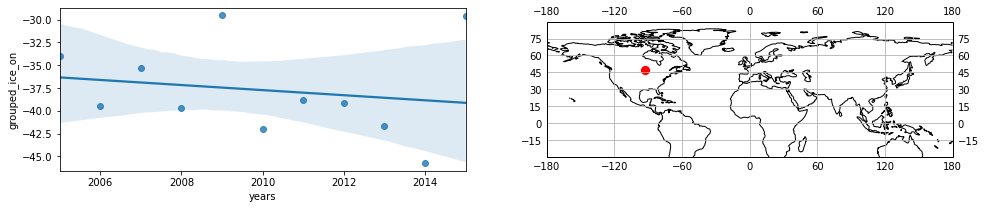

 70%|███████   | 73/104 [01:17<00:34,  1.10s/it]

61.25_14.75
Slope is -0.3030303030301795


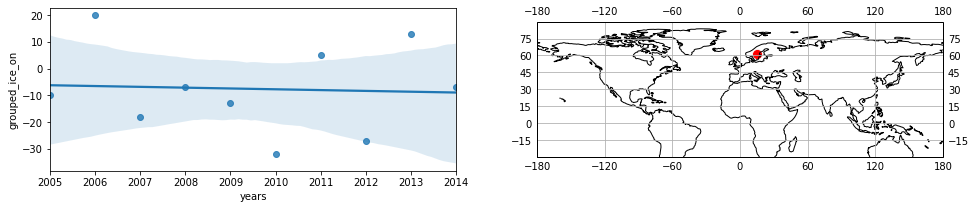

 71%|███████   | 74/104 [01:17<00:31,  1.05s/it]

63.25_26.75
Slope is -0.3662830060934597


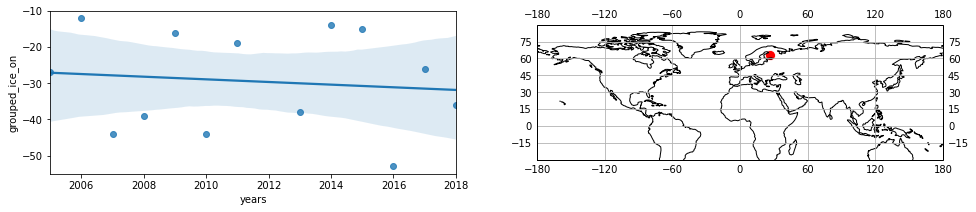

 72%|███████▏  | 75/104 [01:18<00:28,  1.00it/s]

43.75_-89.25
Slope is -0.3678571428570847


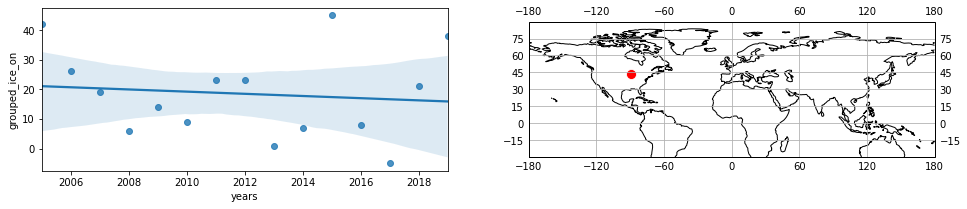

 73%|███████▎  | 76/104 [01:19<00:27,  1.03it/s]

61.25_-152.75
Slope is -0.3696969696971899


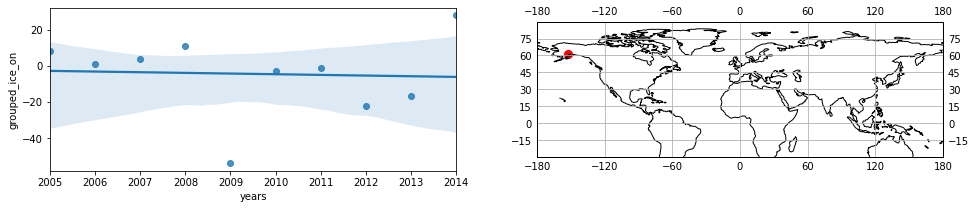

 74%|███████▍  | 77/104 [01:20<00:27,  1.03s/it]

42.25_-85.25
Slope is -0.37692307692308397


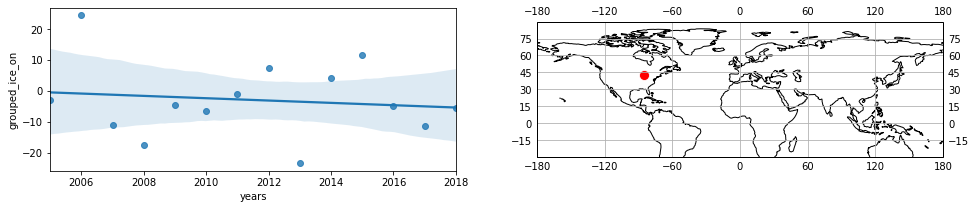

 75%|███████▌  | 78/104 [01:22<00:27,  1.07s/it]

46.75_-94.75
Slope is -0.3944797626615488


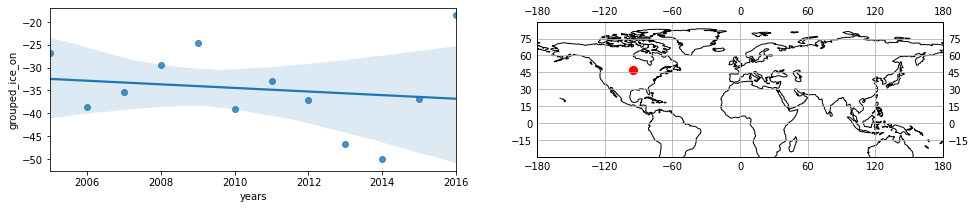

 76%|███████▌  | 79/104 [01:23<00:26,  1.04s/it]

45.25_-78.75
Slope is -0.39780219780221393


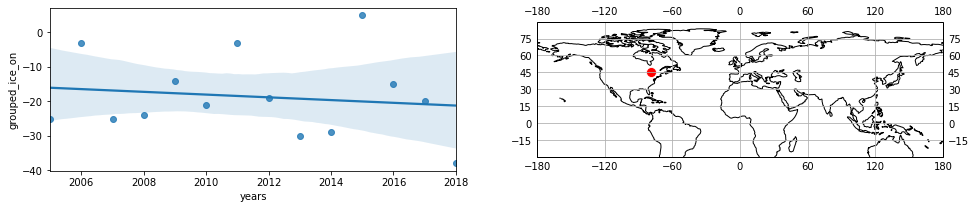

 77%|███████▋  | 80/104 [01:23<00:23,  1.02it/s]

45.25_-95.25
Slope is -0.4008417508419968


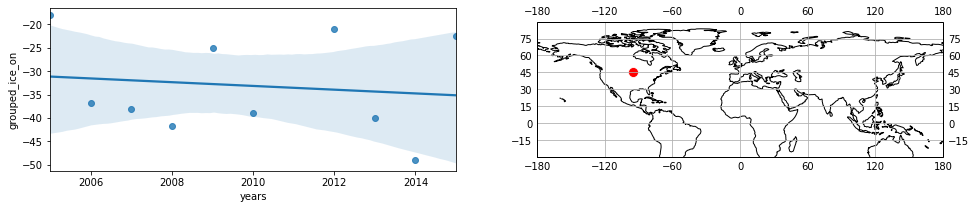

 78%|███████▊  | 81/104 [01:24<00:22,  1.04it/s]

61.25_24.25
Slope is -0.4527472527472709


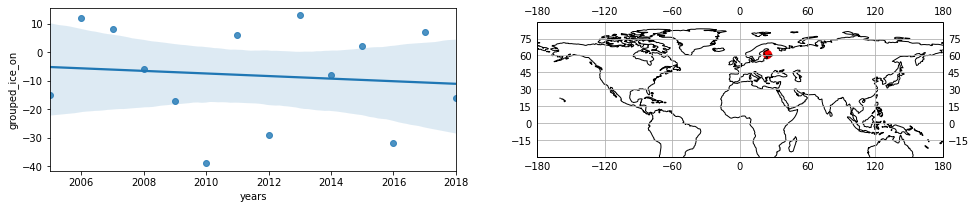

 79%|███████▉  | 82/104 [01:25<00:20,  1.05it/s]

62.75_27.75
Slope is -0.6021978021978202


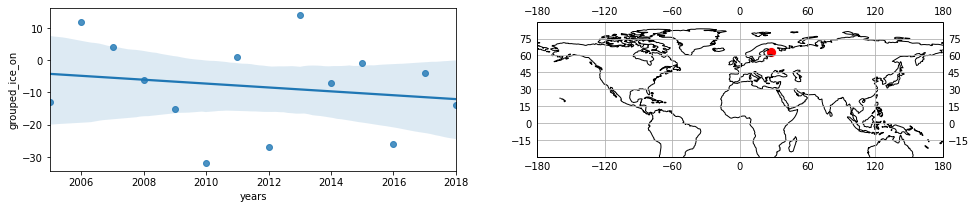

 80%|███████▉  | 83/104 [01:27<00:24,  1.15s/it]

46.75_-96.25
Slope is -0.7011019283746678


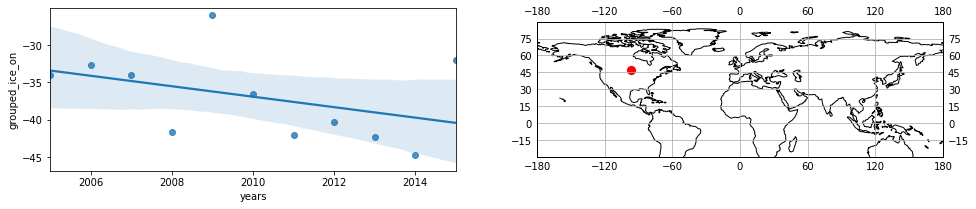

 81%|████████  | 84/104 [01:28<00:21,  1.07s/it]

61.25_-151.75
Slope is -0.7151515151512555


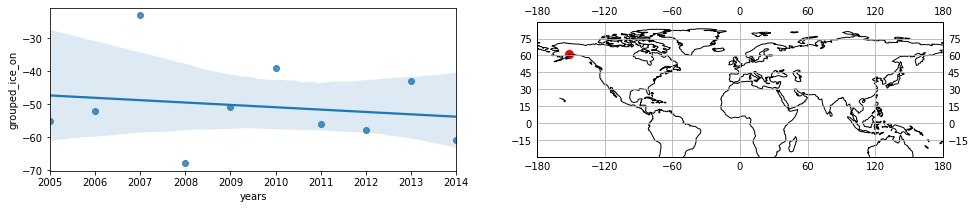

 82%|████████▏ | 85/104 [01:29<00:19,  1.02s/it]

61.75_23.75
Slope is -0.7230769230769538


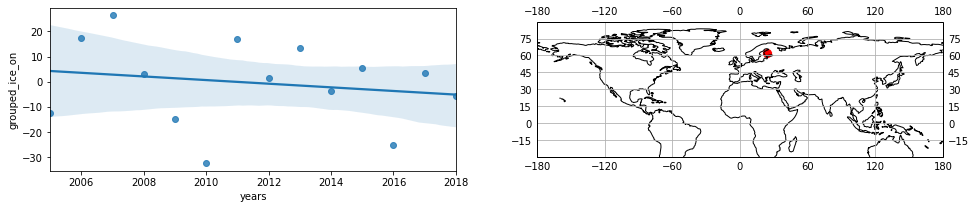

 83%|████████▎ | 86/104 [01:30<00:18,  1.01s/it]

43.25_-89.25
Slope is -0.7273809523810122


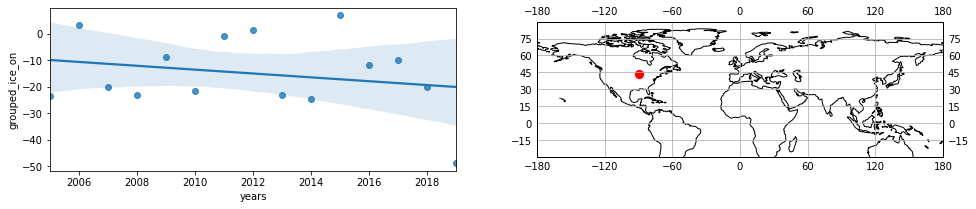

 84%|████████▎ | 87/104 [01:31<00:16,  1.01it/s]

46.75_-95.25
Slope is -0.738484848484867


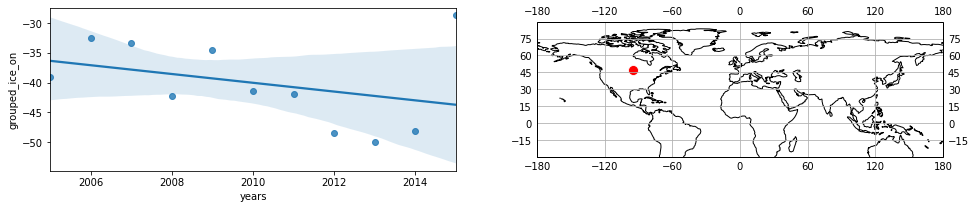

 85%|████████▍ | 88/104 [01:31<00:15,  1.05it/s]

61.25_27.75
Slope is -0.7757575757572786


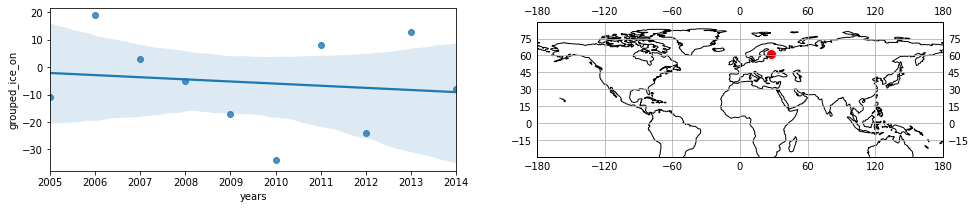

 86%|████████▌ | 89/104 [01:32<00:14,  1.02it/s]

63.75_25.25
Slope is -0.7824175824175973


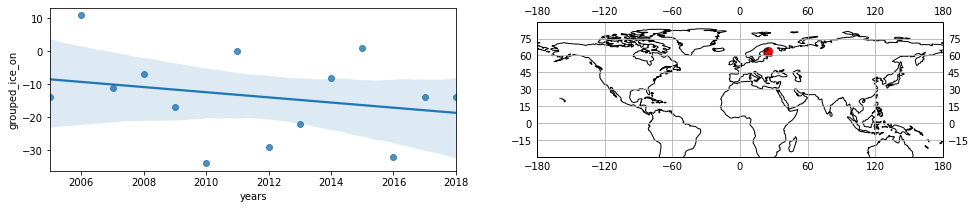

 87%|████████▋ | 90/104 [01:33<00:13,  1.05it/s]

47.75_-92.25
Slope is -0.8303030303030323


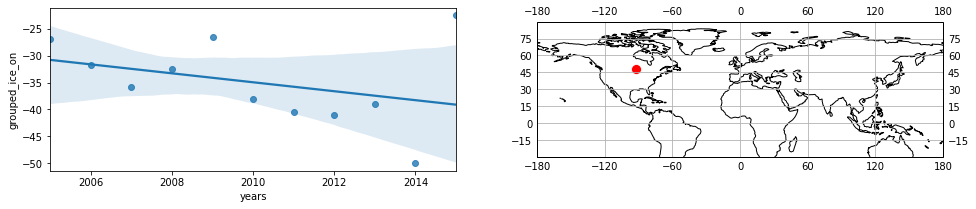

 88%|████████▊ | 91/104 [01:34<00:12,  1.06it/s]

63.75_24.75
Slope is -0.8527472527472604


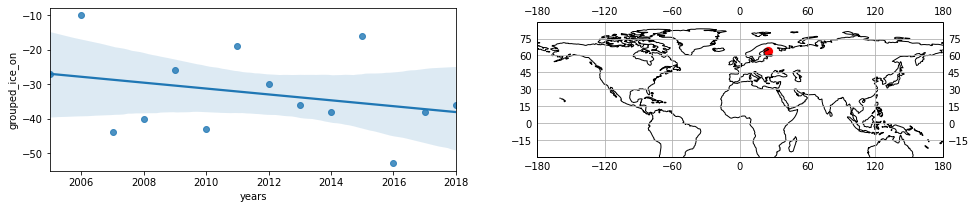

 88%|████████▊ | 92/104 [01:35<00:11,  1.05it/s]

63.25_23.75
Slope is -0.879120879120898


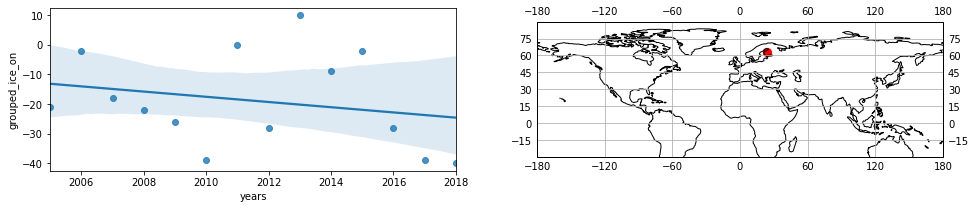

 89%|████████▉ | 93/104 [01:36<00:10,  1.07it/s]

65.75_25.75
Slope is -0.896703296703298


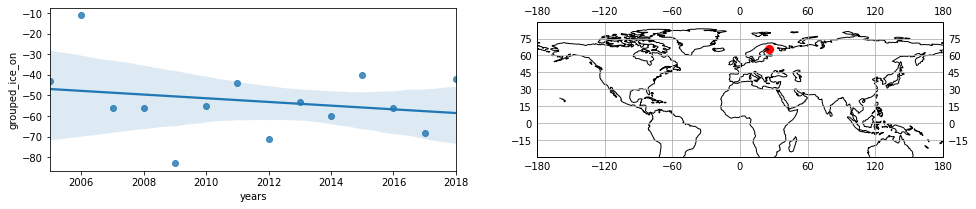

 90%|█████████ | 94/104 [01:37<00:09,  1.06it/s]

47.25_-95.75
Slope is -1.0692866161614805


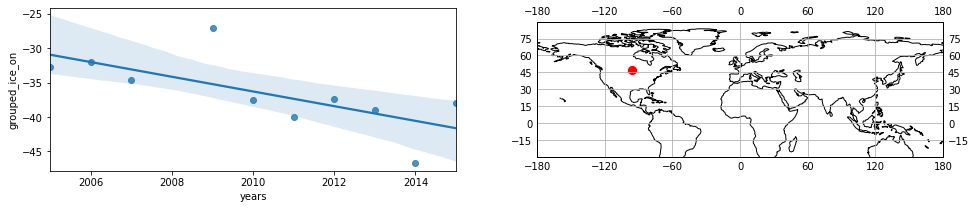

 91%|█████████▏| 95/104 [01:38<00:08,  1.09it/s]

61.25_25.75
Slope is -1.1336996336996525


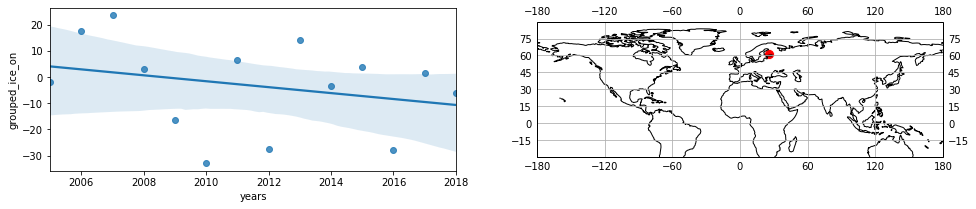

 92%|█████████▏| 96/104 [01:39<00:07,  1.07it/s]

60.75_25.75
Slope is -1.1736263736264008


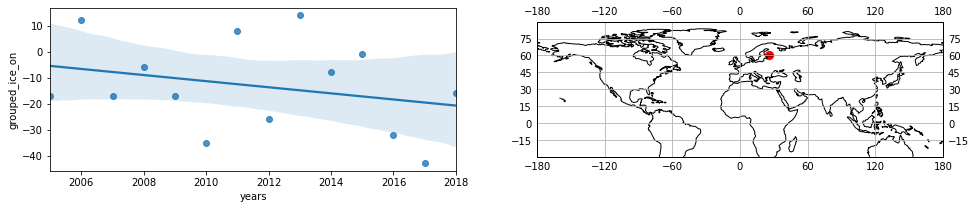

 93%|█████████▎| 97/104 [01:40<00:06,  1.09it/s]

60.75_23.75
Slope is -1.2081922816523594


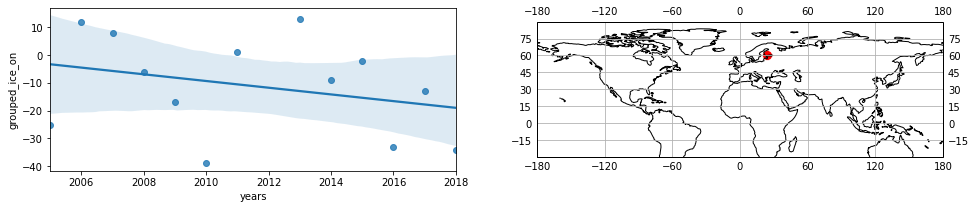

 94%|█████████▍| 98/104 [01:41<00:05,  1.06it/s]

62.25_23.75
Slope is -1.2483516483516828


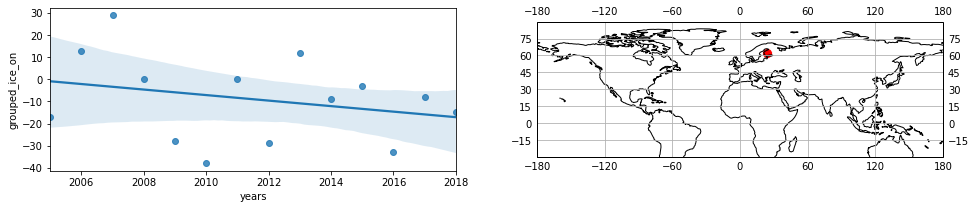

 95%|█████████▌| 99/104 [01:42<00:04,  1.04it/s]

64.25_29.75
Slope is -1.2967032967034167


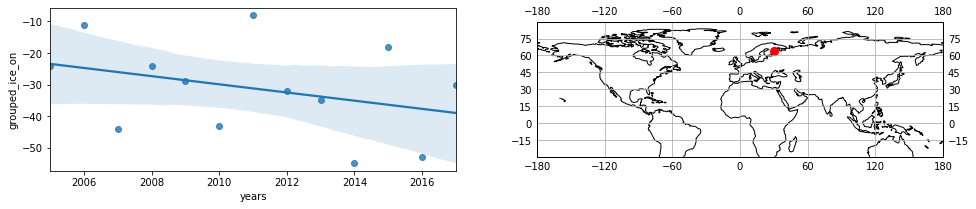

 96%|█████████▌| 100/104 [01:43<00:03,  1.04it/s]

42.75_-74.75
Slope is -1.3873581847649983


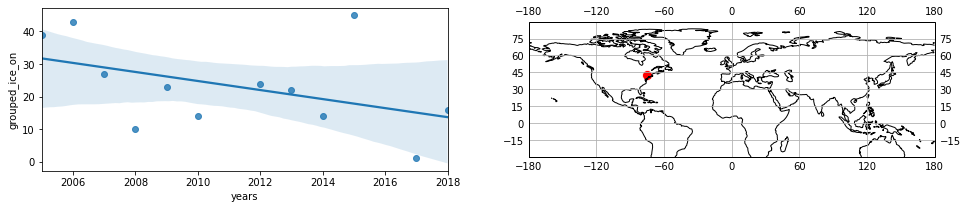

 97%|█████████▋| 101/104 [01:44<00:02,  1.05it/s]

42.75_-88.25
Slope is -1.898703403565606


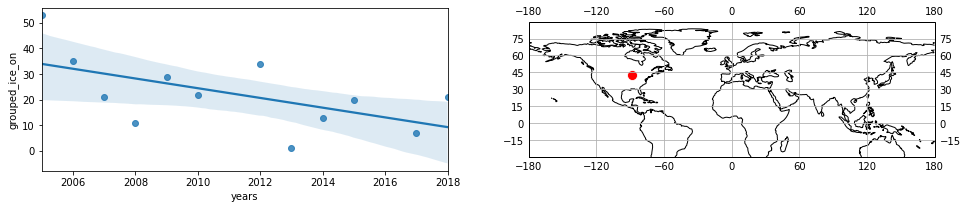

 98%|█████████▊| 102/104 [01:45<00:01,  1.03it/s]

46.75_-90.75
Slope is -1.9360019175455545


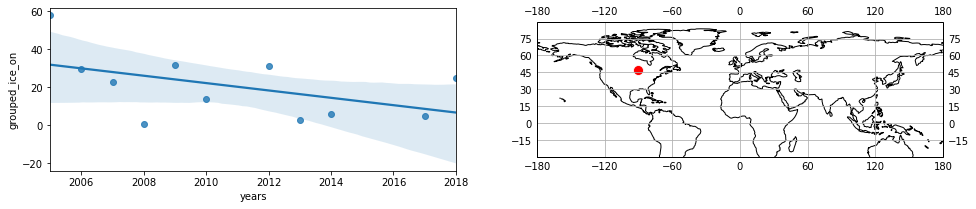

 99%|█████████▉| 103/104 [01:46<00:00,  1.02it/s]

61.25_24.75
Slope is -3.409288824383734


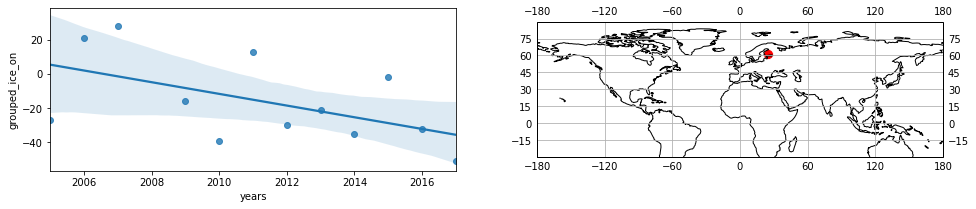

100%|██████████| 104/104 [01:47<00:00,  1.03s/it]


In [89]:
for location in tqdm(df_orig_ice_on_slopes['lat_long']):
    lat, long = location.split('_')
    
    temp_ice_on = df_after_2005_ice_on.loc[df_after_2005_ice_on['lat_long'] == location]
    temp_ice_on = temp_ice_on[['years', 'grouped_ice_on']]
    temp_ice_on.drop_duplicates(inplace=True)
    
    if len(temp_ice_on) < 10:
        continue
        
    x_cons = sm.add_constant(temp_ice_on['years'])
    model = sm.OLS(temp_ice_on['grouped_ice_on'], x_cons).fit()
    slope = model.params.values[1]
    
#     print(location)
#     print(f'Slope is {slope}')
    
#     f, axes = graph.subplots(1, 2, figsize=(16, 3)) 
    
#     sns.regplot(x = temp_ice_on['years'], y = temp_ice_on['grouped_ice_on'], ax=axes[0])   
    
#     ax2 = graph.subplot(122, projection=ccrs.PlateCarree())
#     ax2.coastlines()
#     ax2.gridlines(draw_labels=True)
#     ax2.set_extent([-180, 180, -30, 90])

#     sns.scatterplot(x = [float(long)], y = [float(lat)], transform=ccrs.PlateCarree(), color='red', s=100)

    graph.show()

In [7]:
ice_on_model_slopes = []

for location in tqdm(df_after_2005_ice_on['lat_long'].unique()):
    for lake_model in df_after_2005_ice_on['model'].unique():
        for rcp in df_after_2005_ice_on['rcp'].unique():

            temp_ice_on = df_after_2005_ice_on.loc[(df_after_2005_ice_on['model'] == lake_model) & 
                                                   (df_after_2005_ice_on['rcp'] == rcp) & 
                                                   (df_after_2005_ice_on['lat_long'] == location)]
            
            temp_ice_on.drop_duplicates(inplace=True)

            if len(temp_ice_on) < 10:
                continue
                
            # Iestyn Range Calculations
            
            temp_ice_on['max_model_val'] = temp_ice_on.groupby(['years', 'lat_long', 
                                                                'model'])['grouped_icestart'].transform('max')
            temp_ice_on['min_model_val'] = temp_ice_on.groupby(['years', 'lat_long', 
                                                                'lake_model'])['grouped_icestart'].transform('min')

            
            temp_ice_on['outside_range'] = np.where((temp_ice_on['grouped_ice_on'] < temp_ice_on['min_model_val']) | 
                                                    (temp_ice_on['grouped_ice_on'] > temp_ice_on['max_model_val']), 
                                                    1, 0)
        
            # Percentages
            percentage_outside = temp_ice_on['outside_range'].sum() / len(temp_ice_on)
            
            # Hand calculate RMSE
#             temp_ice_on['rmse'] = (temp_ice_on['grouped_ice_on'] - temp_ice_on['grouped_icestart']) ** 2
#             hand_rmse = np.sqrt(temp_ice_on['rmse'].sum() / len(temp_ice_on))
#             display(temp_ice_on)

            x_cons = sm.add_constant(temp_ice_on['years'])
            model = sm.OLS(temp_ice_on['grouped_icestart'], x_cons).fit()
            slope = model.params.values[1]
#             lower_95 = model.conf_int()[0][1]
#             upper_95 = model.conf_int()[1][1]
#             standard_dev = model.bse.values[1]
            
            mean = temp_ice_on['grouped_icestart'].mean() # mean
            cov = stats.variation(temp_ice_on['grouped_icestart']) # cov
            start_year = 2005
#             end_year = 2005

            rmse = sm.tools.eval_measures.rmse(temp_ice_on['grouped_ice_on'], temp_ice_on['grouped_icestart'])

            ice_on_model_slopes.append([location, len(temp_ice_on), 'ice_on', lake_model, mean, slope, cov, rmse, rcp,
                                        percentage_outside])

100%|██████████| 209/209 [10:21<00:00,  2.97s/it]


In [279]:
ice_on_model_slopes = []

for location in tqdm(df_before_2005_ice_on['lat_long'].unique()):
    for lake_model in df_before_2005_ice_on['model'].unique():
        
        rcp = 'historical'
        temp_ice_on = df_before_2005_ice_on.loc[(df_before_2005_ice_on['model'] == lake_model) &  
                                               (df_before_2005_ice_on['lat_long'] == location)]

        temp_ice_on.drop_duplicates(inplace=True)

        if len(temp_ice_on) < 10:
            continue

        # Iestyn Range Calculations

        temp_ice_on['max_model_val'] = temp_ice_on.groupby(['years', 'lat_long', 
                                                            'model'])['grouped_icestart'].transform('max')
        temp_ice_on['min_model_val'] = temp_ice_on.groupby(['years', 'lat_long', 
                                                            'lake_model'])['grouped_icestart'].transform('min')


        temp_ice_on['outside_range'] = np.where((temp_ice_on['grouped_ice_on'] < temp_ice_on['min_model_val']) | 
                                                (temp_ice_on['grouped_ice_on'] > temp_ice_on['max_model_val']), 
                                                1, 0)

        # Percentages
        percentage_outside = temp_ice_on['outside_range'].sum() / len(temp_ice_on)

        # Hand calculate RMSE
#             temp_ice_on['rmse'] = (temp_ice_on['grouped_ice_on'] - temp_ice_on['grouped_icestart']) ** 2
#             hand_rmse = np.sqrt(temp_ice_on['rmse'].sum() / len(temp_ice_on))
#             display(temp_ice_on)

        x_cons = sm.add_constant(temp_ice_on['years'])
        model = sm.OLS(temp_ice_on['grouped_icestart'], x_cons).fit()
        slope = model.params.values[1]
#             lower_95 = model.conf_int()[0][1]
#             upper_95 = model.conf_int()[1][1]
#             standard_dev = model.bse.values[1]

        mean = temp_ice_on['grouped_icestart'].mean() # mean
        cov = stats.variation(temp_ice_on['grouped_icestart']) # cov
        end_year = 2004

        rmse = sm.tools.eval_measures.rmse(temp_ice_on['grouped_ice_on'], temp_ice_on['grouped_icestart'])

        ice_on_model_slopes.append([location, len(temp_ice_on), 'ice_on', lake_model, mean, slope, cov, rmse, rcp,
                                    percentage_outside])

100%|██████████| 162/162 [00:56<00:00,  2.88it/s]


In [16]:
######################################### all data ####################################################

ice_on_model_slopes = []

for location in tqdm(df_ice_on['lat_long'].unique()):
    for lake_model in df_ice_on['model'].unique():
        for rcp in df_ice_on['rcp'].unique():

            temp_ice_on = df_ice_on.loc[(df_ice_on['model'] == lake_model) & 
                                        (df_ice_on['rcp'] == rcp) & 
                                        (df_ice_on['lat_long'] == location)]
            
            temp_ice_on.drop_duplicates(inplace=True)

            if len(temp_ice_on) < 10:
                continue            

            # Slope
            
            x_cons = sm.add_constant(temp_ice_on['years'])
            model = sm.OLS(temp_ice_on['grouped_icestart'], x_cons).fit()
            slope = model.params.values[1]
            
            # mean
            mean = temp_ice_on['grouped_icestart'].mean() 
            
            # rmse

            rmse = sm.tools.eval_measures.rmse(temp_ice_on['grouped_ice_on'], temp_ice_on['grouped_icestart'])
            
            # extreme events

            ice_on_model_slopes.append([location, len(temp_ice_on), 'ice_on', lake_model, mean, slope, rmse, rcp])

df_ice_on_models = pd.DataFrame(ice_on_model_slopes, 
                                columns = ['lat_long', 'len_data_models', 'variable', 'lake_model',
                                           'mean_model', 'slope_model', 'rmse', 'rcp'])
df_ice_on_models['model'] = df_ice_on_models['lake_model'].str.split('_').str.get(0)
display(df_ice_on_models.head())

100%|██████████| 459/459 [1:13:16<00:00,  9.58s/it]


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model
0,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,26,albm
1,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,60,albm
2,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,85,albm
3,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,26,albm
4,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,60,albm


In [11]:
df_ice_on_models = pd.DataFrame(ice_on_model_slopes, 
                                columns = ['lat_long', 'len_data_models', 'variable', 'lake_model',
                                           'mean_model', 'slope_model', 'cov_model', 'rmse', 'rcp', 
                                           'perc_outside_range_models'])
df_ice_on_models['model'] = df_ice_on_models['lake_model'].str.split('_').str.get(0)
display(df_ice_on_models.head())

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,model
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.206260,26,1.0,albm
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.642857,0.375824,-0.108350,18.375061,60,1.0,albm
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.428571,0.865934,-0.109343,16.509737,85,1.0,albm
3,69.25_20.75,14,ice_on,albm_hadgem2-es,-57.642857,-0.969231,-0.111586,18.456513,26,1.0,albm
4,69.25_20.75,14,ice_on,albm_hadgem2-es,-55.000000,0.184615,-0.112920,15.061778,60,1.0,albm


In [19]:
df_ice_on_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_june_03.csv')
df_ice_on_slopes.head()

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,len_in_situ_data,start_year,mean_in_situ,slope_in_situ,cov_in_situ
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,26,-55.642857,1.026374,-0.153642,16.206260,14,2005,-44.142857,0.628571,-0.209533
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,60,-58.642857,0.375824,-0.108350,18.375061,14,2005,-44.142857,0.628571,-0.209533
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,85,-58.428571,0.865934,-0.109343,16.509737,14,2005,-44.142857,0.628571,-0.209533
3,69.25_20.75,14,ice_on,albm_hadgem2-es,26,-57.642857,-0.969231,-0.111586,18.456513,14,2005,-44.142857,0.628571,-0.209533
4,69.25_20.75,14,ice_on,albm_hadgem2-es,60,-55.000000,0.184615,-0.112920,15.061778,14,2005,-44.142857,0.628571,-0.209533


In [12]:
df_ice_on_slopes = df_ice_on_models.merge(df_orig_ice_on_slopes)
display(df_ice_on_slopes)

df_ice_on_slopes.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_oct_07_after_2005.csv', 
                        index=False)

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,model,len_in_situ_data,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.206260,26,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.642857,0.375824,-0.108350,18.375061,60,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.428571,0.865934,-0.109343,16.509737,85,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
3,69.25_20.75,14,ice_on,albm_hadgem2-es,-57.642857,-0.969231,-0.111586,18.456513,26,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
4,69.25_20.75,14,ice_on,albm_hadgem2-es,-55.000000,0.184615,-0.112920,15.061778,60,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4596,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-10.928571,0.657143,-1.198291,19.819273,26,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4597,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-8.285714,-0.826374,-1.950030,23.031423,60,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4598,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-10.571429,0.672527,-1.563660,23.411307,85,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4599,42.25_-85.25,13,ice_on,lake_miroc5,-11.615385,1.549451,-1.511501,23.045106,26,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429


In [171]:
len(df_after_2005_ice_on['lat_long'].unique())

209

In [13]:
orig_ice_off_slopes = []
for location in tqdm(df_after_2005_ice_off['lat_long'].unique()):
    temp_ice_off = df_after_2005_ice_off.loc[df_after_2005_ice_off['lat_long'] == location]
    temp_ice_off = temp_ice_off[['years', 'grouped_ice_off']]
    temp_ice_off.drop_duplicates(inplace=True)
    
    if len(temp_ice_off) < 10:
        continue
        
    start_year = float(temp_ice_off['years'].min()) 
    end_year = float(temp_ice_off['years'].max())
    
    x_cons = sm.add_constant(temp_ice_off['years'])
    model = sm.OLS(temp_ice_off['grouped_ice_off'], x_cons).fit()
    
    slope = model.params.values[1]
    mean = temp_ice_off['grouped_ice_off'].mean() # mean
    
    #Extreme Events
    sd = temp_ice_off['grouped_ice_off'].std(ddof=True)
    low_extreme_range, high_extreme_range = mean - 2*sd, mean + 2*sd
    temp_ice_off['extreme_day'] = temp_ice_off['grouped_ice_off'].between(low_extreme_range, high_extreme_range, inclusive='both')

    extreme_days = temp_ice_off['extreme_day'].sum()
    perc_extreme = (len(temp_ice_off) - extreme_days)/len(temp_ice_off)
    
    orig_ice_off_slopes.append([location, len(temp_ice_off), start_year, end_year, 'ice_off', mean, slope, perc_extreme])
    
df_orig_ice_off_slopes = pd.DataFrame(orig_ice_off_slopes, 
                                     columns = ['lat_long', 'len_in_situ_data', 'start_year', 'end_year', 'variable', 
                                                'mean_in_situ', 'slope_in_situ', 'perc_extreme'])
display(df_orig_ice_off_slopes.head())

100%|██████████| 270/270 [00:06<00:00, 44.85it/s]


,lat_long,len_in_situ_data,start_year,end_year,variable,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,2005.0,2018.0,ice_off,163.285714,-0.246154,0.000000
1,69.25_26.75,14,2005.0,2018.0,ice_off,148.285714,-0.294505,0.071429
2,68.75_28.25,14,2005.0,2018.0,ice_off,142.428571,0.039560,0.071429
3,68.25_23.75,14,2005.0,2018.0,ice_off,144.785714,-0.806593,0.071429
4,67.75_20.75,12,2005.0,2017.0,ice_off,147.500000,-0.050657,0.083333


In [283]:
orig_ice_off_slopes = []
for location in tqdm(df_before_2005_ice_off['lat_long'].unique()):
    temp_ice_off = df_before_2005_ice_off.loc[df_before_2005_ice_off['lat_long'] == location]
    temp_ice_off = temp_ice_off[['years', 'grouped_ice_off']]
    temp_ice_off.drop_duplicates(inplace=True)
    
    if len(temp_ice_off) < 10:
        continue

    x_cons = sm.add_constant(temp_ice_off['years'])
    model = sm.OLS(temp_ice_off['grouped_ice_off'], x_cons).fit()
    slope = model.params.values[1]
   
    mean = temp_ice_off['grouped_ice_off'].mean() # mean
    cov = stats.variation(temp_ice_off['grouped_ice_off']) # cov
    end_year = 2004
    
    orig_ice_off_slopes.append([location, len(temp_ice_off), 'ice_off', end_year, mean, slope, cov])

100%|██████████| 211/211 [00:02<00:00, 76.40it/s]


In [18]:
##################### ALL #########################
orig_ice_off_slopes = []

for location in tqdm(df_ice_off['lat_long'].unique()):
    temp_ice_off = df_ice_off.loc[df_ice_off['lat_long'] == location]
    temp_ice_off = temp_ice_off[['years', 'grouped_ice_off']]
    temp_ice_off.drop_duplicates(inplace=True)
    
    if len(temp_ice_off) < 10:
        continue
        
    start_year = float(temp_ice_off['years'].min()) 
    end_year = float(temp_ice_off['years'].max())
    
    x_cons = sm.add_constant(temp_ice_off['years'])
    model = sm.OLS(temp_ice_off['grouped_ice_off'], x_cons).fit()
    
    slope = model.params.values[1]
    mean = temp_ice_off['grouped_ice_off'].mean() # mean
    
    #Extreme Events
    sd = temp_ice_off['grouped_ice_off'].std(ddof=True)
    low_extreme_range, high_extreme_range = mean - 2*sd, mean + 2*sd
    temp_ice_off['extreme_day'] = temp_ice_off['grouped_ice_off'].between(low_extreme_range, high_extreme_range, inclusive='both')

    extreme_days = temp_ice_off['extreme_day'].sum()
    perc_extreme = (len(temp_ice_off) - extreme_days)/len(temp_ice_off)
    
    orig_ice_off_slopes.append([location, len(temp_ice_off), start_year, end_year, 'ice_off', mean, slope, perc_extreme])
    
df_orig_ice_off_slopes = pd.DataFrame(orig_ice_off_slopes, 
                                     columns = ['lat_long', 'len_in_situ_data', 'start_year', 'end_year', 'variable', 
                                                'mean_in_situ', 'slope_in_situ', 'perc_extreme'])
display(df_orig_ice_off_slopes.head())

100%|██████████| 535/535 [01:30<00:00,  5.91it/s]


,lat_long,len_in_situ_data,start_year,end_year,variable,mean_in_situ,slope_in_situ,perc_extreme
0,74.75_101.25,27,1959.0,1985.0,ice_off,182.148148,-0.026252,0.074074
1,71.75_-124.75,20,1958.0,1985.0,ice_off,188.950000,-0.281018,0.050000
2,70.75_-117.75,10,1940.0,1965.0,ice_off,185.400000,-0.603989,0.000000
3,69.75_-128.75,24,1962.0,1989.0,ice_off,181.833333,0.020787,0.125000
4,69.75_27.25,46,1961.0,2006.0,ice_off,153.369565,-0.147456,0.043478


In [14]:
df_orig_ice_off_slopes = pd.DataFrame(orig_ice_off_slopes, 
                                columns = ['lat_long', 'len_in_situ_data', 'variable', 'start_year', 
                                           'mean_in_situ', 'slope_in_situ', 'cov_in_situ'])
display(df_orig_ice_off_slopes.head())

ValueError: 7 columns passed, passed data had 8 columns

In [15]:
######################################### all data ####################################################

ice_off_model_slopes = []

for location in tqdm(df_after_2005_ice_off['lat_long'].unique()):
    for lake_model in df_after_2005_ice_off['model'].unique():
        for rcp in df_after_2005_ice_off['rcp'].unique():

            temp_ice_off = df_after_2005_ice_off.loc[(df_after_2005_ice_off['model'] == lake_model) & 
                                        (df_after_2005_ice_off['rcp'] == rcp) & 
                                        (df_after_2005_ice_off['lat_long'] == location)]
            
            temp_ice_off.drop_duplicates(inplace=True)

            if len(temp_ice_off) < 10:
                continue            

            # Slope
            
            x_cons = sm.add_constant(temp_ice_off['years'])
            model = sm.OLS(temp_ice_off['grouped_iceend'], x_cons).fit()
            slope = model.params.values[1]
            
            # mean
            mean = temp_ice_off['grouped_iceend'].mean() 
            
            # rmse

            rmse = sm.tools.eval_measures.rmse(temp_ice_off['grouped_ice_off'], temp_ice_off['grouped_iceend'])
            
            ice_off_model_slopes.append([location, len(temp_ice_off), 'ice_off', lake_model, mean, slope, rmse, rcp])

df_ice_off_models = pd.DataFrame(ice_off_model_slopes, 
                                columns = ['lat_long', 'len_data_models', 'variable', 'lake_model',
                                           'mean_model', 'slope_model', 'rmse', 'rcp'])
df_ice_off_models['model'] = df_ice_off_models['lake_model'].str.split('_').str.get(0)
display(df_after_2005_ice_off_models.head())

100%|██████████| 270/270 [12:00<00:00,  2.67s/it]


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.928571,-0.301099,7.787352,60,albm
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,165.285714,-0.202198,8.960230,85,albm
3,69.25_20.75,14,ice_off,albm_hadgem2-es,163.214286,0.626374,9.338859,26,albm
4,69.25_20.75,14,ice_off,albm_hadgem2-es,156.214286,0.063736,9.676924,60,albm


In [286]:
ice_off_model_slopes = []

for location in tqdm(df_before_2005_ice_off['lat_long'].unique()):
    for lake_model in df_before_2005_ice_off['model'].unique():
            
        rcp = 'historical'
        temp_ice_off = df_before_2005_ice_off.loc[(df_before_2005_ice_off['model'] == lake_model) &  
                                               (df_before_2005_ice_off['lat_long'] == location)]
        temp_ice_off.drop_duplicates(inplace=True)

        if len(temp_ice_off) < 10:
            continue

        # Iestyn Range Calculations

        temp_ice_off['max_model_val'] = temp_ice_off.groupby(['years', 'lat_long', 
                                                            'model'])['grouped_iceend'].transform('max')
        temp_ice_off['min_model_val'] = temp_ice_off.groupby(['years', 'lat_long', 
                                                            'lake_model'])['grouped_iceend'].transform('min')


        temp_ice_off['outside_range'] = np.where((temp_ice_off['grouped_ice_off'] < temp_ice_off['min_model_val']) | 
                                                (temp_ice_off['grouped_ice_off'] > temp_ice_off['max_model_val']), 
                                                1, 0)

        # Percentages
        percentage_outside = temp_ice_off['outside_range'].sum() / len(temp_ice_off)

        x_cons = sm.add_constant(temp_ice_off['years'])
        model = sm.OLS(temp_ice_off['grouped_iceend'], x_cons).fit()
        slope = model.params.values[1]


        mean = temp_ice_off['grouped_iceend'].mean() # mean
        cov = stats.variation(temp_ice_off['grouped_iceend']) # cov

        rmse = sm.tools.eval_measures.rmse(temp_ice_off['grouped_ice_off'], temp_ice_off['grouped_iceend'])

        ice_off_model_slopes.append([location, len(temp_ice_off), 'ice_off', lake_model, rcp, mean, slope, cov, rmse, 
                                     percentage_outside])

100%|██████████| 211/211 [01:54<00:00,  1.85it/s]


In [287]:
df_ice_off_models = pd.DataFrame(ice_off_model_slopes, 
                                columns = ['lat_long', 'len_data_models', 'variable', 'lake_model', 'rcp', 
                                           'mean_model', 'slope_model', 'cov_model', 'rmse', 'perc_outside_range_models'])
df_ice_off_models['model'] = df_ice_off_models['lake_model'].str.split('_').str.get(0)

display(df_ice_off_models.head())

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,perc_outside_range_models,model
0,69.75_27.25,44,ice_off,albm_gfdl-esm2m,historical,162.727273,-0.154475,0.031014,12.269697,1.000000,albm
1,69.75_27.25,44,ice_off,albm_hadgem2-es,historical,162.909091,-0.113883,0.037219,13.163310,0.977273,albm
2,69.75_27.25,44,ice_off,albm_ipsl-cm5a-lr,historical,163.500000,-0.057646,0.033765,12.873511,1.000000,albm
3,69.75_27.25,44,ice_off,albm_miroc5,historical,162.431818,-0.011064,0.045684,13.181426,0.954545,albm
4,69.75_27.25,44,ice_off,clm45_gfdl-esm2m,historical,163.590909,-0.130655,0.034217,12.943935,1.000000,clm45


In [20]:
df_ice_off_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_may_20.csv')
print(len(df_ice_off_slopes))
display(df_ice_off_slopes.head())

6488


,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,len_in_situ_data,start_year,mean_in_situ,slope_in_situ,cov_in_situ
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,26,193.857143,-0.756044,0.026075,14,2005,163.285714,-0.246154,0.045444
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,60,193.928571,-0.301099,0.016127,14,2005,163.285714,-0.246154,0.045444
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,85,195.285714,-0.202198,0.019588,14,2005,163.285714,-0.246154,0.045444
3,69.25_20.75,14,ice_off,albm_hadgem2-es,26,193.214286,0.626374,0.031432,14,2005,163.285714,-0.246154,0.045444
4,69.25_20.75,14,ice_off,albm_hadgem2-es,60,186.214286,0.063736,0.028211,14,2005,163.285714,-0.246154,0.045444


In [18]:
df_ice_off_slopes = df_ice_off_models.merge(df_orig_ice_off_slopes)
display(df_ice_off_slopes)

df_ice_off_slopes.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_oct_07_after_2005.csv', 
                        index=False)

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.928571,-0.301099,7.787352,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,165.285714,-0.202198,8.960230,85,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
3,69.25_20.75,14,ice_off,albm_hadgem2-es,163.214286,0.626374,9.338859,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
4,69.25_20.75,14,ice_off,albm_hadgem2-es,156.214286,0.063736,9.676924,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6483,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,78.071429,-0.507692,39.394298,26,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6484,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,73.428571,-0.246154,34.128696,60,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6485,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,68.857143,-0.364835,26.407182,85,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6486,42.25_-85.25,13,ice_off,lake_miroc5,65.615385,-2.412088,37.934660,26,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0


# Time series of specific locations

In [103]:
kevin = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/all_lakes_ts_minimal_KB_Aug31.csv')
kevin = kevin[['start_year', 'froze', 'froze_1', 'ice_on_1', 'ice_off_1', 'orig_duration', 'orig_duration_column', 
               'latitude', 'longitude']]

kevin['latitude'] = np.round((kevin['latitude']+0.25)*2)/2.-0.25
kevin['longitude'] = np.round((kevin['longitude']+0.25)*2)/2.-0.25

kevin.loc[(kevin['latitude'] == 43.25) & (kevin['longitude'] == -89.25)]
kevin.head()

/home/arshad/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3051: DtypeWarning: Columns (9,21) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,start_year,froze,froze_1,ice_on_1,ice_off_1,orig_duration,orig_duration_column,latitude,longitude
0,1443,Y,Y,1444-01-07,NaN,NaN,None,36.25,138.25
1,1444,Y,Y,1444-12-23,NaN,NaN,None,36.25,138.25
2,1445,Y,Y,1445-12-31,NaN,NaN,None,36.25,138.25
3,1446,Y,Y,1447-01-01,NaN,NaN,None,36.25,138.25
4,1447,Y,Y,1447-12-30,NaN,NaN,None,36.25,138.25


In [111]:
df_mendota = df.loc[(df['latitude'] == 43.25) & (df['longitude'] == -89.25) & (df['model'].str.contains('simstrat'))]
print(len(df_mendota))
display(df_mendota.head())

3768


,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off
1857739,43.25,-89.25,78.0,1901.0,26,simstrat-uog_gfdl-esm2m,43.25_-89.25,-13.0,215.0,124.0,43.25,-89.25,-16.0,89.0,-16.5,87.5,3.5,36.5
1857740,43.25,-89.25,78.0,1901.0,26,simstrat-uog_gfdl-esm2m,43.25_-89.25,-13.0,215.0,124.0,43.25,-89.25,-17.0,86.0,-16.5,87.5,3.5,36.5
1857741,43.25,-89.25,78.0,1901.0,60,simstrat-uog_gfdl-esm2m,43.25_-89.25,-13.0,215.0,124.0,43.25,-89.25,-16.0,89.0,-16.5,87.5,3.5,36.5
1857742,43.25,-89.25,78.0,1901.0,60,simstrat-uog_gfdl-esm2m,43.25_-89.25,-13.0,215.0,124.0,43.25,-89.25,-17.0,86.0,-16.5,87.5,3.5,36.5
1857743,43.25,-89.25,78.0,1901.0,85,simstrat-uog_gfdl-esm2m,43.25_-89.25,-13.0,215.0,124.0,43.25,-89.25,-16.0,89.0,-16.5,87.5,3.5,36.5


In [117]:
mendota = df_mendota[['years', 'grouped_ice_on', 'grouped_ice_off']]
mendota.drop_duplicates(inplace=True)
mendota.head()

/home/arshad/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,years,grouped_ice_on,grouped_ice_off
1857739,1901.0,-16.5,87.5
1857833,1902.0,-5.5,81.5
1857927,1903.0,-26.0,107.0
1858021,1904.0,-17.5,92.0
1858115,1905.0,-8.0,98.0


In [123]:
df_mendota.columns

Index(['lat', 'lon', 'icestart', 'years', 'rcp', 'model', 'lat_long',
       'grouped_icestart', 'iceend', 'grouped_iceend', 'latitude', 'longitude',
       'ice_on_doy', 'ice_off_doy', 'grouped_ice_on', 'grouped_ice_off',
       'diff_ice_on', 'diff_ice_off'],
      dtype='object')

In [135]:
mendota_simstrat_models = df_mendota[['years', 'rcp', 'model', 'grouped_icestart', 'grouped_iceend']]
mendota_simstrat_models.drop_duplicates(inplace=True)

mendota_simstrat_models['rcp_grouped_icestart'] = mendota_simstrat_models.groupby(['years', 
                                                                                   'rcp'])['grouped_icestart'].transform('mean')
mendota_simstrat_models['rcp_grouped_iceend'] = mendota_simstrat_models.groupby(['rcp', 
                                                                                 'years'])['grouped_iceend'].transform('mean')

mendota_simstrat_models.drop(columns=['grouped_icestart', 'grouped_iceend', 'model'], inplace=True)
mendota_simstrat_models.drop_duplicates(inplace=True)
display(mendota_simstrat_models.head())

,years,rcp,rcp_grouped_icestart,rcp_grouped_iceend
1857739,1901.0,26,-20.50,129.0
1857741,1901.0,60,-20.50,129.0
1857743,1901.0,85,-20.50,129.0
1857833,1902.0,26,-21.25,137.5
1857835,1902.0,60,-21.25,137.5


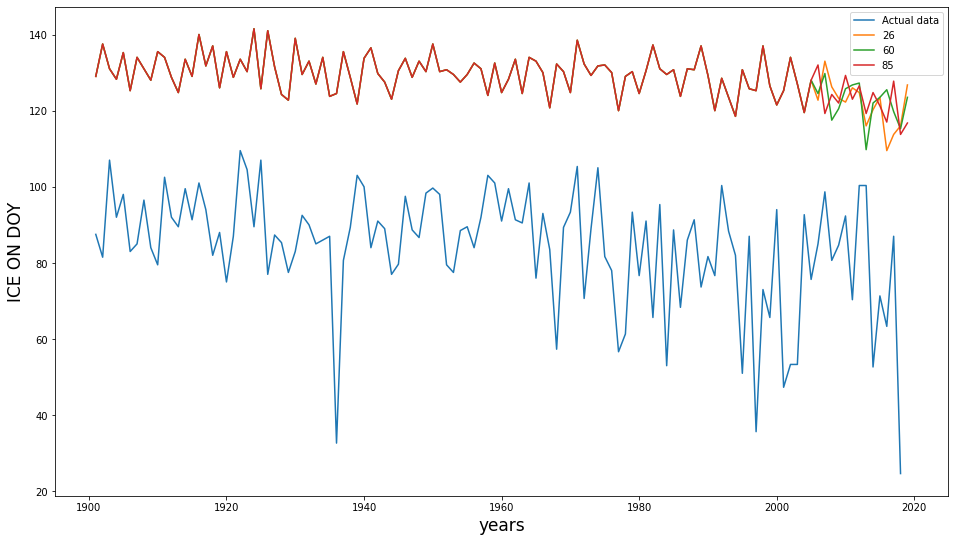

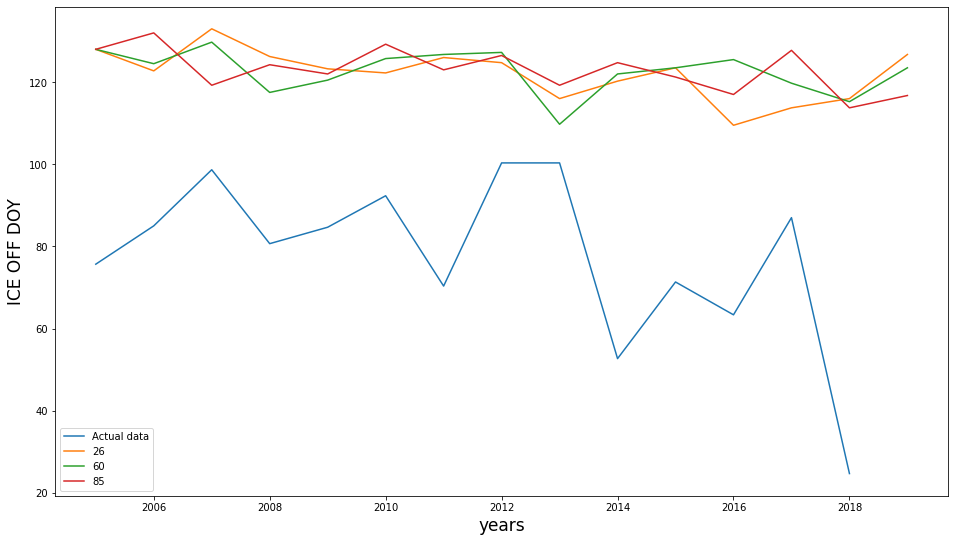

In [142]:
graph.figure(figsize=(16, 9))
graph.plot(mendota['years'], mendota['grouped_ice_off'], label='Actual data')

for rcp in mendota_simstrat_models['rcp'].unique():
    rcp_df = mendota_simstrat_models.loc[mendota_simstrat_models['rcp'] == rcp]
    graph.plot(rcp_df['years'], rcp_df['rcp_grouped_iceend'], label=rcp)

graph.legend()
graph.xlabel('years', fontsize=17)
graph.ylabel('ICE ON DOY', fontsize=17)

graph.show()

graph.figure(figsize=(16, 9))
graph.plot(mendota.loc[mendota['years'] > 2004]['years'], 
           mendota.loc[mendota['years'] > 2004]['grouped_ice_off'], label='Actual data')

for rcp in mendota_simstrat_models['rcp'].unique():
    rcp_df = mendota_simstrat_models.loc[(mendota_simstrat_models['rcp'] == rcp) & (mendota_simstrat_models['years'] > 2004)]
    graph.plot(rcp_df['years'], rcp_df['rcp_grouped_iceend'], label=rcp)

graph.legend()
graph.xlabel('years', fontsize=17)
graph.ylabel('ICE OFF DOY', fontsize=17)

graph.show()

# Top of World Maps

In [22]:
df_after_2005 = df.loc[df['years'] > 2005]
df_after_2005

,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,lake_model
6656,69.75,27.25,38.0,2006.0,26,albm_gfdl-esm2m,69.75_27.25,-53.0,284.0,193.0,69.75,27.25,-69.0,148.0,-69.0,148.0,16.0,45.0,albm
6657,69.75,27.25,38.0,2006.0,60,albm_gfdl-esm2m,69.75_27.25,-53.0,277.0,186.0,69.75,27.25,-69.0,148.0,-69.0,148.0,16.0,38.0,albm
6658,69.75,27.25,38.0,2006.0,85,albm_gfdl-esm2m,69.75_27.25,-53.0,279.0,188.0,69.75,27.25,-69.0,148.0,-69.0,148.0,16.0,40.0,albm
6659,69.75,27.25,38.0,2006.0,26,albm_hadgem2-es,69.75_27.25,-53.0,283.0,192.0,69.75,27.25,-69.0,148.0,-69.0,148.0,16.0,44.0,albm
6660,69.75,27.25,38.0,2006.0,60,albm_hadgem2-es,69.75_27.25,-53.0,273.0,182.0,69.75,27.25,-69.0,148.0,-69.0,148.0,16.0,34.0,albm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1954143,42.25,-85.25,89.0,2018.0,60,lake_ipsl-cm5a-lr,42.25_-85.25,-2.0,170.0,79.0,42.25,-85.25,-25.0,5.0,-5.5,44.5,3.5,34.5,lake
1954144,42.25,-85.25,115.0,2018.0,85,lake_ipsl-cm5a-lr,42.25_-85.25,24.0,181.0,90.0,42.25,-85.25,14.0,84.0,-5.5,44.5,29.5,45.5,lake
1954145,42.25,-85.25,115.0,2018.0,85,lake_ipsl-cm5a-lr,42.25_-85.25,24.0,181.0,90.0,42.25,-85.25,-25.0,5.0,-5.5,44.5,29.5,45.5,lake
1954146,42.25,-85.25,66.0,2018.0,60,lake_miroc5,42.25_-85.25,-25.0,216.0,125.0,42.25,-85.25,14.0,84.0,-5.5,44.5,-19.5,80.5,lake


In [23]:
subset_df_after_2005 = df_after_2005[['lat', 'lon', 'years', 'rcp', 'lake_model', 
                                      'grouped_icestart', 'grouped_ice_on', 'diff_ice_on', 
                                      'grouped_iceend', 'grouped_ice_off', 'diff_ice_off']]

subset_df_after_2005['diff_ice_on'] = subset_df_after_2005.groupby(['lat', 'lon', 'years', 'rcp', 
                                                                    'lake_model'])['diff_ice_on'].transform('mean')
subset_df_after_2005['diff_ice_off'] = subset_df_after_2005.groupby(['lat', 'lon', 'years', 'rcp', 
                                                                    'lake_model'])['diff_ice_off'].transform('mean')
subset_df_after_2005.drop_duplicates(inplace=True)

geo = ccrs.Geodetic()
transformed_locs = ortho.transform_points(geo, subset_df_after_2005['lon'].values, subset_df_after_2005['lat'].values)

subset_df_after_2005['transformed_lon'] = transformed_locs[:, 0]
subset_df_after_2005['transformed_lat'] = transformed_locs[:, 1]

display(subset_df_after_2005)

NameError: name 'ortho' is not defined

In [172]:
subset_df_after_2005['lake_model'].unique()

array(['albm', 'clm45', 'lake', 'simstrat-uog'], dtype=object)

In [ ]:
fig
for model in 

graph.figure(figsize=(12, 12))
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

# create the geoaxes for an orthographic projection
ax = graph.axes(projection=ortho)

# plot native orthographic points                                                                                
sns.scatterplot(points[:, 0], points[:, 1], hue=df_diff_ice_off['diff_ice_off'], palette='seismic', s=40)

# plot north pole for reference (with a projection transform)                                                                                           
ax.plot([0], [90], 'b^', transform=geo)
ax.coastlines(zorder=3)         

In [173]:
subset_df_after_2005.columns

Index(['lat', 'lon', 'years', 'rcp', 'lake_model', 'grouped_icestart',
       'grouped_ice_on', 'diff_ice_on', 'grouped_iceend', 'grouped_ice_off',
       'diff_ice_off', 'transformed_lon', 'transformed_lat'],
      dtype='object')

/home/arshad/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
/home/arshad/miniconda3/lib/python3.7/site-packages/cartopy/mpl/feature_artist.py:163: UserWarning: Unable to determine extent. Defaulting to global.
  warnings.warn('Unable to determine extent. Defaulting to global.')


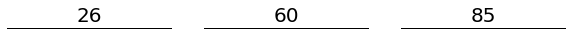

In [212]:
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

fig, axs = graph.subplots(1, 3, subplot_kw={'projection': ortho},
                        figsize=(10, 5))

simstrat_ice_on = subset_df_after_2005.loc[(subset_df_after_2005['lake_model'] == 'simstrat-uog')]
simstrat_ice_on = simstrat_ice_on[['lake_model', 'rcp', 'transformed_lon', 'transformed_lat', 'diff_ice_on']]
simstrat_ice_on.drop_duplicates(inplace=True)

for rcp, subplot, in zip([26, 60, 85], axs):    
    rcp_simstrat = simstrat_ice_on.loc[simstrat_ice_on['rcp'] == rcp]
    
#     fig = graph.figure(figsize=(12, 8))

#     subplot = fig.add_subplot(1, 3, col, projection = ortho)
    subplot.set_title(rcp, fontsize=20)
    subplot.plot([0], [90], 'b^', transform=geo)
    subplot.coastlines(zorder=3)
    
    sns.scatterplot(rcp_simstrat['transformed_lon'], rcp_simstrat['transformed_lat'], 
                    hue = rcp_simstrat['diff_ice_on'], palette='seismic', s=40)
    
fig.tight_layout()    

In [167]:
df_ice_on_slopes['diff'] = df_ice_on_slopes['slope_in_situ'] - df_ice_on_slopes['slope']

for temp_df in [df_ice_off_slopes, df_ice_on_slopes]:
    temp_df['lat'] = temp_df['lat_long'].str.split('_').str.get(0).astype(float)
    temp_df['long'] = temp_df['lat_long'].str.split('_').str.get(1).astype(float)
    temp_df.drop(columns=[col for col in temp_df.columns if 'len_' in col], inplace=True)
    temp_df['model'] = temp_df['lake_model'].str.split('_').str.get(0)
    
    geo = ccrs.Geodetic()
    transformed_locs = ortho.transform_points(geo, temp_df['long'].values, temp_df['lat'].values)

    temp_df['transformed_lon'] = transformed_locs[:, 0]
    temp_df['transformed_lat'] = transformed_locs[:, 1]

display(df_ice_off_slopes, df_ice_on_slopes)

,lat_long,variable,lake_model,rcp,slope_model,slope_in_situ,diff,lat,long,transformed_lon,transformed_lat,model
0,69.25_20.75,ice_off,albm_gfdl-esm2m,26,-0.756044,-0.246154,0.509890,69.25,20.75,8.005974e+05,-2.113141e+06,albm
1,69.25_20.75,ice_off,albm_gfdl-esm2m,60,-0.301099,-0.246154,0.054945,69.25,20.75,8.005974e+05,-2.113141e+06,albm
2,69.25_20.75,ice_off,albm_gfdl-esm2m,85,-0.202198,-0.246154,-0.043956,69.25,20.75,8.005974e+05,-2.113141e+06,albm
3,69.25_20.75,ice_off,albm_hadgem2-es,26,0.626374,-0.246154,-0.872527,69.25,20.75,8.005974e+05,-2.113141e+06,albm
4,69.25_20.75,ice_off,albm_hadgem2-es,60,0.063736,-0.246154,-0.309890,69.25,20.75,8.005974e+05,-2.113141e+06,albm
...,...,...,...,...,...,...,...,...,...,...,...,...
6483,42.25_-85.25,ice_off,lake_ipsl-cm5a-lr,26,-0.507692,-0.354945,0.152747,42.25,-85.25,-4.704998e+06,-3.909552e+05,lake
6484,42.25_-85.25,ice_off,lake_ipsl-cm5a-lr,60,-0.246154,-0.354945,-0.108791,42.25,-85.25,-4.704998e+06,-3.909552e+05,lake
6485,42.25_-85.25,ice_off,lake_ipsl-cm5a-lr,85,-0.364835,-0.354945,0.009890,42.25,-85.25,-4.704998e+06,-3.909552e+05,lake
6486,42.25_-85.25,ice_off,lake_miroc5,26,-2.412088,-0.354945,2.057143,42.25,-85.25,-4.704998e+06,-3.909552e+05,lake


,lat_long,variable,lake_model,rcp,slope,slope_in_situ,lat,long,transformed_lon,transformed_lat,diff,model
0,69.25_20.75,ice_on,albm_gfdl-esm2m,26,1.026374,0.628571,69.25,20.75,8.005974e+05,-2.113141e+06,-0.397802,albm
1,69.25_20.75,ice_on,albm_gfdl-esm2m,60,0.375824,0.628571,69.25,20.75,8.005974e+05,-2.113141e+06,0.252747,albm
2,69.25_20.75,ice_on,albm_gfdl-esm2m,85,0.865934,0.628571,69.25,20.75,8.005974e+05,-2.113141e+06,-0.237363,albm
3,69.25_20.75,ice_on,albm_hadgem2-es,26,-0.969231,0.628571,69.25,20.75,8.005974e+05,-2.113141e+06,1.597802,albm
4,69.25_20.75,ice_on,albm_hadgem2-es,60,0.184615,0.628571,69.25,20.75,8.005974e+05,-2.113141e+06,0.443956,albm
...,...,...,...,...,...,...,...,...,...,...,...,...
4596,42.25_-85.25,ice_on,lake_ipsl-cm5a-lr,26,0.657143,-0.376923,42.25,-85.25,-4.704998e+06,-3.909552e+05,-1.034066,lake
4597,42.25_-85.25,ice_on,lake_ipsl-cm5a-lr,60,-0.826374,-0.376923,42.25,-85.25,-4.704998e+06,-3.909552e+05,0.449451,lake
4598,42.25_-85.25,ice_on,lake_ipsl-cm5a-lr,85,0.672527,-0.376923,42.25,-85.25,-4.704998e+06,-3.909552e+05,-1.049451,lake
4599,42.25_-85.25,ice_on,lake_miroc5,26,1.549451,-0.376923,42.25,-85.25,-4.704998e+06,-3.909552e+05,-1.926374,lake


/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


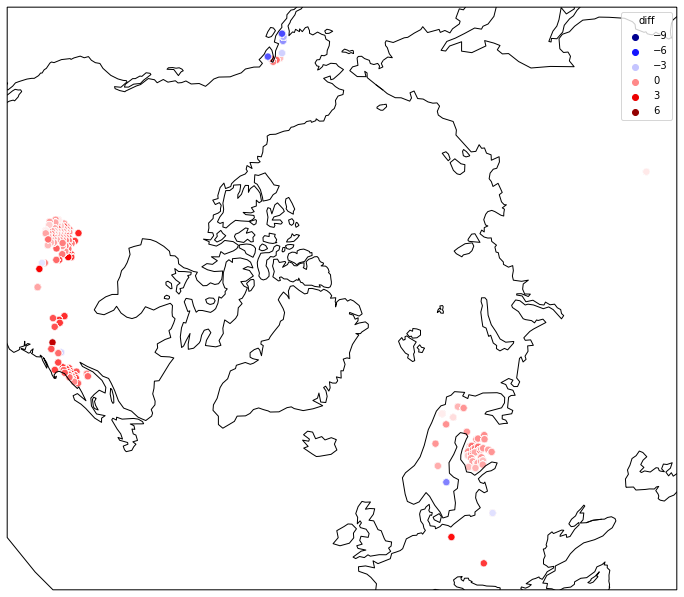

In [211]:
graph.figure(figsize=(12, 12))
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

# create the geoaxes for an orthographic projection
ax = graph.axes(projection=ortho)
ax.coastlines(zorder=3)
sns.scatterplot(df_ice_off_slopes['transformed_lon'], df_ice_off_slopes['transformed_lat'], 
                hue = df_ice_off_slopes['diff'], palette='seismic', s=50)
graph.show()

# Looking at Ice On slopes extremes

In [8]:
ice_on_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_apr_26.csv')
obs_ice_on_slopes = ice_on_slopes[['lat_long', 'variable', 'len_in_situ_data', 'slope_in_situ']]
obs_ice_on_slopes.drop_duplicates(inplace=True)
obs_ice_on_slopes.sort_values(by='slope_in_situ', ascending=False, inplace=True)
print(len(obs_ice_on_slopes))
display(obs_ice_on_slopes.head())

104


,lat_long,variable,len_in_situ_data,slope_in_situ
2162,58.25_-155.75,ice_on,10,4.303030
2116,58.75_-155.75,ice_on,10,3.030303
2070,59.25_-155.25,ice_on,10,2.693939
2240,52.25_13.75,ice_on,11,2.133083
1794,60.75_-153.75,ice_on,10,2.027273


In [19]:
obs_in_situ = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/in_situ_grouped_observations.csv')
obs_in_situ.head()

,years,lat_long,latitude,longitude,grouped_ice_on,grouped_ice_off
0,1959.0,74.75_101.25,74.75,101.25,NaN,166.0
1,1960.0,74.75_101.25,74.75,101.25,-89.0,182.0
2,1961.0,74.75_101.25,74.75,101.25,-87.0,187.0
3,1962.0,74.75_101.25,74.75,101.25,-88.0,188.0
4,1963.0,74.75_101.25,74.75,101.25,-94.0,190.0


In [23]:
orig_ice_on_slopes = []

for location in tqdm(obs_in_situ['lat_long'].unique()):
    temp_ice_on = obs_in_situ.loc[obs_in_situ['lat_long'] == location]
    temp_ice_on = temp_ice_on[['years', 'grouped_ice_on']]
    
    if len(temp_ice_on) < 10:
        continue

    x_cons = sm.add_constant(temp_ice_on['years'])
    model = sm.OLS(temp_ice_on['grouped_ice_on'], x_cons).fit()
    slope = model.params.values[1]
    orig_ice_on_slopes.append([location, len(temp_ice_on), 'ice_on', slope])

100%|██████████| 541/541 [00:05<00:00, 102.23it/s]


In [24]:
len(obs_in_situ['lat_long'].unique())

541

In [28]:
slopes_obs_ice_on = pd.DataFrame(orig_ice_on_slopes, columns = ['lat_long', 'len_data', 'variable', 'slope'])
slopes_obs_ice_on.dropna(inplace=True)
slopes_obs_ice_on.sort_values(by='slope', ascending=False, inplace=True)
slopes_obs_ice_on

,lat_long,len_data,variable,slope
121,60.25_-154.25,12,ice_on,2.020254
123,60.25_-150.25,13,ice_on,1.875296
25,67.75_33.25,10,ice_on,1.787879
194,51.75_-124.75,12,ice_on,1.503497
120,60.75_31.75,40,ice_on,1.220356
...,...,...,...,...
210,50.25_-86.75,11,ice_on,-0.890909
94,61.25_-151.75,14,ice_on,-1.241758
129,59.75_-155.25,12,ice_on,-1.688542
93,61.25_-152.75,14,ice_on,-1.975824


In [36]:
strong_slope = obs_in_situ.loc[obs_in_situ['lat_long'] == '60.25_-154.25']
strong_slope

,years,lat_long,latitude,longitude,grouped_ice_on,grouped_ice_off
8076,2001.0,60.25_-154.25,60.25,-154.25,-16.0,18.0
8077,2003.0,60.25_-154.25,60.25,-154.25,7.0,110.0
8078,2004.0,60.25_-154.25,60.25,-154.25,38.0,68.0
8079,2005.0,60.25_-154.25,60.25,-154.25,21.0,120.0
8080,2006.0,60.25_-154.25,60.25,-154.25,-5.0,111.0
8081,2007.0,60.25_-154.25,60.25,-154.25,9.0,131.0
8082,2008.0,60.25_-154.25,60.25,-154.25,0.0,124.0
8083,2009.0,60.25_-154.25,60.25,-154.25,21.0,122.0
8084,2010.0,60.25_-154.25,60.25,-154.25,-6.0,126.0
8085,2011.0,60.25_-154.25,60.25,-154.25,-5.0,117.0


In [37]:
x_cons = sm.add_constant(strong_slope['years'])
model = sm.OLS(strong_slope['grouped_ice_on'], x_cons).fit()
model.summary()

/home/arshad/miniconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1535: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  "anyway, n=%i" % int(n))


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         grouped_ice_on   R-squared:                       0.165
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     1.970
Date:                Wed, 19 May 2021   Prob (F-statistic):              0.191
Time:                        11:05:04   Log-Likelihood:                -51.357
No. Observations:                  12   AIC:                             106.7
Df Residuals:                      10   BIC:                             107.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4043.7456   2889.467     -1.399      0.192   -1.05e+04    2394.388
years          2.0203      1.439      1.404      0.191      -1.187       5.227
==============================================================================
Omnibus:                        0.707   Durbin-Watson:                   1.689
Prob(Omnibus):                  0.702   Jarque-Bera (JB):                0.651
Skew:                           0.292   Prob(JB):                        0.722
Kurtosis:                       2.020   Cond. No.                     1.05e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [38]:
model.params

const   -4043.745643
years       2.020254
dtype: float64

/home/arshad/miniconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


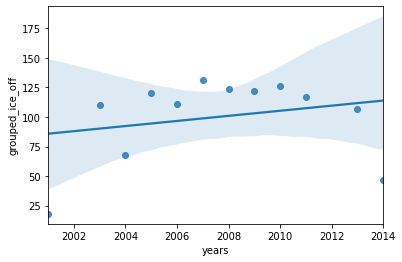

In [39]:
sns.regplot(strong_slope['years'], strong_slope['grouped_ice_off'])

# Clean up analysis csv files
## Graphs for presentation

In [43]:
ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
geo = ccrs.Geodetic()

In [44]:
ice_on_analysis = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_june_03.csv')
ice_off_analysis = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_after_2005_slopes_july_28.csv')

for df in [ice_on_analysis, ice_off_analysis]:
    df['model'] = df['lake_model'].str.split('_').str.get(0)
    df['lat'] = df['lat_long'].str.split('_').str.get(0).astype(float)
    df['long'] = df['lat_long'].str.split('_').str.get(1).astype(float)
    
    transformed_locs = ortho.transform_points(geo, df['long'].values, df['lat'].values)

    df['transformed_long'] = transformed_locs[:, 0]
    df['transformed_lat'] = transformed_locs[:, 1]
    
    df['slope_diff'] = df['slope_model'] - df['slope_in_situ']
    df['cov_diff'] = df['cov_model'] - df['cov_in_situ']
    df['mean_diff'] = df['mean_model'] - df['mean_in_situ']
    
display(ice_on_analysis.head(), ice_off_analysis.head())

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,len_in_situ_data,...,slope_in_situ,cov_in_situ,model,lat,long,transformed_long,transformed_lat,slope_diff,cov_diff,mean_diff
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,26,-55.642857,1.026374,-0.153642,16.206260,14,...,0.628571,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,0.397802,0.055891,-11.500000
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,60,-58.642857,0.375824,-0.108350,18.375061,14,...,0.628571,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.252747,0.101183,-14.500000
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,85,-58.428571,0.865934,-0.109343,16.509737,14,...,0.628571,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,0.237363,0.100190,-14.285714
3,69.25_20.75,14,ice_on,albm_hadgem2-es,26,-57.642857,-0.969231,-0.111586,18.456513,14,...,0.628571,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-1.597802,0.097947,-13.500000
4,69.25_20.75,14,ice_on,albm_hadgem2-es,60,-55.000000,0.184615,-0.112920,15.061778,14,...,0.628571,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.443956,0.096613,-10.857143


,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,len_in_situ_data,...,slope_in_situ,cov_in_situ,model,lat,long,transformed_long,transformed_lat,slope_diff,cov_diff,mean_diff
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,26,163.857143,-0.756044,0.030849,10.184021,14,...,-0.246154,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.509890,-0.014595,0.571429
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,60,163.928571,-0.301099,0.019078,7.787352,14,...,-0.246154,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.054945,-0.026366,0.642857
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,85,165.285714,-0.202198,0.023143,8.960230,14,...,-0.246154,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.043956,-0.022300,2.000000
3,69.25_20.75,14,ice_off,albm_hadgem2-es,26,163.214286,0.626374,0.037209,9.338859,14,...,-0.246154,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.872527,-0.008234,-0.071429
4,69.25_20.75,14,ice_off,albm_hadgem2-es,60,156.214286,0.063736,0.033629,9.676924,14,...,-0.246154,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.309890,-0.011815,-7.071429


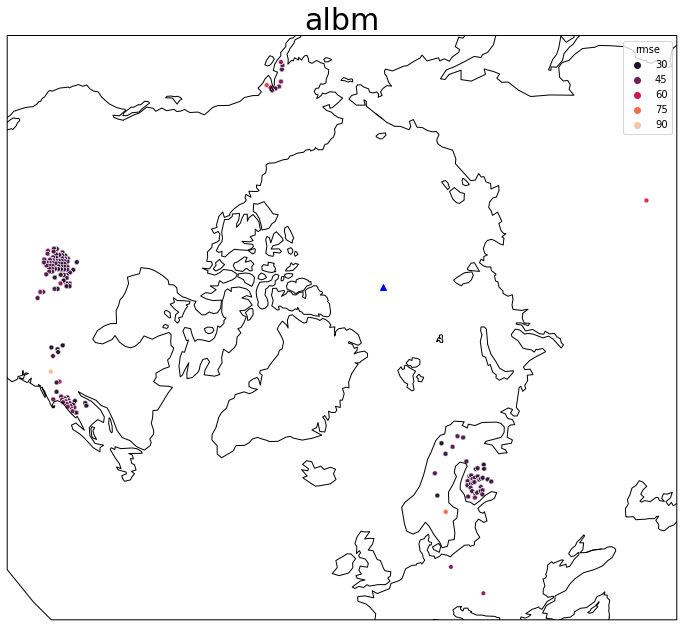

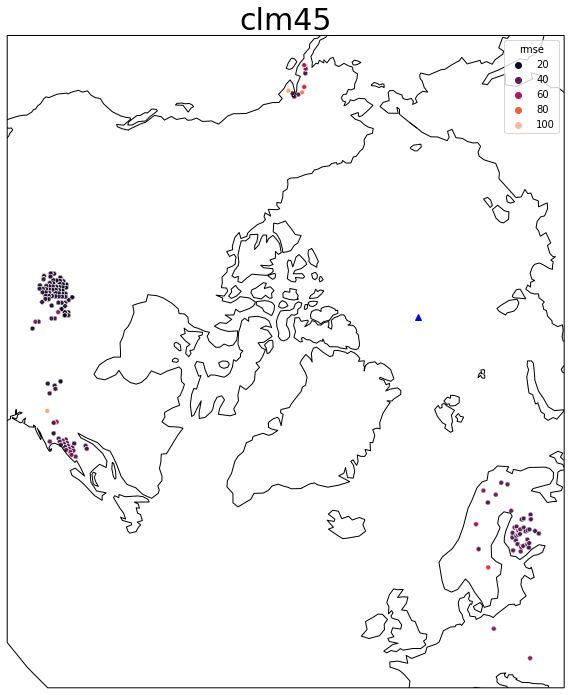

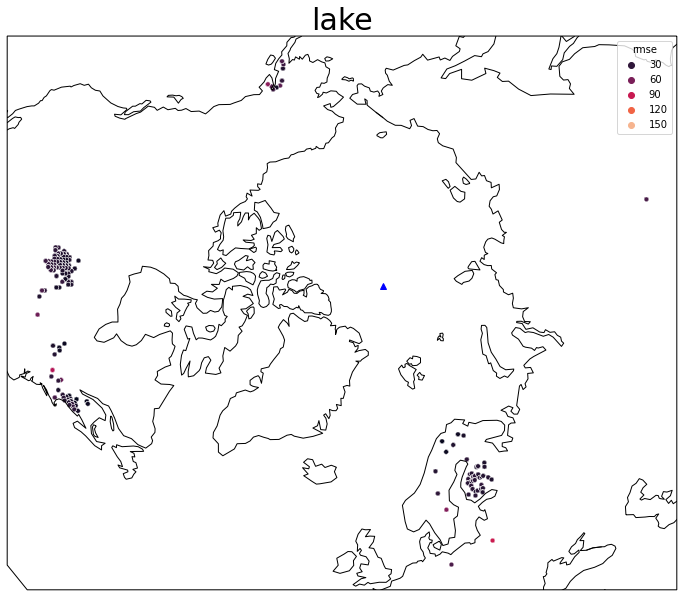

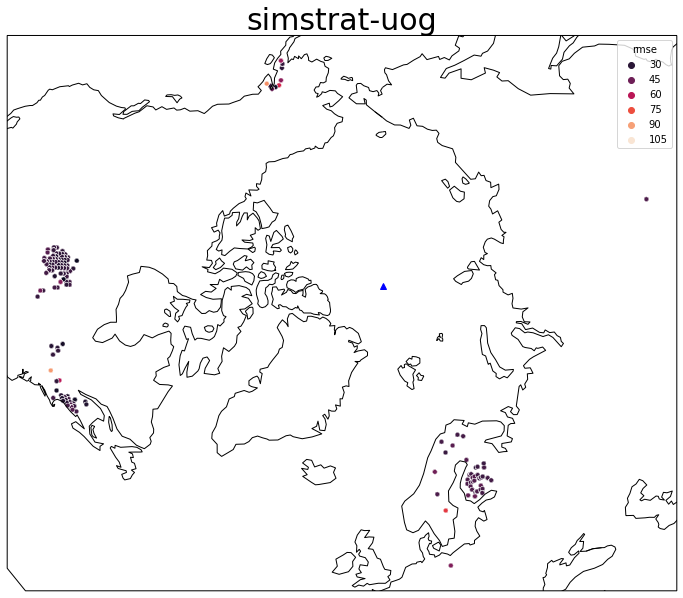

In [101]:
fig_path = '/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/Presentations/'

for model in ice_off_analysis['model'].unique():
    graph.figure(figsize=(12, 12))

    ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    geo = ccrs.Geodetic()

    # create the geoaxes for an orthographic projection
    ax = graph.axes(projection=ortho)
    ax.set_title(model, fontsize=30)

    # transform lat/lons points to othographic points
    model_df = ice_off_analysis.loc[ice_off_analysis['model'] == model]

    # plot native orthographic points                                                                                
    sns.scatterplot(model_df['transformed_long'], 
                    model_df['transformed_lat'], 
                    hue=model_df['rmse'], palette = 'rocket', s=20)

    # plot north pole for reference (with a projection transform)                                                                                           
    ax.plot([0], [90], 'b^', transform=geo)
    ax.coastlines(zorder=3)   
    graph.savefig(f'{fig_path}ice_off_{model}_cov.png', bbox_inches='tight')
    graph.show()

In [74]:
kev_iestyn = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/merged_kev_iestyn_jul_28_2021.csv')

print(len(kev_iestyn))
kev_iestyn.dropna(subset=['diff_ice_on', 'diff_ice_off'], how='all', inplace=True)
print(len(kev_iestyn))

1954156
1944496


In [75]:
kev_iestyn_after_2005 = kev_iestyn.loc[kev_iestyn['years'] > 2004]

kev_iestyn_after_2005['lake_model'] = kev_iestyn_after_2005['model'].str.split('_').str.get(0)

transformed_locs = ortho.transform_points(geo, kev_iestyn_after_2005['lon'].values, kev_iestyn_after_2005['lat'].values)

kev_iestyn_after_2005['transformed_long'] = transformed_locs[:, 0]
kev_iestyn_after_2005['transformed_lat'] = transformed_locs[:, 1]

display(kev_iestyn_after_2005)

,Unnamed: 0,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,...,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted,lake_model,transformed_long,transformed_lat
6609,6609,69.75,27.25,29.0,2005.0,26,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm,1.010794e+06,-1.962578e+06
6610,6610,69.75,27.25,29.0,2005.0,60,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm,1.010794e+06,-1.962578e+06
6611,6611,69.75,27.25,29.0,2005.0,85,albm_gfdl-esm2m,69.75_27.25,-62.0,280.0,...,-57.0,141.0,-57.0,141.0,-5.0,18.0,159.0,albm,1.010794e+06,-1.962578e+06
6612,6612,69.75,27.25,33.0,2005.0,26,albm_hadgem2-es,69.75_27.25,-58.0,276.0,...,-57.0,141.0,-57.0,141.0,-1.0,14.0,155.0,albm,1.010794e+06,-1.962578e+06
6613,6613,69.75,27.25,33.0,2005.0,60,albm_hadgem2-es,69.75_27.25,-58.0,276.0,...,-57.0,141.0,-57.0,141.0,-1.0,14.0,155.0,albm,1.010794e+06,-1.962578e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1954143,1954143,42.25,-85.25,89.0,2018.0,60,lake_ipsl-cm5a-lr,42.25_-85.25,-2.0,170.0,...,-25.0,5.0,-5.5,44.5,3.5,4.5,49.0,lake,-4.704998e+06,-3.909552e+05
1954144,1954144,42.25,-85.25,115.0,2018.0,85,lake_ipsl-cm5a-lr,42.25_-85.25,24.0,181.0,...,14.0,84.0,-5.5,44.5,29.5,15.5,60.0,lake,-4.704998e+06,-3.909552e+05
1954145,1954145,42.25,-85.25,115.0,2018.0,85,lake_ipsl-cm5a-lr,42.25_-85.25,24.0,181.0,...,-25.0,5.0,-5.5,44.5,29.5,15.5,60.0,lake,-4.704998e+06,-3.909552e+05
1954146,1954146,42.25,-85.25,66.0,2018.0,60,lake_miroc5,42.25_-85.25,-25.0,216.0,...,14.0,84.0,-5.5,44.5,-19.5,50.5,95.0,lake,-4.704998e+06,-3.909552e+05


In [144]:
range_kev_iestyn_after_2005 = kev_iestyn_after_2005.copy()

In [66]:
kev_iestyn_after_2005_ice_on = kev_iestyn_after_2005[['transformed_long', 'transformed_lat', 'lake_model', 'diff_ice_on', 
                                                      'rcp', 'lat', 'lon']]
kev_iestyn_after_2005_ice_on.dropna(inplace=True)

kev_iestyn_after_2005_ice_off = kev_iestyn_after_2005[['transformed_long', 'transformed_lat', 'lake_model', 'diff_ice_off', 
                                                       'rcp', 'lat', 'lon']]
kev_iestyn_after_2005_ice_off.dropna(inplace=True)

display(kev_iestyn_after_2005_ice_off.head())

,transformed_long,transformed_lat,lake_model,diff_ice_off,rcp,lat,lon
6609,1.010794e+06,-1.962578e+06,albm,18.0,26,69.75,27.25
6610,1.010794e+06,-1.962578e+06,albm,18.0,60,69.75,27.25
6611,1.010794e+06,-1.962578e+06,albm,18.0,85,69.75,27.25
6612,1.010794e+06,-1.962578e+06,albm,14.0,26,69.75,27.25
6613,1.010794e+06,-1.962578e+06,albm,14.0,60,69.75,27.25


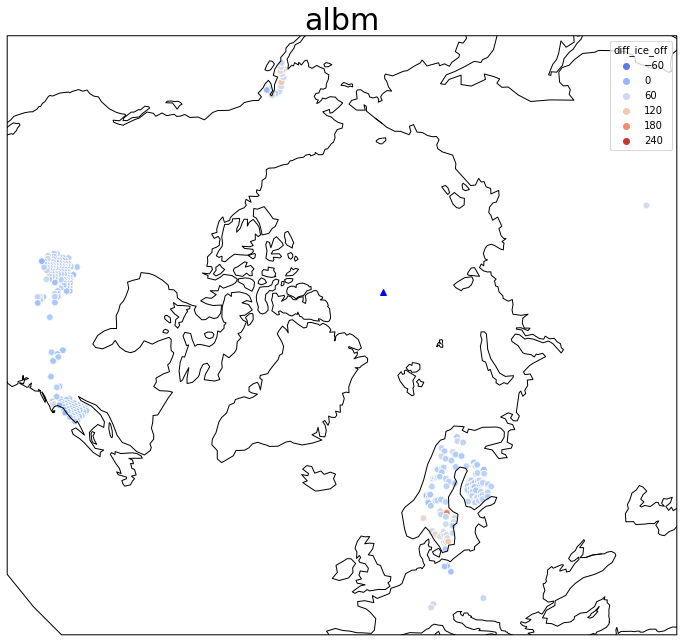

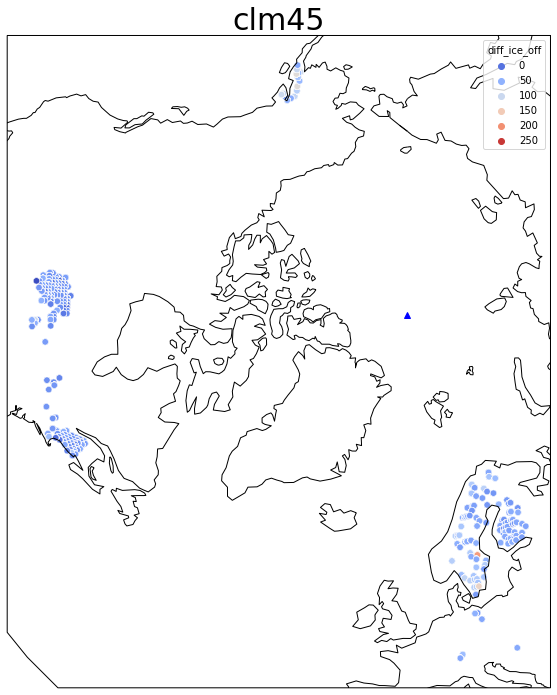

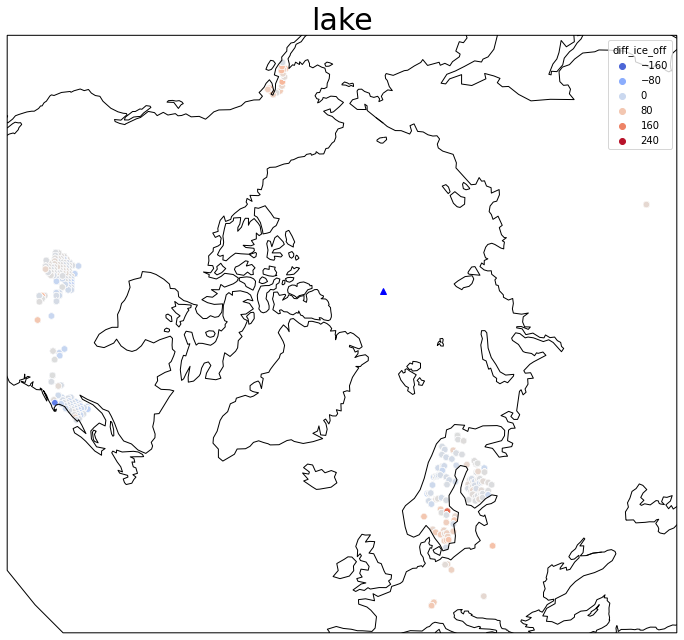

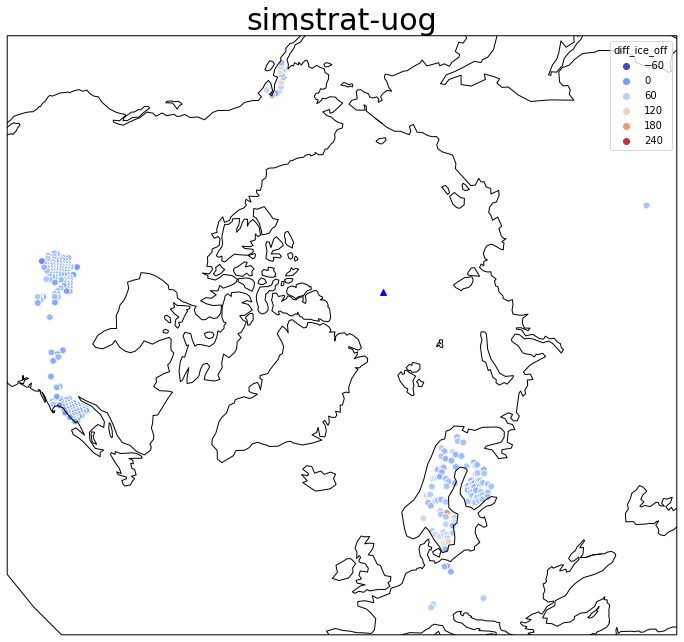

In [29]:
fig_path = '/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/Presentations/'

for model in kev_iestyn_after_2005_ice_off['lake_model'].unique():
    graph.figure(figsize=(12, 12))

    ortho = ccrs.Orthographic(central_longitude=0, central_latitude=90)
    geo = ccrs.Geodetic()

    # create the geoaxes for an orthographic projection
    ax = graph.axes(projection=ortho)
    ax.set_title(model, fontsize=30)

    # transform lat/lons points to othographic points
    model_df = kev_iestyn_after_2005_ice_off.loc[kev_iestyn_after_2005_ice_off['lake_model'] == model]

    # plot native orthographic points                                                                                
    sns.scatterplot(model_df['transformed_long'], 
                    model_df['transformed_lat'], 
                    hue=model_df['diff_ice_off'], palette = 'coolwarm', s=40)

    # plot north pole for reference (with a projection transform)                                                                                           
    ax.plot([0], [90], 'b^', transform=geo)
    ax.coastlines(zorder=3)   
#     graph.savefig(f'{fig_path}ice_off_{model}_values.png', bbox_inches='tight')
    graph.show()

# BOXplots

In [177]:
ice_on_analysis['location'] = np.where(ice_on_analysis['long'] < -120, 'alaska', np.nan)
ice_on_analysis['location'] = np.where((ice_on_analysis['long'] > -120) & (ice_on_analysis['long'] <-20), 
                                                                             'mainland_US', ice_on_analysis['location'])
ice_on_analysis['location'] = np.where((ice_on_analysis['long'] > -20), 'europe', ice_on_analysis['location'])

display(ice_on_analysis.head())



,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,len_in_situ_data,...,cov_in_situ,model,lat,long,transformed_long,transformed_lat,slope_diff,cov_diff,mean_diff,location
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,26,-55.642857,1.026374,-0.153642,16.206260,14,...,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,0.397802,0.055891,-11.500000,europe
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,60,-58.642857,0.375824,-0.108350,18.375061,14,...,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.252747,0.101183,-14.500000,europe
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,85,-58.428571,0.865934,-0.109343,16.509737,14,...,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,0.237363,0.100190,-14.285714,europe
3,69.25_20.75,14,ice_on,albm_hadgem2-es,26,-57.642857,-0.969231,-0.111586,18.456513,14,...,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-1.597802,0.097947,-13.500000,europe
4,69.25_20.75,14,ice_on,albm_hadgem2-es,60,-55.000000,0.184615,-0.112920,15.061778,14,...,-0.209533,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.443956,0.096613,-10.857143,europe


In [69]:
kev_iestyn_after_2005_ice_on['location'] = np.where(kev_iestyn_after_2005_ice_on['lon'] < -120, 'alaska', np.nan)
kev_iestyn_after_2005_ice_on['location'] = np.where((kev_iestyn_after_2005_ice_on['lon'] > -120) & (kev_iestyn_after_2005_ice_on['lon'] <-20), 
                                                                             'mainland_US', kev_iestyn_after_2005_ice_on['location'])
kev_iestyn_after_2005_ice_on['location'] = np.where((kev_iestyn_after_2005_ice_on['lon'] > -20), 'europe', kev_iestyn_after_2005_ice_on['location'])

display(kev_iestyn_after_2005_ice_on.head())

,transformed_long,transformed_lat,lake_model,diff_ice_on,rcp,lat,lon,location
6609,1.010794e+06,-1.962578e+06,albm,-5.0,26,69.75,27.25,europe
6610,1.010794e+06,-1.962578e+06,albm,-5.0,60,69.75,27.25,europe
6611,1.010794e+06,-1.962578e+06,albm,-5.0,85,69.75,27.25,europe
6612,1.010794e+06,-1.962578e+06,albm,-1.0,26,69.75,27.25,europe
6613,1.010794e+06,-1.962578e+06,albm,-1.0,60,69.75,27.25,europe


In [53]:
ice_off_analysis['location'] = np.where(ice_off_analysis['long'] < -120, 'alaska', np.nan)
ice_off_analysis['location'] = np.where((ice_off_analysis['long'] > -120) & (ice_off_analysis['long'] <-20), 
                                                                             'mainland_US', ice_off_analysis['location'])
ice_off_analysis['location'] = np.where((ice_off_analysis['long'] > -20), 'europe', ice_off_analysis['location'])

display(ice_off_analysis.head())

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,len_in_situ_data,...,cov_in_situ,model,lat,long,transformed_long,transformed_lat,slope_diff,cov_diff,mean_diff,location
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,26,163.857143,-0.756044,0.030849,10.184021,14,...,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.509890,-0.014595,0.571429,europe
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,60,163.928571,-0.301099,0.019078,7.787352,14,...,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,-0.054945,-0.026366,0.642857,europe
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,85,165.285714,-0.202198,0.023143,8.960230,14,...,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.043956,-0.022300,2.000000,europe
3,69.25_20.75,14,ice_off,albm_hadgem2-es,26,163.214286,0.626374,0.037209,9.338859,14,...,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.872527,-0.008234,-0.071429,europe
4,69.25_20.75,14,ice_off,albm_hadgem2-es,60,156.214286,0.063736,0.033629,9.676924,14,...,0.045444,albm,69.25,20.75,800597.402937,-2.113141e+06,0.309890,-0.011815,-7.071429,europe


In [240]:
kev_iestyn_after_2005_ice_off['location'] = np.where(kev_iestyn_after_2005_ice_off['lon'] < -120, 'alaska', np.nan)
kev_iestyn_after_2005_ice_off['location'] = np.where((kev_iestyn_after_2005_ice_off['lon'] > -120) & (kev_iestyn_after_2005_ice_off['lon'] <-20), 
                                                                             'mainland_US', kev_iestyn_after_2005_ice_off['location'])
kev_iestyn_after_2005_ice_off['location'] = np.where((kev_iestyn_after_2005_ice_off['lon'] > -20), 'europe', kev_iestyn_after_2005_ice_off['location'])

display(kev_iestyn_after_2005_ice_off.head())

,transformed_long,transformed_lat,lake_model,diff_ice_off,rcp,lat,lon,location
6609,1.010794e+06,-1.962578e+06,albm,18.0,26,69.75,27.25,europe
6610,1.010794e+06,-1.962578e+06,albm,18.0,60,69.75,27.25,europe
6611,1.010794e+06,-1.962578e+06,albm,18.0,85,69.75,27.25,europe
6612,1.010794e+06,-1.962578e+06,albm,14.0,26,69.75,27.25,europe
6613,1.010794e+06,-1.962578e+06,albm,14.0,60,69.75,27.25,europe


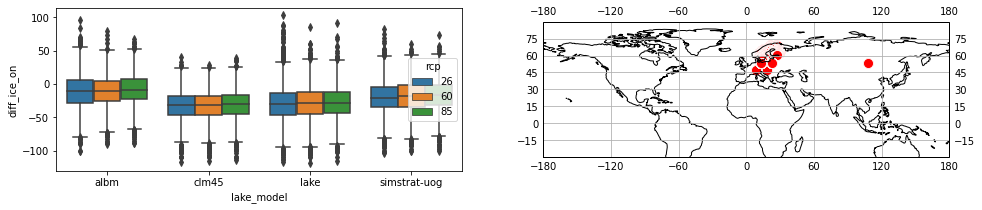

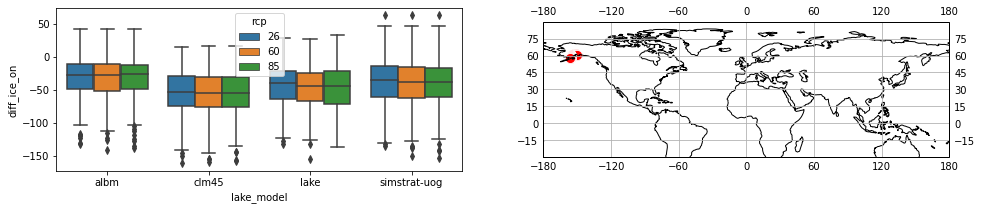

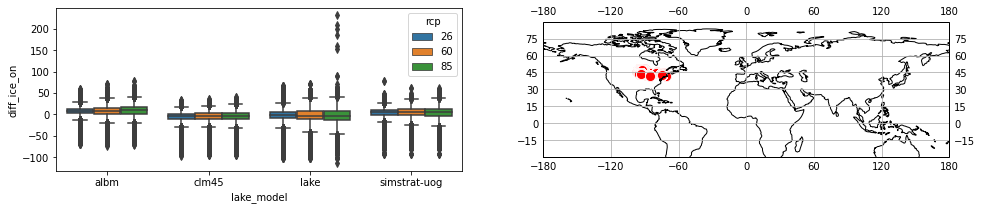

In [241]:
# for location in ice_on_analysis['location'].unique():
for location in kev_iestyn_after_2005_ice_on['location'].unique():

#     temp_ice_on_df = ice_on_analysis.loc[ice_on_analysis['location'] == location]
    temp_ice_on_df = kev_iestyn_after_2005_ice_on.loc[kev_iestyn_after_2005_ice_on['location'] == location]

    f, axes = graph.subplots(1, 2, figsize=(16, 3)) 
    
#     sns.boxplot(y='cov_diff', x='model', hue='rcp', data=temp_ice_on_df, ax=axes[0])
    sns.boxplot(y='diff_ice_on', x='lake_model', hue='rcp', data=temp_ice_on_df, ax=axes[0])

    ax2 = graph.subplot(122, projection=ccrs.PlateCarree())
    ax2.coastlines()
    ax2.gridlines(draw_labels=True)
    ax2.set_extent([-180, 180, -30, 90])

#     sns.scatterplot(x = 'long', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_on_df, 
#                     color='red', s=100)
    sns.scatterplot(x = 'lon', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_on_df, 
                    color='red', s=100)

    graph.show()

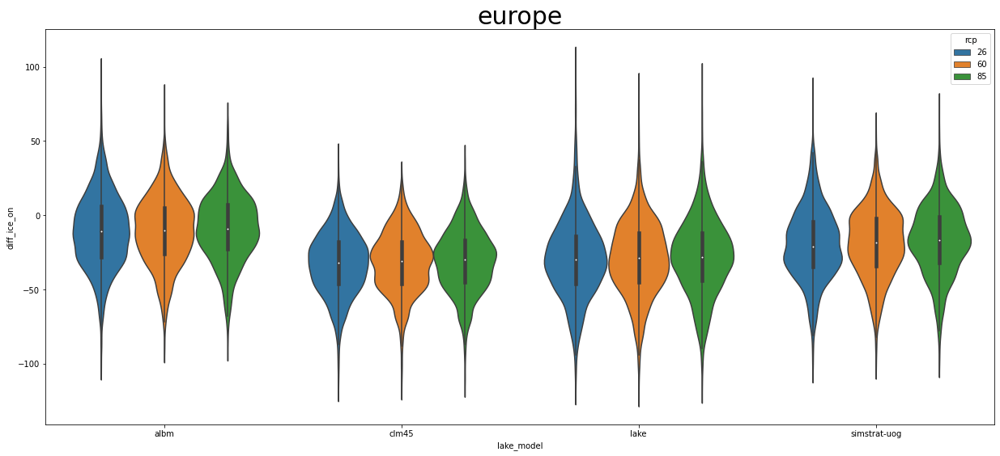

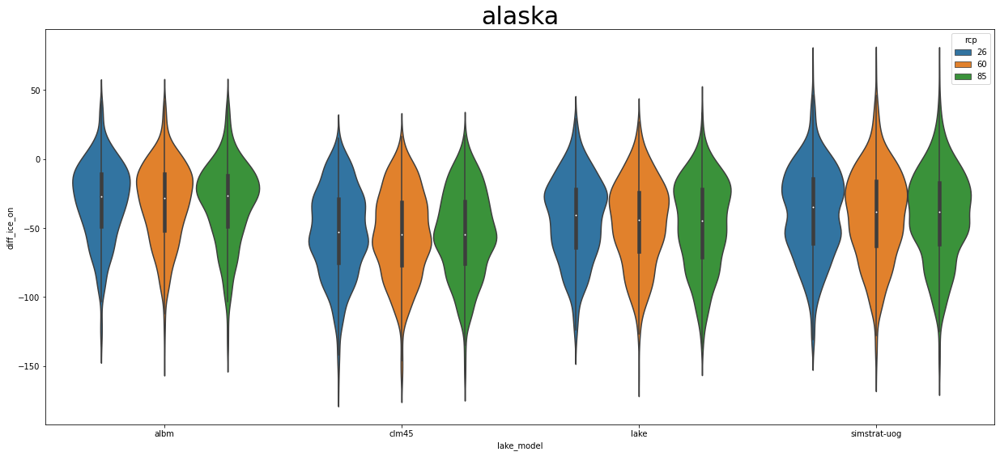

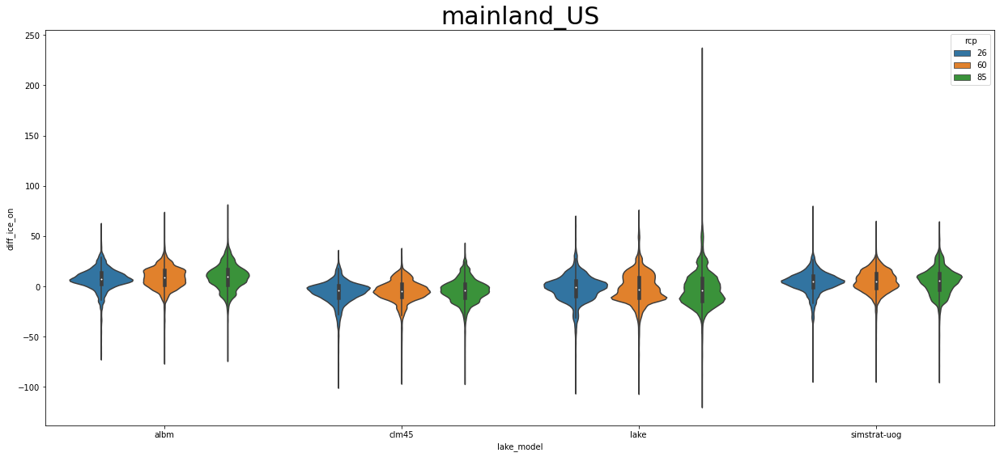

In [246]:
# for location in ice_on_analysis['location'].unique():
for location in kev_iestyn_after_2005_ice_on['location'].unique():

#     temp_ice_on_df = ice_on_analysis.loc[ice_on_analysis['location'] == location]
    temp_ice_on_df = kev_iestyn_after_2005_ice_on.loc[kev_iestyn_after_2005_ice_on['location'] == location] 
    
    graph.figure(figsize=(21, 9))
    graph.title(location, fontsize=30)
#     sns.boxplot(y='diff_ice_on', x='lake_model', hue='rcp', data=temp_ice_on_df)
    sns.violinplot(y='diff_ice_on', x='lake_model', hue='rcp', data=temp_ice_on_df)
#     sns.swarmplot(y='diff_ice_on', x='lake_model', data=temp_ice_on_df)
    graph.show()

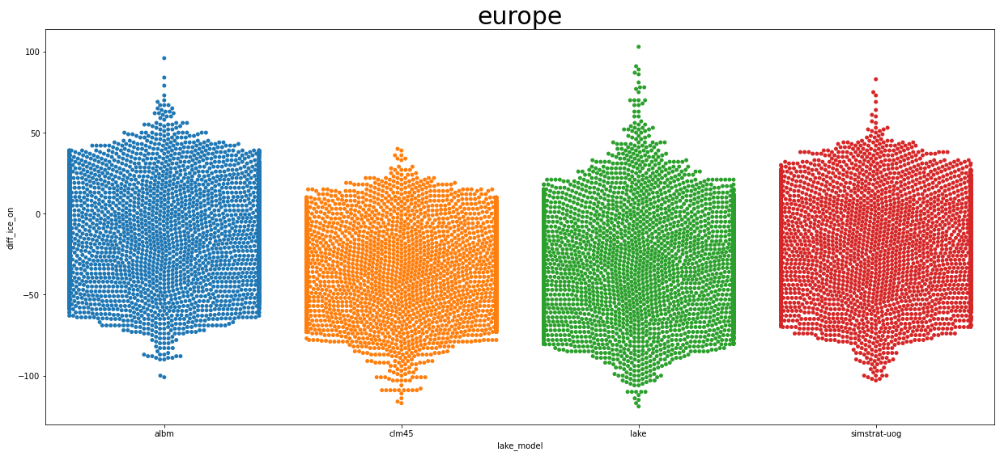

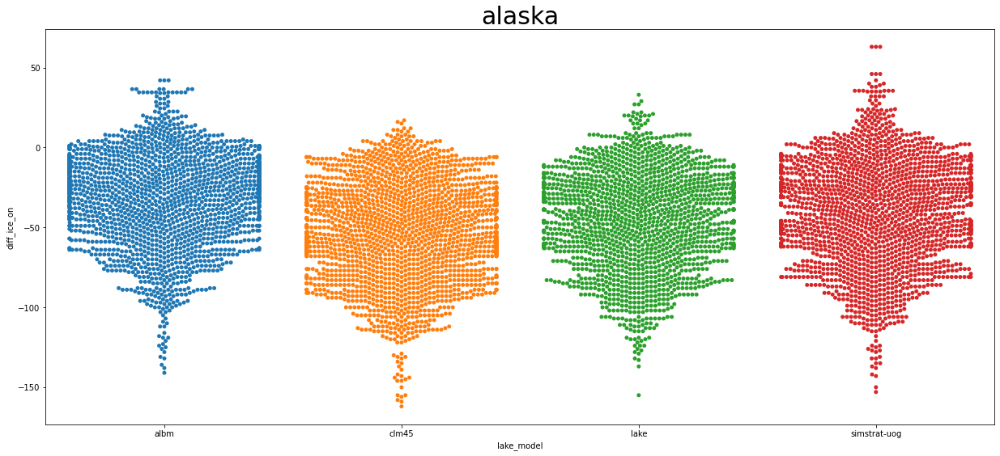

KeyboardInterrupt: 

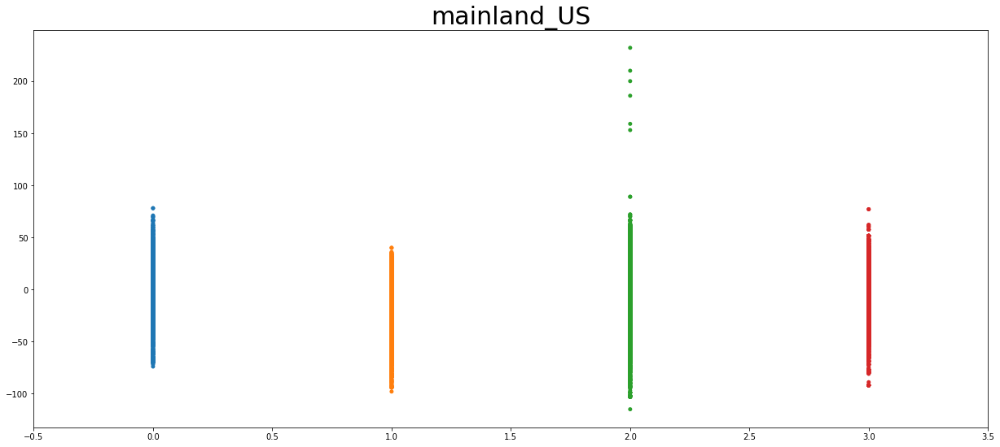

In [247]:
for location in kev_iestyn_after_2005_ice_on['location'].unique():

    temp_ice_on_df = kev_iestyn_after_2005_ice_on.loc[kev_iestyn_after_2005_ice_on['location'] == location] 
    
    graph.figure(figsize=(21, 9))
    graph.title(location, fontsize=30)
    sns.swarmplot(y='diff_ice_on', x='lake_model', data=temp_ice_on_df)
    graph.show()

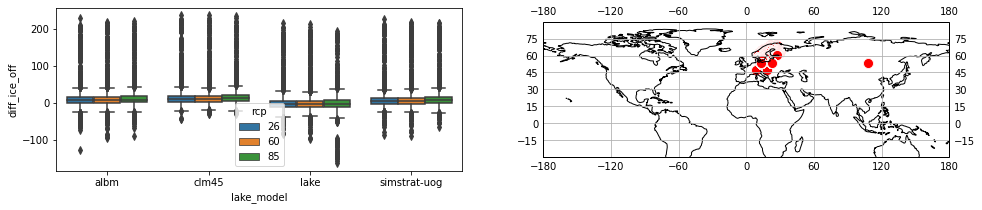

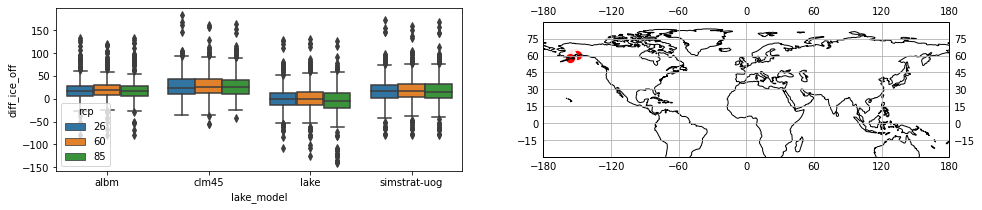

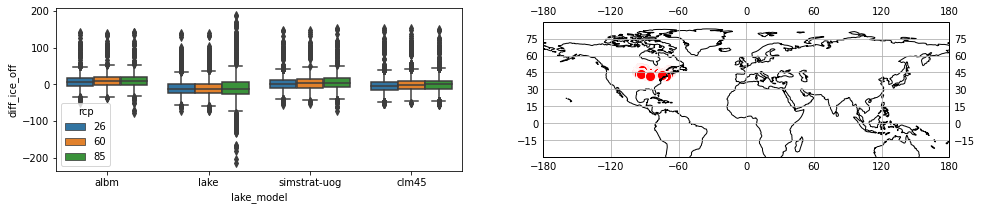

In [73]:
# for location in ice_off_analysis['location'].unique():
for location in kev_iestyn_after_2005_ice_off['location'].unique():

#     temp_ice_off_df = ice_off_analysis.loc[ice_off_analysis['location'] == location]
    temp_ice_off_df = kev_iestyn_after_2005_ice_off.loc[kev_iestyn_after_2005_ice_off['location'] == location]

    f, axes = graph.subplots(1, 2, figsize=(16, 3)) 
    
#     sns.boxplot(y='cov_diff', x='model', hue='rcp', data=temp_ice_off_df, ax=axes[0])
    sns.boxplot(y='diff_ice_off', x='lake_model', hue='rcp', data=temp_ice_off_df, ax=axes[0])

    ax2 = graph.subplot(122, projection=ccrs.PlateCarree())
    ax2.coastlines()
    ax2.gridlines(draw_labels=True)
    ax2.set_extent([-180, 180, -30, 90])

#     sns.scatterplot(x = 'long', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_off_df, 
#                     color='red', s=100)
    sns.scatterplot(x = 'lon', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_off_df, 
                    color='red', s=100)

    graph.show()

# Range Iestyn analysis

In [216]:
range_kev_iestyn_after_2005 = range_kev_iestyn_after_2005[['years', 'model', 'rcp', 'lat_long', 'grouped_icestart', 
                                                           'grouped_iceend', 'grouped_ice_on', 'grouped_ice_off', 
                                                           'lake_model', 'transformed_long', 'transformed_lat', 'lat', 'lon']]

ice_off_range_kev_iestyn_after_2005 = range_kev_iestyn_after_2005[['years', 'model', 'lat_long', 'rcp',
                                                           'grouped_iceend', 'grouped_ice_off', 
                                                           'lake_model', 'transformed_long', 'transformed_lat', 'lat', 'lon']]
ice_off_range_kev_iestyn_after_2005.dropna(inplace=True)

ice_on_range_kev_iestyn_after_2005 = range_kev_iestyn_after_2005[['years', 'model', 'lat_long', 'rcp',
                                                           'grouped_icestart', 'grouped_ice_on', 
                                                           'lake_model', 'transformed_long', 'transformed_lat', 'lat', 'lon']]
ice_on_range_kev_iestyn_after_2005.dropna(inplace=True)

display(ice_on_range_kev_iestyn_after_2005.head(), ice_off_range_kev_iestyn_after_2005.head())

,years,model,lat_long,rcp,grouped_icestart,grouped_ice_on,lake_model,transformed_long,transformed_lat,lat,lon
6609,2005.0,albm_gfdl-esm2m,69.75_27.25,26,-62.0,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6610,2005.0,albm_gfdl-esm2m,69.75_27.25,60,-62.0,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6611,2005.0,albm_gfdl-esm2m,69.75_27.25,85,-62.0,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6612,2005.0,albm_hadgem2-es,69.75_27.25,26,-58.0,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6613,2005.0,albm_hadgem2-es,69.75_27.25,60,-58.0,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25


,years,model,lat_long,rcp,grouped_iceend,grouped_ice_off,lake_model,transformed_long,transformed_lat,lat,lon
6609,2005.0,albm_gfdl-esm2m,69.75_27.25,26,159.0,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6610,2005.0,albm_gfdl-esm2m,69.75_27.25,60,159.0,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6611,2005.0,albm_gfdl-esm2m,69.75_27.25,85,159.0,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6612,2005.0,albm_hadgem2-es,69.75_27.25,26,155.0,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25
6613,2005.0,albm_hadgem2-es,69.75_27.25,60,155.0,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25


In [217]:
ice_off_range_kev_iestyn_after_2005['max_model_val'] = ice_off_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model'])['grouped_iceend'].transform('max')
ice_off_range_kev_iestyn_after_2005['min_model_val'] = ice_off_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model'])['grouped_iceend'].transform('min')

# ice_off_range_kev_iestyn_after_2005['max_model_rcp_val'] = ice_off_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model', 'rcp'])['grouped_iceend'].transform('max')
# ice_off_range_kev_iestyn_after_2005['min_model_rcp_val'] = ice_off_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model', 'rcp'])['grouped_iceend'].transform('min')

ice_off_range_kev_iestyn_after_2005.drop(columns = ['grouped_iceend', 'model'], inplace=True)
ice_off_range_kev_iestyn_after_2005.drop_duplicates(inplace=True)
ice_off_range_kev_iestyn_after_2005

,years,lat_long,rcp,grouped_ice_off,lake_model,transformed_long,transformed_lat,lat,lon,max_model_val,min_model_val
6609,2005.0,69.75_27.25,26,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,159.0,148.0
6610,2005.0,69.75_27.25,60,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,159.0,148.0
6611,2005.0,69.75_27.25,85,141.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,159.0,148.0
6621,2005.0,69.75_27.25,26,141.0,clm45,1.010794e+06,-1.962578e+06,69.75,27.25,160.0,141.0
6622,2005.0,69.75_27.25,60,141.0,clm45,1.010794e+06,-1.962578e+06,69.75,27.25,160.0,141.0
...,...,...,...,...,...,...,...,...,...,...,...
1954114,2017.0,42.25_-85.25,60,56.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,101.0,34.0
1954120,2017.0,42.25_-85.25,85,56.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,101.0,34.0
1954132,2018.0,42.25_-85.25,26,44.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,95.0,10.0
1954134,2018.0,42.25_-85.25,60,44.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,95.0,10.0


In [218]:
ice_on_range_kev_iestyn_after_2005['max_model_val'] = ice_on_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model'])['grouped_icestart'].transform('max')
ice_on_range_kev_iestyn_after_2005['min_model_val'] = ice_on_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model'])['grouped_icestart'].transform('min')

# ice_on_range_kev_iestyn_after_2005['max_model_rcp_val'] = ice_on_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model', 'rcp'])['grouped_icestart'].transform('max')
# ice_on_range_kev_iestyn_after_2005['min_model_rcp_val'] = ice_on_range_kev_iestyn_after_2005.groupby(['years', 'lat_long', 'lake_model', 'rcp'])['grouped_icestart'].transform('min')

ice_on_range_kev_iestyn_after_2005.drop(columns = ['grouped_icestart', 'model'], inplace=True)
ice_on_range_kev_iestyn_after_2005.drop_duplicates(inplace=True)
ice_on_range_kev_iestyn_after_2005

,years,lat_long,rcp,grouped_ice_on,lake_model,transformed_long,transformed_lat,lat,lon,max_model_val,min_model_val
6609,2005.0,69.75_27.25,26,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,-45.0,-62.0
6610,2005.0,69.75_27.25,60,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,-45.0,-62.0
6611,2005.0,69.75_27.25,85,-57.0,albm,1.010794e+06,-1.962578e+06,69.75,27.25,-45.0,-62.0
6621,2005.0,69.75_27.25,26,-57.0,clm45,1.010794e+06,-1.962578e+06,69.75,27.25,-74.0,-86.0
6622,2005.0,69.75_27.25,60,-57.0,clm45,1.010794e+06,-1.962578e+06,69.75,27.25,-74.0,-86.0
...,...,...,...,...,...,...,...,...,...,...,...
1954114,2017.0,42.25_-85.25,60,-11.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,22.0,-22.0
1954120,2017.0,42.25_-85.25,85,-11.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,22.0,-22.0
1954132,2018.0,42.25_-85.25,26,-5.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,24.0,-25.0
1954134,2018.0,42.25_-85.25,60,-5.5,lake,-4.704998e+06,-3.909552e+05,42.25,-85.25,24.0,-25.0


  0%|          | 0/270 [00:00<?, ?it/s]

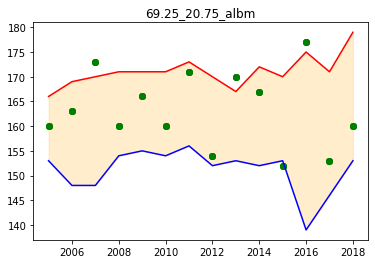

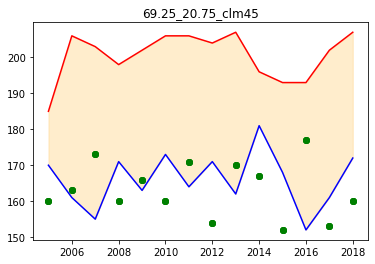

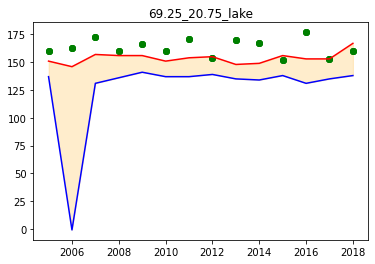

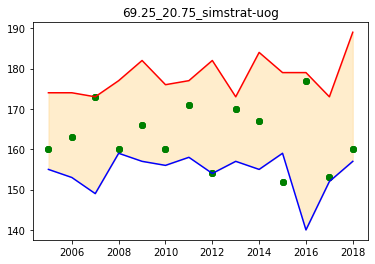

  1%|          | 2/270 [00:01<02:46,  1.61it/s]

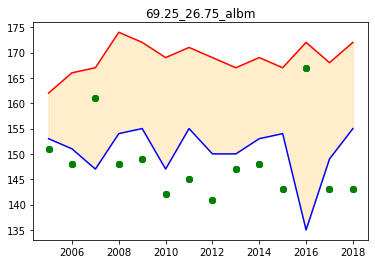

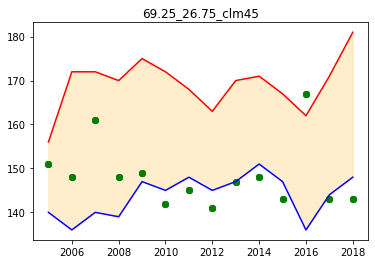

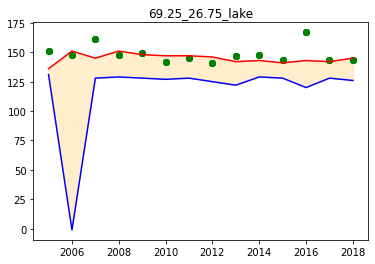

  1%|          | 2/270 [00:02<04:41,  1.05s/it]


KeyboardInterrupt: 

In [230]:
ice_off_ranges = []

for location in tqdm(ice_off_range_kev_iestyn_after_2005['lat_long'].unique()):
    for model in ice_off_range_kev_iestyn_after_2005['lake_model'].unique():
#         for rcp in ice_off_range_kev_iestyn_after_2005['rcp'].unique():
            
#             temp_range_df = ice_off_range_kev_iestyn_after_2005.loc[(ice_off_range_kev_iestyn_after_2005['lat_long'] == location) & 
#                                                                     (ice_off_range_kev_iestyn_after_2005['lake_model'] == model) & 
#                                                                     (ice_off_range_kev_iestyn_after_2005['rcp'] == rcp)]
#             temp_range_df['outside_range'] = np.where((temp_range_df['grouped_ice_off'] < temp_range_df['min_model_rcp_val']) | 
#                                                   (temp_range_df['grouped_ice_off'] > temp_range_df['max_model_rcp_val']), 
#                                                   1, 0)
               
        temp_range_df = ice_off_range_kev_iestyn_after_2005.loc[(ice_off_range_kev_iestyn_after_2005['lat_long'] == location) & 
                                                                (ice_off_range_kev_iestyn_after_2005['lake_model'] == model)]

        temp_range_df['outside_range'] = np.where((temp_range_df['grouped_ice_off'] < temp_range_df['min_model_val']) | 
                                                  (temp_range_df['grouped_ice_off'] > temp_range_df['max_model_val']), 
                                                  1, 0)

        if len(temp_range_df) < 10:
            continue

#         # GRaphs
#         graph.title(f'{location}_{model}')
#         graph.plot(temp_range_df['years'], temp_range_df['max_model_rcp_val'], color='red')
#         graph.plot(temp_range_df['years'], temp_range_df['min_model_rcp_val'], color='blue')
#         graph.fill_between(temp_range_df['years'], temp_range_df['min_model_rcp_val'], temp_range_df['max_model_rcp_val'], 
#                            color = 'orange', alpha=0.2)
#         graph.scatter(temp_range_df['years'], temp_range_df['grouped_ice_off'], color='green')
#         graph.show()
        
        # GRaphs
        graph.title(f'{location}_{model}')
        graph.plot(temp_range_df['years'], temp_range_df['max_model_val'], color='red')
        graph.plot(temp_range_df['years'], temp_range_df['min_model_val'], color='blue')
        graph.fill_between(temp_range_df['years'], temp_range_df['min_model_val'], temp_range_df['max_model_val'], 
                           color = 'orange', alpha=0.2)
        graph.scatter(temp_range_df['years'], temp_range_df['grouped_ice_off'], color='green')
        graph.show()

        # Percentages
        percentage_outside = temp_range_df['outside_range'].sum() / len(temp_range_df)

        ice_off_ranges.append([location, model, rcp, 
                               temp_range_df['transformed_lat'].min(), temp_range_df['transformed_long'].min(), 
                               temp_range_df['lat'].min(), temp_range_df['lon'].min(), 
                               percentage_outside])

In [131]:
ice_on_before_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_before_2005_slopes_aug_11.csv')
ice_off_before_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_before_2005_slopes_aug_11.csv')

ice_on_after_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_after_2005_slopes_aug_05.csv')
ice_off_after_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_after_2005_slopes_aug_05.csv')

df_ice_on_slopes = pd.concat([ice_on_after_slopes, ice_on_before_slopes])
df_ice_off_slopes = pd.concat([ice_off_before_slopes, ice_off_after_slopes])

for df in [df_ice_on_slopes, df_ice_off_slopes]:
    df['lon'] = df['lat_long'].str.split('_').str.get(1).astype(float)
    df['location'] = np.where(df['lon'] < -120, 'alaska', np.nan)
    df['location'] = np.where((df['lon'] > -120) & (df['lon'] <-20), 'mainland_US', df['location'])
    df['location'] = np.where((df['lon'] > -20), 'europe', df['location']) 
    
    df['slope_diff'] = df['slope_model'] - df['slope_in_situ']
    df['mean_diff'] = df['mean_model'] - df['mean_in_situ']
    df['cov_diff'] = df['cov_model'] - df['cov_in_situ']

print(len(df_ice_on_slopes), len(df_ice_off_slopes))

display(df_ice_off_slopes.head())
display(df_ice_on_slopes.head())

6557 9124


,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,perc_outside_range_models,...,len_in_situ_data,start_year,mean_in_situ,slope_in_situ,cov_in_situ,lon,location,slope_diff,mean_diff,cov_diff
0,69.75_27.25,44,ice_off,albm_gfdl-esm2m,historical,162.727273,-0.154475,0.031014,12.269697,1.000000,...,44,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.042988,8.954545,-0.013566
1,69.75_27.25,44,ice_off,albm_hadgem2-es,historical,162.909091,-0.113883,0.037219,13.163310,0.977273,...,44,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.002396,9.136364,-0.007361
2,69.75_27.25,44,ice_off,albm_ipsl-cm5a-lr,historical,163.500000,-0.057646,0.033765,12.873511,1.000000,...,44,2004,153.772727,-0.111487,0.04458,27.25,europe,0.053841,9.727273,-0.010815
3,69.75_27.25,44,ice_off,albm_miroc5,historical,162.431818,-0.011064,0.045684,13.181426,0.954545,...,44,2004,153.772727,-0.111487,0.04458,27.25,europe,0.100423,8.659091,0.001104
4,69.75_27.25,44,ice_off,clm45_gfdl-esm2m,historical,163.590909,-0.130655,0.034217,12.943935,1.000000,...,44,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.019168,9.818182,-0.010363


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,...,len_in_situ_data,start_year,mean_in_situ,slope_in_situ,cov_in_situ,lon,location,slope_diff,mean_diff,cov_diff
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.206260,26,1.0,...,14,2005,-44.142857,0.628571,-0.209533,20.75,europe,0.397802,-11.500000,0.055891
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.642857,0.375824,-0.108350,18.375061,60,1.0,...,14,2005,-44.142857,0.628571,-0.209533,20.75,europe,-0.252747,-14.500000,0.101183
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.428571,0.865934,-0.109343,16.509737,85,1.0,...,14,2005,-44.142857,0.628571,-0.209533,20.75,europe,0.237363,-14.285714,0.100190
3,69.25_20.75,14,ice_on,albm_hadgem2-es,-57.642857,-0.969231,-0.111586,18.456513,26,1.0,...,14,2005,-44.142857,0.628571,-0.209533,20.75,europe,-1.597802,-13.500000,0.097947
4,69.25_20.75,14,ice_on,albm_hadgem2-es,-55.000000,0.184615,-0.112920,15.061778,60,1.0,...,14,2005,-44.142857,0.628571,-0.209533,20.75,europe,-0.443956,-10.857143,0.096613


In [133]:
df_ice_on_slopes.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_sep_15.csv')
df_ice_off_slopes.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_sep_15.csv')


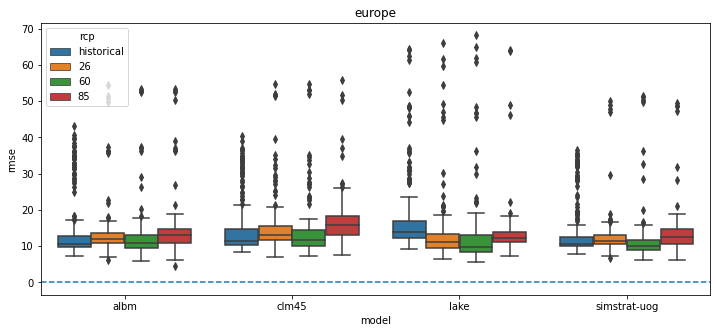

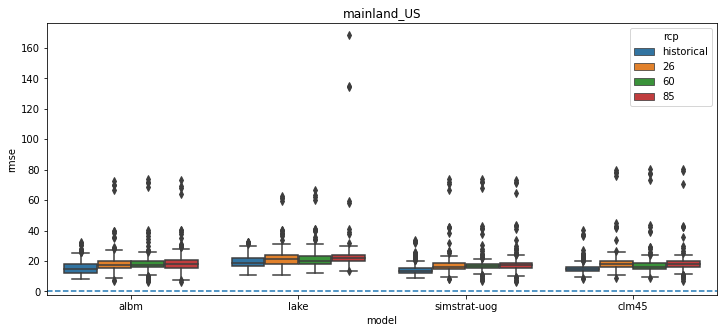

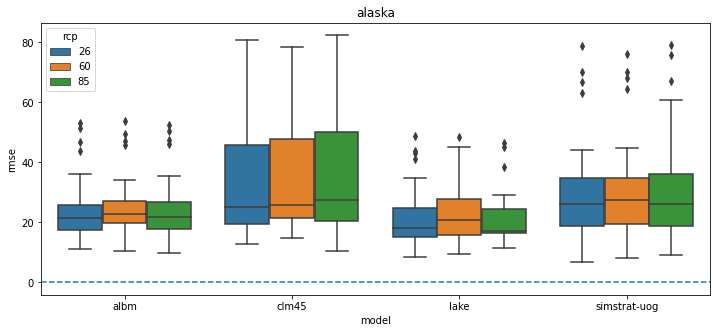

In [8]:
for df in [df_ice_on_slopes, df_ice_off_slopes]:
    df['lon'] = df['lat_long'].str.split('_').str.get(1).astype(float)
    df['location'] = np.where(df['lon'] < -120, 'alaska', np.nan)
    df['location'] = np.where((df['lon'] > -120) & (df['lon'] <-20), 'mainland_US', df['location'])
    df['location'] = np.where((df['lon'] > -20), 'europe', df['location']) 
    
    df['slope_diff'] = df['slope_model'] - df['slope_in_situ']
    df['mean_diff'] = df['mean_model'] - df['mean_in_situ']
    df['cov_diff'] = df['cov_model'] - df['cov_in_situ']

for location in df_ice_off_slopes['location'].unique():

    temp_ice_off_df = df_ice_off_slopes.loc[df_ice_off_slopes['location'] == location]
    
    graph.figure(figsize=(12, 5))
    graph.title(f'{location}')
    sns.boxplot(y='rmse', x='model', hue='rcp', data=temp_ice_off_df, whis=1.5)
    graph.axhline(0, linestyle='--')

    graph.show()

In [34]:
df_ice_off_slopes.columns

Index(['lat_long', 'len_data_models', 'variable', 'lake_model', 'rcp',
       'mean_model', 'slope_model', 'cov_model', 'rmse',
       'perc_outside_range_models', 'model', 'len_in_situ_data', 'start_year',
       'mean_in_situ', 'slope_in_situ', 'cov_in_situ', 'lon', 'location',
       'slope_diff', 'mean_diff', 'cov_diff', 'lat'],
      dtype='object')

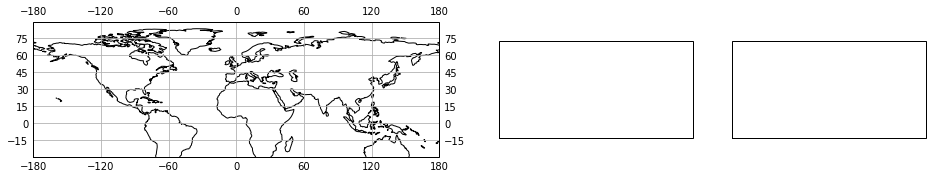

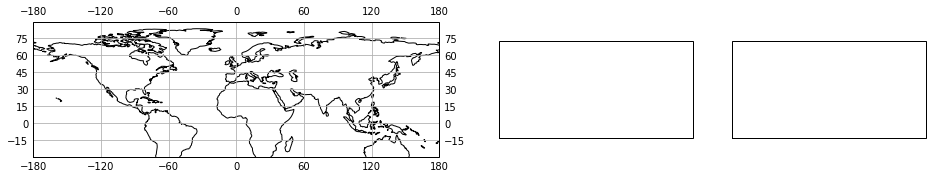

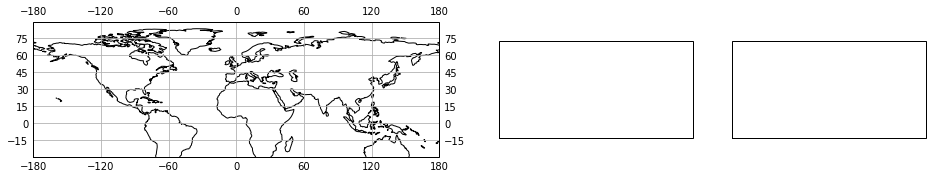

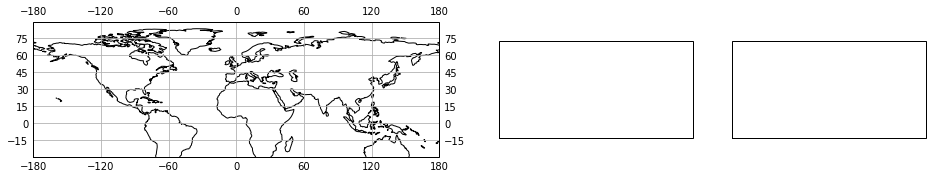

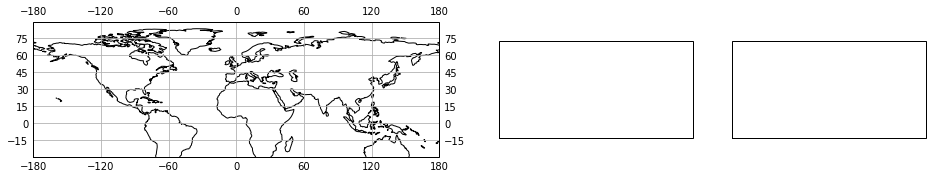

...

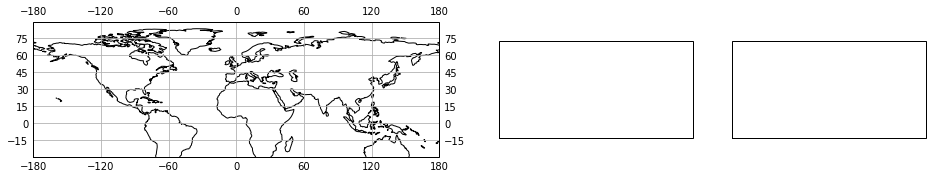

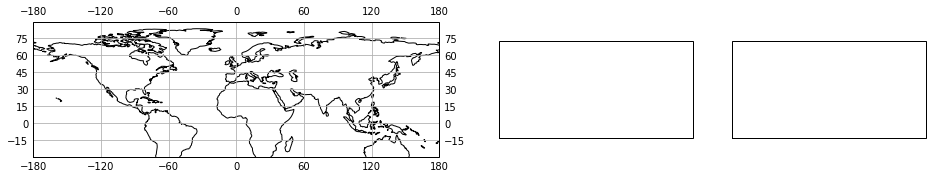

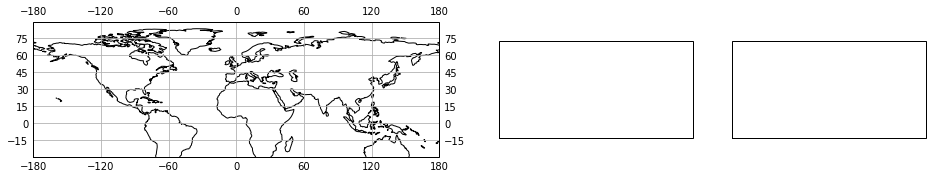

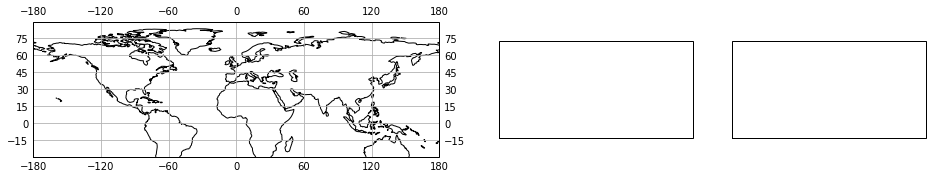

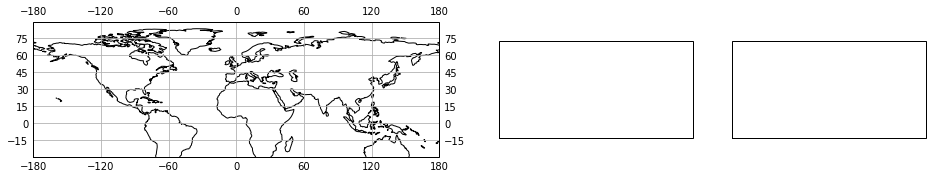

In [35]:
norm = graph.Normalize(df_ice_off_slopes['perc_outside_range_models'].min(), 
                       df_ice_off_slopes['perc_outside_range_models'].max())
sm = graph.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

for location in df_ice_off_slopes['location'].unique():
    for rcp in ['historical', 26, 60, 85]:

        temp_ice_off_df = df_ice_off_slopes.loc[(df_ice_off_slopes['location'] == location) & 
                                                (df_ice_off_slopes['rcp']) == rcp]
        temp_ice_off_df.sort_values(by='perc_outside_range_models', ascending=False, inplace=True)

        f, axes = graph.subplots(1, 4, figsize=(16, 5), 
                                 subplot_kw={'projection': ccrs.PlateCarree()})

        # ALBM
        ax2 = graph.subplot(121, projection=ccrs.PlateCarree())
        ax2.coastlines()
        ax2.gridlines(draw_labels=True)
        ax2.set_extent([-180, 180, -30, 90])

    #     sns.scatterplot(x = 'long', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_on_df, 
    #                     color='red', s=100)
        sns.scatterplot(x = 'lon', y = 'lat', transform=ccrs.PlateCarree(), data = temp_ice_off_df, 
                        color='red', s=100)

# for rcp in ['historical', 26, 60, 85]:
#     temp_ice_off_slope = lake_us.loc[lake_us['rcp'] == rcp]
#     temp_ice_off_slope.sort_values(by='perc_outside_range_models', ascending=False, inplace=True)
    
#     print(rcp)
#     graph.figure(figsize=(25, 3))
#     graph.title(str(rcp), fontsize=20)
#     ax = graph.axes(projection=ccrs.PlateCarree())
#     ax.coastlines()
#     ax.gridlines(draw_labels=True)
#     ax.set_extent([-100, -60, 36, 54])

#     sns.scatterplot(temp_ice_off_slope['lon'], temp_ice_off_slope['lat'], 
#                     hue = temp_ice_off_slope['perc_outside_range_models'], hue_norm = (0.7, 1), 
#                     transform=ccrs.PlateCarree(), s=25, palette = 'viridis')
#     ax.get_legend().remove()
#     ax.figure.colorbar(sm)

#     graph.show()

In [12]:
df_ice_off_slopes['lat'] = df_ice_off_slopes['lat_long'].str.split('_').str.get(0).astype(float)
display(df_ice_off_slopes.head())

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,perc_outside_range_models,...,start_year,mean_in_situ,slope_in_situ,cov_in_situ,lon,location,slope_diff,mean_diff,cov_diff,lat
0,69.75_27.25,44,ice_off,albm_gfdl-esm2m,historical,162.727273,-0.154475,0.031014,12.269697,1.000000,...,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.042988,8.954545,-0.013566,69.75
1,69.75_27.25,44,ice_off,albm_hadgem2-es,historical,162.909091,-0.113883,0.037219,13.163310,0.977273,...,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.002396,9.136364,-0.007361,69.75
2,69.75_27.25,44,ice_off,albm_ipsl-cm5a-lr,historical,163.500000,-0.057646,0.033765,12.873511,1.000000,...,2004,153.772727,-0.111487,0.04458,27.25,europe,0.053841,9.727273,-0.010815,69.75
3,69.75_27.25,44,ice_off,albm_miroc5,historical,162.431818,-0.011064,0.045684,13.181426,0.954545,...,2004,153.772727,-0.111487,0.04458,27.25,europe,0.100423,8.659091,0.001104,69.75
4,69.75_27.25,44,ice_off,clm45_gfdl-esm2m,historical,163.590909,-0.130655,0.034217,12.943935,1.000000,...,2004,153.772727,-0.111487,0.04458,27.25,europe,-0.019168,9.818182,-0.010363,69.75


In [13]:
df_ice_off_slopes.columns

Index(['lat_long', 'len_data_models', 'variable', 'lake_model', 'rcp',
       'mean_model', 'slope_model', 'cov_model', 'rmse',
       'perc_outside_range_models', 'model', 'len_in_situ_data', 'start_year',
       'mean_in_situ', 'slope_in_situ', 'cov_in_situ', 'lon', 'location',
       'slope_diff', 'mean_diff', 'cov_diff', 'lat'],
      dtype='object')

In [14]:
albm_86_perc['rcp'].unique()

NameError: name 'albm_86_perc' is not defined

In [357]:
albm_86_perc = df_ice_off_slopes.loc[(df_ice_off_slopes['location'] == 'mainland_US') & 
                                     (df_ice_off_slopes['rcp'] == 85) &
                                     (df_ice_off_slopes['model'] == 'albm')]
albm_86_perc.sort_values(by='perc_outside_range_models', ascending=False, inplace=True)
albm_86_perc.head()

,lat_long,len_data_models,variable,lake_model,rcp,mean_model,slope_model,cov_model,rmse,perc_outside_range_models,...,start_year,mean_in_situ,slope_in_situ,cov_in_situ,lon,location,slope_diff,mean_diff,cov_diff,lat
4295,45.75_-69.75,14,ice_off,albm_miroc5,85,119.857143,0.083516,0.044469,9.934408,1.0,...,2005,120.083333,0.486081,0.072151,-69.75,mainland_US,-0.402564,-0.226190,-0.027682,45.75
5266,44.75_-69.25,11,ice_off,albm_gfdl-esm2m,85,116.181818,0.136364,0.063655,21.071907,1.0,...,2005,100.333333,-0.875758,0.137505,-69.25,mainland_US,1.012121,15.848485,-0.073850,44.75
4957,44.75_-94.25,12,ice_off,albm_ipsl-cm5a-lr,85,110.083333,-0.283217,0.081795,21.768988,1.0,...,2005,94.135317,-0.868715,0.136465,-94.25,mainland_US,0.585498,15.948016,-0.054671,44.75
4954,44.75_-94.25,12,ice_off,albm_hadgem2-es,85,109.583333,-0.059441,0.096536,22.053523,1.0,...,2005,94.135317,-0.868715,0.136465,-94.25,mainland_US,0.809274,15.448016,-0.039929,44.75
4951,44.75_-94.25,12,ice_off,albm_gfdl-esm2m,85,107.250000,-0.255245,0.062678,19.440118,1.0,...,2005,94.135317,-0.868715,0.136465,-94.25,mainland_US,0.613470,13.114683,-0.073788,44.75


In [80]:
lake_us

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,end_year,mean_in_situ,slope_in_situ,perc_extreme,lon,location,slope_diff,mean_diff,binned_extreme,lat
2180,49.25_-94.75,11,ice_off,lake_gfdl-esm2m,98.363636,-1.172727,31.125844,26,lake,11,...,2015.0,122.272727,0.990909,0.0,-94.75,mainland_US,-2.163636,-23.909091,NaN,49.25
2181,49.25_-94.75,11,ice_off,lake_gfdl-esm2m,105.363636,-1.763636,24.041631,60,lake,11,...,2015.0,122.272727,0.990909,0.0,-94.75,mainland_US,-2.754545,-16.909091,NaN,49.25
2182,49.25_-94.75,11,ice_off,lake_hadgem2-es,101.090909,0.945455,25.550307,26,lake,11,...,2015.0,122.272727,0.990909,0.0,-94.75,mainland_US,-0.045455,-21.181818,NaN,49.25
2183,49.25_-94.75,11,ice_off,lake_hadgem2-es,98.000000,-0.300000,28.295518,60,lake,11,...,2015.0,122.272727,0.990909,0.0,-94.75,mainland_US,-1.290909,-24.272727,NaN,49.25
2184,49.25_-94.75,11,ice_off,lake_hadgem2-es,104.363636,-0.454545,25.928223,85,lake,11,...,2015.0,122.272727,0.990909,0.0,-94.75,mainland_US,-1.445455,-17.909091,NaN,49.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6483,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,78.071429,-0.507692,39.394298,26,lake,14,...,2018.0,53.821429,-0.354945,0.0,-85.25,mainland_US,-0.152747,24.250000,NaN,42.25
6484,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,73.428571,-0.246154,34.128696,60,lake,14,...,2018.0,53.821429,-0.354945,0.0,-85.25,mainland_US,0.108791,19.607143,NaN,42.25
6485,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,68.857143,-0.364835,26.407182,85,lake,14,...,2018.0,53.821429,-0.354945,0.0,-85.25,mainland_US,-0.009890,15.035714,NaN,42.25
6486,42.25_-85.25,13,ice_off,lake_miroc5,65.615385,-2.412088,37.934660,26,lake,14,...,2018.0,53.821429,-0.354945,0.0,-85.25,mainland_US,-2.057143,11.793956,NaN,42.25


historical


AttributeError: 'NoneType' object has no attribute 'remove'

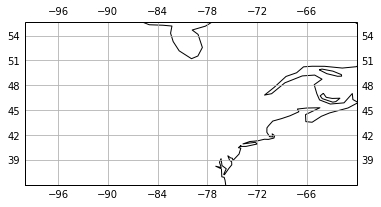

In [79]:
lake_us = df_ice_off_slopes.loc[(df_ice_off_slopes['location'] == 'mainland_US') & 
                                     (df_ice_off_slopes['model'] == 'lake')]
lake_us['lat'] = lake_us['lat_long'].str.split('_').str.get(0).astype(float)

norm = graph.Normalize(lake_us['rmse'].min(), lake_us['rmse'].max())
sm = graph.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])

for rcp in ['historical', 26, 60, 85]:
    temp_ice_off_slope = lake_us.loc[lake_us['rcp'] == rcp]
    temp_ice_off_slope.sort_values(by='rmse', ascending=False, inplace=True)
    
    print(rcp)
    graph.figure(figsize=(25, 3))
    graph.title(str(rcp), fontsize=20)
    ax = graph.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.gridlines(draw_labels=True)
    ax.set_extent([-100, -60, 36, 54])

    sns.scatterplot(temp_ice_off_slope['lon'], temp_ice_off_slope['lat'], 
                    hue = temp_ice_off_slope['rmse'], hue_norm = (0.7, 1), 
                    transform=ccrs.PlateCarree(), s=25, palette = 'viridis')
    ax.get_legend().remove()
    ax.figure.colorbar(sm)

    graph.show()

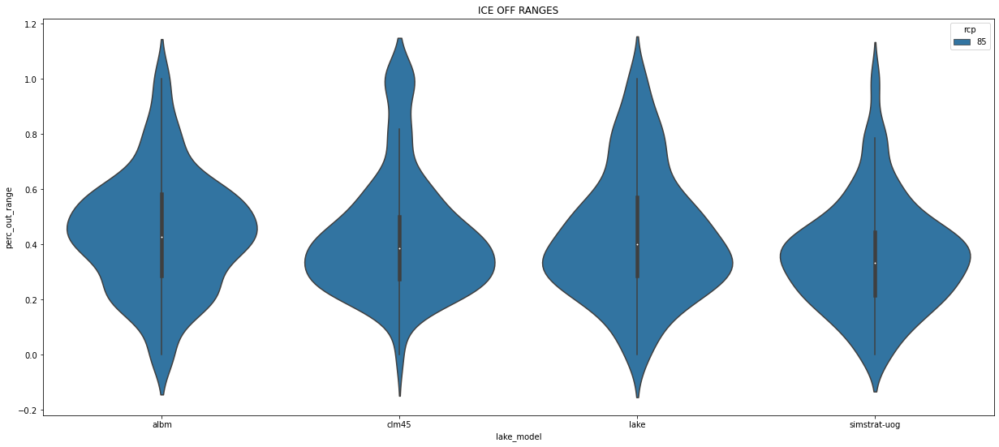

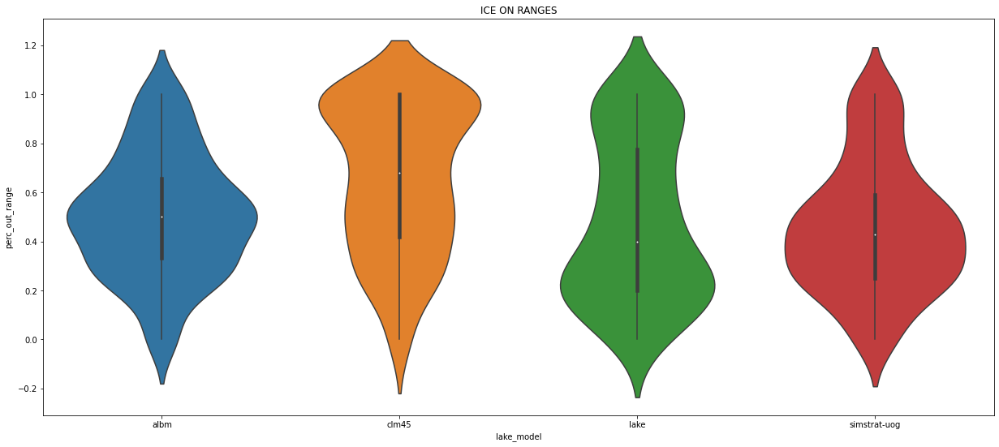

In [248]:
graph.figure(figsize=(21, 9))
graph.title('ICE OFF RANGES')
sns.violinplot(y='perc_out_range', x='lake_model', hue= 'rcp', data=df_ice_off_ranges)
graph.show()

graph.figure(figsize=(21, 9))
graph.title('ICE ON RANGES')
sns.violinplot(y='perc_out_range', x='lake_model', data=df_ice_on_ranges)
graph.show()

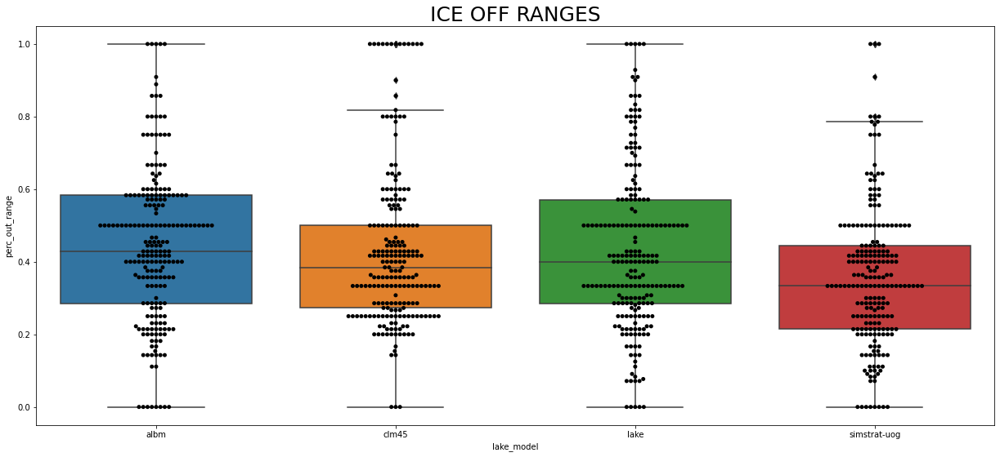

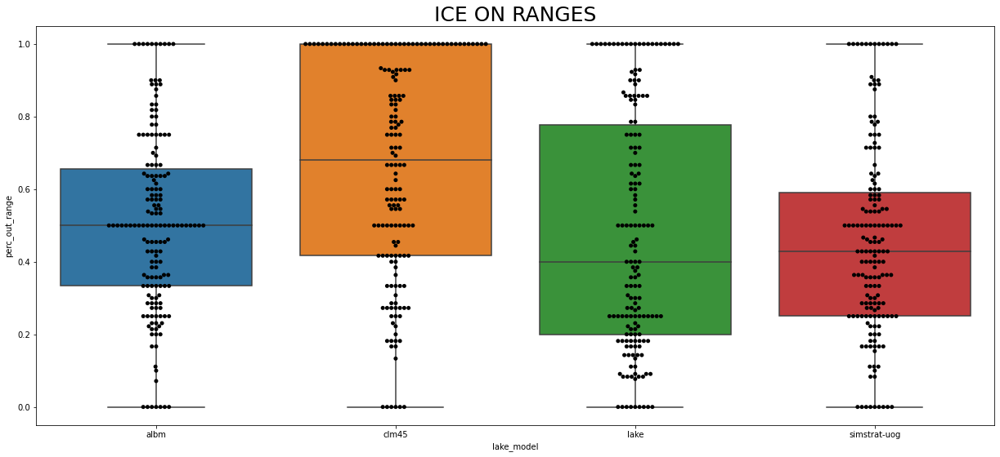

In [233]:
graph.figure(figsize=(21, 9))
graph.title('ICE OFF RANGES', fontsize=25)
sns.boxplot(y='perc_out_range', x='lake_model', data=df_ice_off_ranges)
sns.swarmplot(y='perc_out_range', x='lake_model', data=df_ice_off_ranges, color='black')
graph.show()

graph.figure(figsize=(21, 9))
graph.title('ICE ON RANGES', fontsize=25)
sns.boxplot(y='perc_out_range', x='lake_model', data=df_ice_on_ranges)
sns.swarmplot(y='perc_out_range', x='lake_model', data=df_ice_on_ranges, color='black')
graph.show()

# Plotting Winga, Mendota, Monona

In [47]:
in_situ = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/kevin_lakes_in_situ_aug_31.csv')

in_situ['lake'] = np.where(((in_situ['latitude'] == 43.054) & (in_situ['longitude'] == -89.419)), 
                           'wingra', np.nan)
in_situ['lake'] = np.where(((in_situ['latitude'] == 43.067) & (in_situ['longitude'] == -89.366)), 
                           'mendota', in_situ['lake'])
in_situ['lake'] = np.where(((in_situ['latitude'] == 43.128) & (in_situ['longitude'] == -89.42)), 
                           'monona', in_situ['lake'])

in_situ['conv_lat'] = np.round((in_situ['latitude']+0.25)*2)/2.-0.25
in_situ['conv_long'] = np.round((in_situ['longitude']+0.25)*2)/2.-0.25
in_situ['lat_long']

in_situ = in_situ.loc[in_situ['lake'].isin(['wingra', 'monona', 'mendota'])]

wingra = in_situ.loc[in_situ['lake'] == 'wingra']
monona = in_situ.loc[in_situ['lake'] == 'monona']
mendota = in_situ.loc[in_situ['lake'] == 'mendota']
in_situ.head()

,start_year,froze,froze_1,ice_on_1,ice_off_1,orig_duration,orig_duration_column,latitude,longitude,lat_long,ice_on_doy,ice_off_doy,lake,conv_lat,conv_long
524,1901,Y,Y,1901-12-15,1902-03-30,105.0,ice_duration,43.128,-89.42,43.1_-89.4,-16.0,89.0,monona,43.25,-89.25
525,1902,Y,Y,1902-12-25,1903-03-24,89.0,ice_duration,43.128,-89.42,43.1_-89.4,-6.0,83.0,monona,43.25,-89.25
526,1903,Y,Y,1903-12-13,1904-04-17,126.0,ice_duration,43.128,-89.42,43.1_-89.4,-18.0,108.0,monona,43.25,-89.25
527,1904,Y,Y,1904-12-14,1905-04-01,108.0,ice_duration,43.128,-89.42,43.1_-89.4,-17.0,91.0,monona,43.25,-89.25
528,1905,Y,Y,1906-01-01,1906-04-08,97.0,ice_duration,43.128,-89.42,43.1_-89.4,1.0,98.0,monona,43.25,-89.25


In [48]:
model_time_series = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/merged_kev_iestyn_jul_28_2021.csv')
model_time_series.dropna(subset=['diff_ice_on', 'diff_ice_off'], how='all', inplace=True)
display(model_time_series)

,Unnamed: 0,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted
0,0,74.75,101.25,0.0,1959.0,26,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
1,1,74.75,101.25,0.0,1959.0,60,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
2,2,74.75,101.25,0.0,1959.0,85,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,194.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0
3,3,74.75,101.25,-1.0,1959.0,26,albm_hadgem2-es,74.75_101.25,-92.0,338.0,217.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0
4,4,74.75,101.25,-1.0,1959.0,60,albm_hadgem2-es,74.75_101.25,-92.0,338.0,217.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1954151,1954151,53.75,23.25,36.0,1963.0,26,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,92.0,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0
1954152,1954152,53.75,23.25,36.0,1963.0,60,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,92.0,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0
1954153,1954153,53.75,23.25,36.0,1963.0,85,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,92.0,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0
1954154,1954154,53.75,23.25,70.0,1963.0,26,lake_miroc5,53.75_23.25,-21.0,217.0,96.0,53.75,23.25,-17.0,108.0,-17.0,108.0,-4.0,-12.0,96.0


In [49]:
mendota_grid = model_time_series.loc[(model_time_series['lat'] == 43.25) & (model_time_series['lon'] == -89.25)]
mendota_grid['lake_model'] = mendota_grid['model'].str.split('_').str.get(0)

subset_mendota_grid_lake = mendota_grid.loc[(mendota_grid['rcp'] == 85) & 
                                            (mendota_grid['model'] == 'clm45_gfdl-esm2m')]
subset_mendota_grid_albm = mendota_grid.loc[(mendota_grid['rcp'] == 85) & 
                                            (mendota_grid['model'] == 'albm_gfdl-esm2m')]
subset_mendota_grid_simstrat = mendota_grid.loc[(mendota_grid['rcp'] == 85) & 
                                                (mendota_grid['model'] == 'simstrat-uog_gfdl-esm2m')]
subset_mendota_grid_clm45 = mendota_grid.loc[(mendota_grid['rcp'] == 85) & 
                                             (mendota_grid['model'] == 'lake_gfdl-esm2m')]

subset_medota_grid_models = mendota_grid.loc[mendota_grid['rcp'] == 60]
subset_medota_grid_models.drop_duplicates(inplace=True)

for df in [subset_mendota_grid_albm, subset_mendota_grid_lake, subset_mendota_grid_simstrat, subset_mendota_grid_lake]:
#     df.drop(columns = ['icestart', 'iceend', 'ice_on_doy', 'ice_off_doy'], inplace=True)
    df.drop_duplicates(inplace=True)
display(subset_mendota_grid_albm.head())

,Unnamed: 0,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,...,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted,lake_model
1857673,1857673,43.25,-89.25,90.0,1901.0,85,albm_gfdl-esm2m,43.25_-89.25,-1.0,225.0,...,43.25,-89.25,-16.0,89.0,-16.5,87.5,15.5,16.5,104.0,albm
1857674,1857674,43.25,-89.25,90.0,1901.0,85,albm_gfdl-esm2m,43.25_-89.25,-1.0,225.0,...,43.25,-89.25,-17.0,86.0,-16.5,87.5,15.5,16.5,104.0,albm
1857767,1857767,43.25,-89.25,88.0,1902.0,85,albm_gfdl-esm2m,43.25_-89.25,-3.0,230.0,...,43.25,-89.25,-6.0,83.0,-5.5,81.5,2.5,27.5,109.0,albm
1857768,1857768,43.25,-89.25,88.0,1902.0,85,albm_gfdl-esm2m,43.25_-89.25,-3.0,230.0,...,43.25,-89.25,-5.0,80.0,-5.5,81.5,2.5,27.5,109.0,albm
1857861,1857861,43.25,-89.25,85.0,1903.0,85,albm_gfdl-esm2m,43.25_-89.25,-6.0,218.0,...,43.25,-89.25,-18.0,108.0,-26.0,107.0,20.0,-10.0,97.0,albm


In [50]:
subset_medota_grid_models_min_max = subset_medota_grid_models.groupby('years')[['grouped_icestart', 'grouped_iceend']].agg({'min', 'max'}).reset_index()
subset_medota_grid_models_min_max

years grouped_icestart       grouped_iceend       
                         min   max            min    max
0    1901.0            -51.0  -1.0           63.0  121.0
1    1902.0            -36.0  -3.0           78.0  115.0
2    1903.0            -38.0  -6.0           68.0  114.0
3    1904.0            -47.0  -1.0           63.0  122.0
4    1905.0            -52.0 -10.0           82.0  117.0
..      ...              ...   ...            ...    ...
114  2015.0            -43.0  14.0           61.0  112.0
115  2016.0            -37.0  15.0           52.0  109.0
116  2017.0            -36.0  30.0           57.0  113.0
117  2018.0            -33.0  26.0           57.0  109.0
118  2019.0            -35.0  22.0           67.0  104.0

[119 rows x 5 columns]

In [71]:
a = np.empty(len(wingra.loc[wingra['start_year'] < 1930]))
a.fill(40)
a

array([40., 40., 40., 40., 40., 40., 40., 40.])

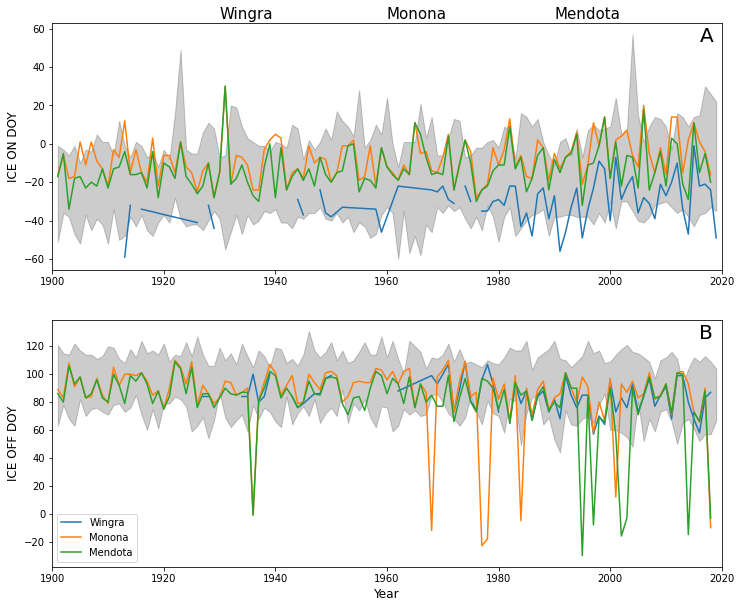

In [74]:
fig, (ax1, ax2) = graph.subplots(2, 1, figsize=(12, 10))

ax1.plot(wingra['start_year'], wingra['ice_on_doy'], label='Wingra')
ax1.plot(monona['start_year'], monona['ice_on_doy'], label='Monona')
ax1.plot(mendota['start_year'], mendota['ice_on_doy'], label='Mendota')

ax1.fill_between(subset_medota_grid_models_min_max['years'], 
                   subset_medota_grid_models_min_max['grouped_icestart', 'min'], 
                   subset_medota_grid_models_min_max['grouped_icestart', 'max'], color='black', alpha=0.2)
ax1.set_xlabel('', fontsize=12)
ax1.set_ylabel('ICE ON DOY', fontsize=12)
ax1.set_xlim(1900, 2020)
ax1.text(2016, 53, 'A', fontsize=20)
# ax1.legend()

ax2.plot(wingra['start_year'], wingra['ice_off_doy'], label='Wingra')
ax2.plot(monona['start_year'], monona['ice_off_doy'], label='Monona')
ax2.plot(mendota['start_year'], mendota['ice_off_doy'], label='Mendota')

ax2.fill_between(subset_medota_grid_models_min_max['years'], 
                   subset_medota_grid_models_min_max['grouped_iceend', 'min'], 
                   subset_medota_grid_models_min_max['grouped_iceend', 'max'], color='black', alpha=0.2)
ax2.set_xlabel('Year', fontsize=12)
ax2.set_ylabel('ICE OFF DOY', fontsize=12)
ax2.set_xlim(1900, 2020)
ax2.legend(loc='lower left')
ax2.text(2016, 125, 'B', fontsize=20)

ax1.text(1930, 65, 'Wingra', fontsize=15)
ax1.text(1960, 65, 'Monona', fontsize=15)
ax1.text(1990, 65, 'Mendota', fontsize=15)

fig.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/wingra_mendota_monona_models_timeseries.png', 
            bbox_inches='tight')
fig.show()

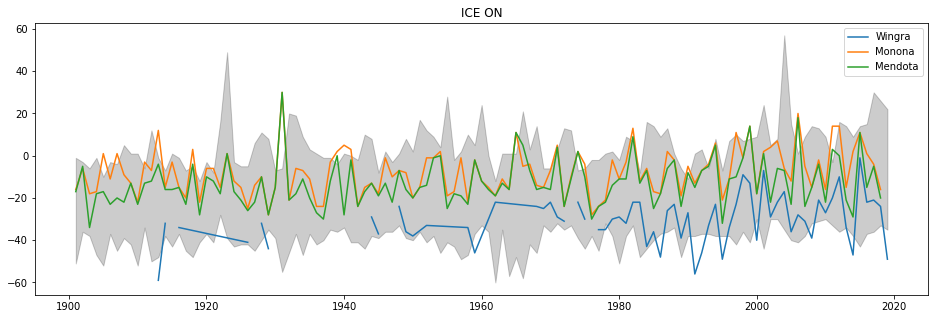

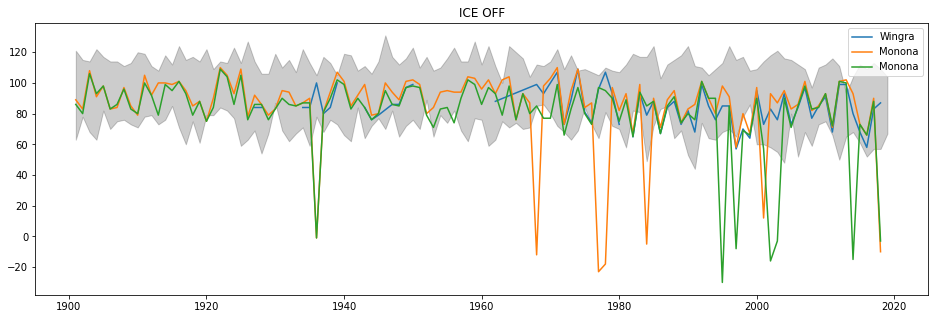

In [47]:
fig, (ax1, ax2) = graph.subplots(2, 1, figsize=(16, 5))
graph.title('ICE ON')

graph.plot(wingra['start_year'], wingra['ice_on_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_on_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_on_doy'], label='Mendota')

# graph.plot(subset_mendota_grid_albm['years'], subset_mendota_grid_albm['grouped_icestart'], 
#            label = 'ALBM', linestyle='--')
# graph.plot(subset_mendota_grid_clm45['years'], subset_mendota_grid_clm45['grouped_icestart'], 
#            label = 'CLM45', linestyle='--')
# graph.plot(subset_mendota_grid_lake['years'], subset_mendota_grid_lake['grouped_icestart'], 
#            label = 'LAKE', linestyle='--')
# graph.plot(subset_mendota_grid_simstrat['years'], subset_mendota_grid_simstrat['grouped_icestart'], 
#            label = 'SIMSTRAT', linestyle='--')

graph.fill_between(subset_medota_grid_models_min_max['years'], 
                   subset_medota_grid_models_min_max['grouped_icestart', 'min'], 
                   subset_medota_grid_models_min_max['grouped_icestart', 'max'], color='black', alpha=0.2)

# graph.xlim(2004, 2020)

graph.legend()
graph.show()

graph.figure(figsize=(16, 5))
graph.title('ICE OFF')

graph.plot(wingra['start_year'], wingra['ice_off_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_off_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_off_doy'], label='Monona')

# graph.plot(subset_mendota_grid_albm['years'], subset_mendota_grid_albm['grouped_iceend'], 
#            label = 'ALBM', linestyle='--')
# graph.plot(subset_mendota_grid_clm45['years'], subset_mendota_grid_clm45['grouped_iceend'], 
#            label = 'CLM45', linestyle='--')
# graph.plot(subset_mendota_grid_lake['years'], subset_mendota_grid_lake['grouped_iceend'], 
#            label = 'LAKE', linestyle='--')
# graph.plot(subset_mendota_grid_simstrat['years'], subset_mendota_grid_simstrat['grouped_iceend'], 
#            label = 'SIMSTRAT', linestyle='--')

graph.fill_between(subset_medota_grid_models_min_max['years'], 
                   subset_medota_grid_models_min_max['grouped_iceend', 'min'], 
                   subset_medota_grid_models_min_max['grouped_iceend', 'max'], color='black', alpha=0.2)

# graph.xlim(2004, 2020)

graph.legend()
graph.show()

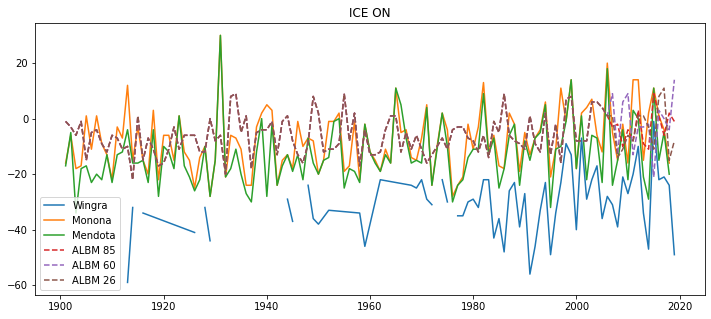

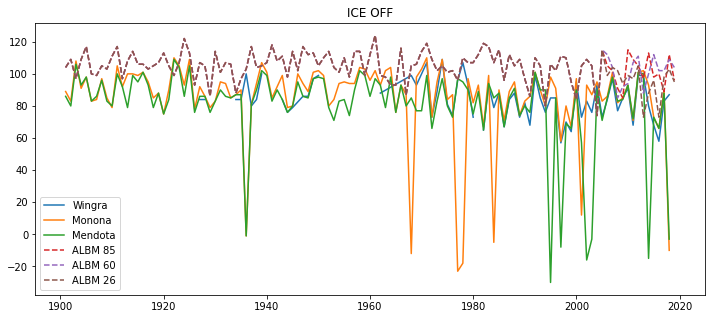

In [50]:
graph.figure(figsize=(12, 5))
graph.title('ICE ON')

graph.plot(wingra['start_year'], wingra['ice_on_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_on_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_on_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_icestart'], label = 'ALBM 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_icestart'], label = 'ALBM 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_icestart'], label = 'ALBM 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

graph.figure(figsize=(12, 5))
graph.title('ICE OFF')

graph.plot(wingra['start_year'], wingra['ice_off_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_off_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_off_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_iceend'], label = 'ALBM 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_iceend'], label = 'ALBM 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_iceend'], label = 'ALBM 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

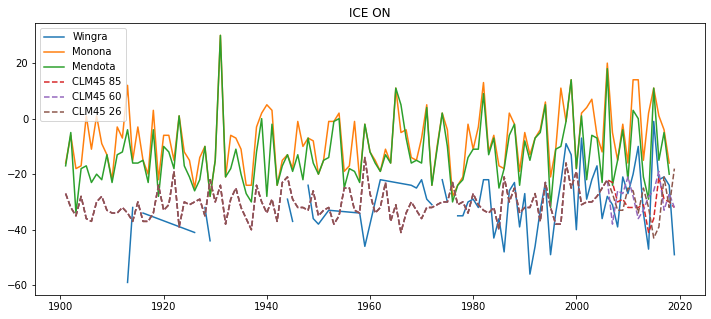

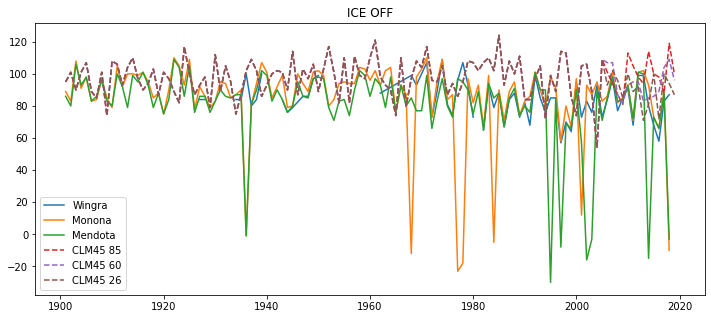

In [56]:
graph.figure(figsize=(12, 5))
graph.title('ICE ON')

graph.plot(wingra['start_year'], wingra['ice_on_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_on_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_on_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_icestart'], label = 'CLM45 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_icestart'], label = 'CLM45 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_icestart'], label = 'CLM45 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

graph.figure(figsize=(12, 5))
graph.title('ICE OFF')

graph.plot(wingra['start_year'], wingra['ice_off_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_off_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_off_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_iceend'], label = 'CLM45 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_iceend'], label = 'CLM45 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_iceend'], label = 'CLM45 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

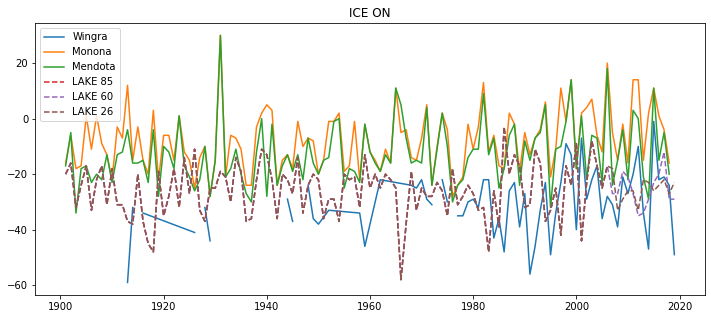

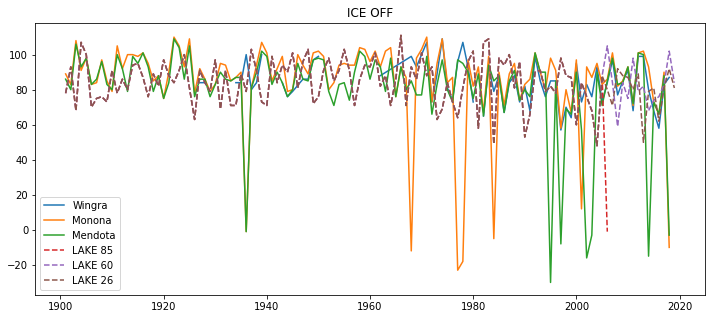

In [58]:
graph.figure(figsize=(12, 5))
graph.title('ICE ON')

graph.plot(wingra['start_year'], wingra['ice_on_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_on_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_on_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_icestart'], label = 'LAKE 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_icestart'], label = 'LAKE 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_icestart'], label = 'LAKE 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

graph.figure(figsize=(12, 5))
graph.title('ICE OFF')

graph.plot(wingra['start_year'], wingra['ice_off_doy'], label='Wingra')
graph.plot(monona['start_year'], monona['ice_off_doy'], label='Monona')
graph.plot(mendota['start_year'], mendota['ice_off_doy'], label='Mendota')
graph.plot(subset_mendota_grid_85['years'], subset_mendota_grid_85['grouped_iceend'], label = 'LAKE 85', linestyle='--')
graph.plot(subset_mendota_grid_60['years'], subset_mendota_grid_60['grouped_iceend'], label = 'LAKE 60', linestyle='--')
graph.plot(subset_mendota_grid_26['years'], subset_mendota_grid_26['grouped_iceend'], label = 'LAKE 26', linestyle='--')
# graph.xlim(2005, 2020)

graph.legend()
graph.show()

In [66]:
all_lakes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/all_lakes_ts_minimal_KB_Aug31.csv')
all_lakes.columns

Index(['lakecode', 'lake', 'start_year', 'froze', 'froze_1', 'froze_2',
       'froze_3', 'froze_4', 'froze_5', 'froze_6', 'ice_on_1', 'ice_off_1',
       'ice_on_2', 'ice_off_2', 'ice_on_3', 'ice_off_3', 'ice_on_4',
       'ice_off_4', 'ice_on_5', 'ice_off_5', 'ice_on_6', 'ice_off_6',
       'orig_duration', 'orig_duration_column', 'latitude', 'longitude',
       'other_lakenames'],
      dtype='object')

In [67]:
all_lakes = all_lakes[['lakecode', 'lake', 'latitude', 'longitude', 'other_lakenames']]
all_lakes.drop_duplicates(inplace=True)
all_lakes

,lakecode,lake,latitude,longitude,other_lakenames
0,ARAI1,suwa,36.040000,138.080000,Lake Suwa;LAKE SUWA;Suwa
576,ARAK1,suwa,36.040000,138.080000,LAKE SUWA (ARAKAWA)
633,ASK01,mjosa_-_kisa-kapp,60.771000,11.024000,LAKE MJOSA - KISA-KAPP
765,BB1,mercer,46.160000,-90.059000,MERCER
789,BB2,turtle_flambeau_flowage,46.075000,-90.137000,TURTLE FLAMBEAU FLOWAGE
...,...,...,...,...,...
61441,xKB2010,zumbro,44.184860,-92.475030,Zumbro (MN55000400)
61462,xLK01,mary,47.185254,-95.167191,Mary Lake;Mary (MN29028900)
61494,xLK02,elk,47.188770,-95.217690,Elk;Elk (MN15001000)
61526,xLK03,ozawindib,47.228810,-95.273010,Ozawindib;Ozawindib (MN15000500)


In [20]:
isimip_depths = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Iestyn_characteristics/lake_depths_isimip.csv')
isimip_depths.drop(columns = 'Unnamed: 0', inplace=True)

isimip_depths = pd.melt(isimip_depths, id_vars='lon', value_name='model_depth', var_name='lat')
isimip_depths.dropna(inplace=True)
isimip_depths['lat'] = isimip_depths['lat'].astype(float)

isimip_area = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Iestyn_characteristics/lake_areas_isimip.csv')
isimip_area.drop(columns = 'Unnamed: 0', inplace=True)
isimip_area = pd.melt(isimip_area, id_vars='lon', value_name='model_avg_area', var_name='lat')
isimip_area.dropna(inplace=True)
isimip_area['lat'] = isimip_area['lat'].astype(float)

isimip_depth_area = pd.merge(isimip_area, isimip_depths)
display(isimip_depth_area)

,lon,lat,model_avg_area,model_depth
0,-75.25,83.25,9.082957,10.0
1,-77.75,82.75,0.780184,10.0
2,-70.75,82.75,0.557274,10.0
3,-44.75,82.75,1.300307,10.0
4,-68.25,82.25,1.206429,10.0
...,...,...,...,...
17472,-139.75,-85.25,84.745949,10.0
17473,-139.25,-85.25,87.028900,10.0
17474,-138.75,-85.25,87.028900,10.0
17475,-138.25,-85.25,73.659668,10.0


In [3]:
in_situ_depths = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Lake_depths/in_situ_all_lakes_phys_char.csv')
in_situ_depths = in_situ_depths[['latitude', 'longitude', 'mean_depth', 'max_depth']]

in_situ_depths['latgrid'] = np.round((in_situ_depths['latitude'] + 0.25) * 2) / 2.-0.25
in_situ_depths['longrid'] = np.round((in_situ_depths['longitude'] + 0.25) * 2) / 2.-0.25
in_situ_depths.sort_values(by=['latgrid', 'longrid'], inplace=True)

in_situ_depths['grouped_mean_depth'] = in_situ_depths.groupby(['latgrid', 'longrid'])['mean_depth'].transform('mean')
in_situ_depths['grouped_max_depth'] = in_situ_depths.groupby(['latgrid', 'longrid'])['max_depth'].transform('mean')
in_situ_depths.drop(columns = ['mean_depth', 'max_depth', 'latitude', 'longitude'], inplace=True)
in_situ_depths.dropna(subset=['grouped_mean_depth', 'grouped_max_depth'], inplace=True)
in_situ_depths.drop_duplicates(inplace=True)

in_situ_depths

,latgrid,longrid,grouped_mean_depth,grouped_max_depth
0,36.25,138.25,4.55,7.6
623,36.75,100.25,3.00,26.0
170,41.25,-73.75,3.40,6.1
169,41.75,-75.25,5.50,15.2
155,41.75,-74.25,6.50,18.0
...,...,...,...,...
124,68.75,28.25,14.30,92.0
126,69.25,20.75,19.50,57.0
132,69.25,26.75,8.50,74.0
317,69.25,28.25,14.40,91.8


In [4]:
merged_depths = pd.merge(in_situ_depths, isimip_depths, how='inner', left_on=['latgrid','longrid'], 
                       right_on=['lat','lon']).drop(['lat', 'lon'], axis=1)
merged_depths['model_mean_depth_diff'] = abs(merged_depths['grouped_mean_depth'] - merged_depths['model_depth'])
merged_depths['model_max_depth_diff'] = abs(merged_depths['grouped_max_depth'] - merged_depths['model_depth'])
merged_depths

,latgrid,longrid,grouped_mean_depth,grouped_max_depth,model_depth,model_mean_depth_diff,model_max_depth_diff
0,36.75,100.25,3.000000,26.000000,16.478798,13.478798,9.521202
1,41.25,-73.75,3.400000,6.100000,9.750054,6.350054,3.650054
2,41.75,-74.25,6.500000,18.000000,10.638763,4.138763,7.361237
3,42.25,-79.25,4.433333,14.733333,10.219866,5.786532,4.513468
4,42.75,-89.25,5.180000,9.450000,9.763813,4.583813,0.313813
...,...,...,...,...,...,...,...
135,68.75,28.25,14.300000,92.000000,10.717996,3.582004,81.282004
136,69.25,20.75,19.500000,57.000000,10.886524,8.613476,46.113476
137,69.25,26.75,8.500000,74.000000,14.233820,5.733820,59.766180
138,69.25,28.25,14.400000,91.800000,12.489051,1.910949,79.310949


In [2]:
df_ice_off_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_oct_07_after_2005.csv') 
df_ice_on_slopes = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_oct_07_after_2005.csv')
display(df_ice_on_slopes, df_ice_off_slopes)

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,model,len_in_situ_data,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.206260,26,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.642857,0.375824,-0.108350,18.375061,60,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.428571,0.865934,-0.109343,16.509737,85,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
3,69.25_20.75,14,ice_on,albm_hadgem2-es,-57.642857,-0.969231,-0.111586,18.456513,26,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
4,69.25_20.75,14,ice_on,albm_hadgem2-es,-55.000000,0.184615,-0.112920,15.061778,60,1.0,albm,14,2005.0,2018.0,-44.142857,0.628571,0.071429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4596,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-10.928571,0.657143,-1.198291,19.819273,26,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4597,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-8.285714,-0.826374,-1.950030,23.031423,60,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4598,42.25_-85.25,14,ice_on,lake_ipsl-cm5a-lr,-10.571429,0.672527,-1.563660,23.411307,85,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429
4599,42.25_-85.25,13,ice_on,lake_miroc5,-11.615385,1.549451,-1.511501,23.045106,26,1.0,lake,14,2005.0,2018.0,-2.964286,-0.376923,0.071429


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.928571,-0.301099,7.787352,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,165.285714,-0.202198,8.960230,85,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
3,69.25_20.75,14,ice_off,albm_hadgem2-es,163.214286,0.626374,9.338859,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
4,69.25_20.75,14,ice_off,albm_hadgem2-es,156.214286,0.063736,9.676924,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6483,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,78.071429,-0.507692,39.394298,26,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6484,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,73.428571,-0.246154,34.128696,60,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6485,42.25_-85.25,14,ice_off,lake_ipsl-cm5a-lr,68.857143,-0.364835,26.407182,85,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0
6486,42.25_-85.25,13,ice_off,lake_miroc5,65.615385,-2.412088,37.934660,26,lake,14,2005.0,2018.0,53.821429,-0.354945,0.0


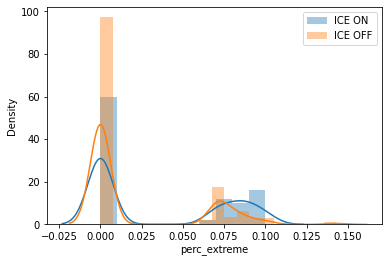

In [83]:
sns.distplot(df_ice_on_slopes['perc_extreme'], label='ICE ON')
sns.distplot(df_ice_off_slopes['perc_extreme'], label='ICE OFF')
graph.legend()
graph.show()

In [84]:
df_ice_on_slopes['perc_extreme'].unique()

array([0.07142857, 0.        , 0.07692308, 0.09090909, 0.1       ,
       0.08333333, 0.06666667])

In [86]:
bins = [-1, 0.02, 0.04, 0.08, 0.5]
labels = ['0-2', '2-4', '4-8', '>8']

for df in [df_ice_on_slopes, df_ice_off_slopes]:
    df['binned_extreme'] = pd.cut(df['perc_extreme'], bins, labels = labels)
    display(df.head())

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,...,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme,lon,location,slope_diff,mean_diff,binned_extreme
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.206260,26,1.0,...,2005.0,2018.0,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.500000,4-8
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.642857,0.375824,-0.108350,18.375061,60,1.0,...,2005.0,2018.0,-44.142857,0.628571,0.071429,20.75,europe,-0.252747,-14.500000,4-8
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-58.428571,0.865934,-0.109343,16.509737,85,1.0,...,2005.0,2018.0,-44.142857,0.628571,0.071429,20.75,europe,0.237363,-14.285714,4-8
3,69.25_20.75,14,ice_on,albm_hadgem2-es,-57.642857,-0.969231,-0.111586,18.456513,26,1.0,...,2005.0,2018.0,-44.142857,0.628571,0.071429,20.75,europe,-1.597802,-13.500000,4-8
4,69.25_20.75,14,ice_on,albm_hadgem2-es,-55.000000,0.184615,-0.112920,15.061778,60,1.0,...,2005.0,2018.0,-44.142857,0.628571,0.071429,20.75,europe,-0.443956,-10.857143,4-8


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,start_year,end_year,mean_in_situ,slope_in_situ,perc_extreme,lon,location,slope_diff,mean_diff,binned_extreme
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0,20.75,europe,-0.509890,0.571429,0-2
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.928571,-0.301099,7.787352,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0,20.75,europe,-0.054945,0.642857,0-2
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,165.285714,-0.202198,8.960230,85,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0,20.75,europe,0.043956,2.000000,0-2
3,69.25_20.75,14,ice_off,albm_hadgem2-es,163.214286,0.626374,9.338859,26,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0,20.75,europe,0.872527,-0.071429,0-2
4,69.25_20.75,14,ice_off,albm_hadgem2-es,156.214286,0.063736,9.676924,60,albm,14,2005.0,2018.0,163.285714,-0.246154,0.0,20.75,europe,0.309890,-7.071429,0-2


In [82]:
df['binned_extreme'].unique()

[NaN, '4-8', '>8']
Categories (2, object): ['4-8' < '>8']

In [78]:
df = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/merged_kev_iestyn_apr_26_2021.csv')
print(len(df))
df.dropna(subset=['diff_ice_on', 'diff_ice_off'], how='all', inplace=True)
print(len(df))

df['location'] = np.where(df['lon'] < -120, 'alaska', np.nan)
df['location'] = np.where((df['lon'] > -120) & (df['lon'] <-20), 'mainland_US', df['location'])
df['location'] = np.where((df['lon'] > -20), 'europe', df['location']) 

df['lake_model'] = df['model'].str.split('_').str.get(0)
    
display(df.head())

1954156
1944496


,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,grouped_iceend,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,location,lake_model
0,74.75,101.25,0.0,1959.0,26,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,224.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,58.0,europe,albm
1,74.75,101.25,0.0,1959.0,60,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,224.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,58.0,europe,albm
2,74.75,101.25,0.0,1959.0,85,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,224.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,58.0,europe,albm
3,74.75,101.25,-1.0,1959.0,26,albm_hadgem2-es,74.75_101.25,-92.0,338.0,247.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,81.0,europe,albm
4,74.75,101.25,-1.0,1959.0,60,albm_hadgem2-es,74.75_101.25,-92.0,338.0,247.0,74.75,101.25,NaN,166.0,NaN,166.0,NaN,81.0,europe,albm


In [96]:
for df in [df_ice_on_slopes, df_ice_off_slopes]:
    df['lon'] = df['lat_long'].str.split('_').str.get(1).astype(float)
    df['location'] = np.where(df['lon'] < -120, 'alaska', np.nan)
    df['location'] = np.where((df['lon'] > -120) & (df['lon'] <-20), 'mainland_US', df['location'])
    df['location'] = np.where((df['lon'] > -20), 'europe', df['location']) 
    
    df['slope_diff'] = df['slope_model'] - df['slope_in_situ']
    df['mean_diff'] = df['mean_model'] - df['mean_in_situ']

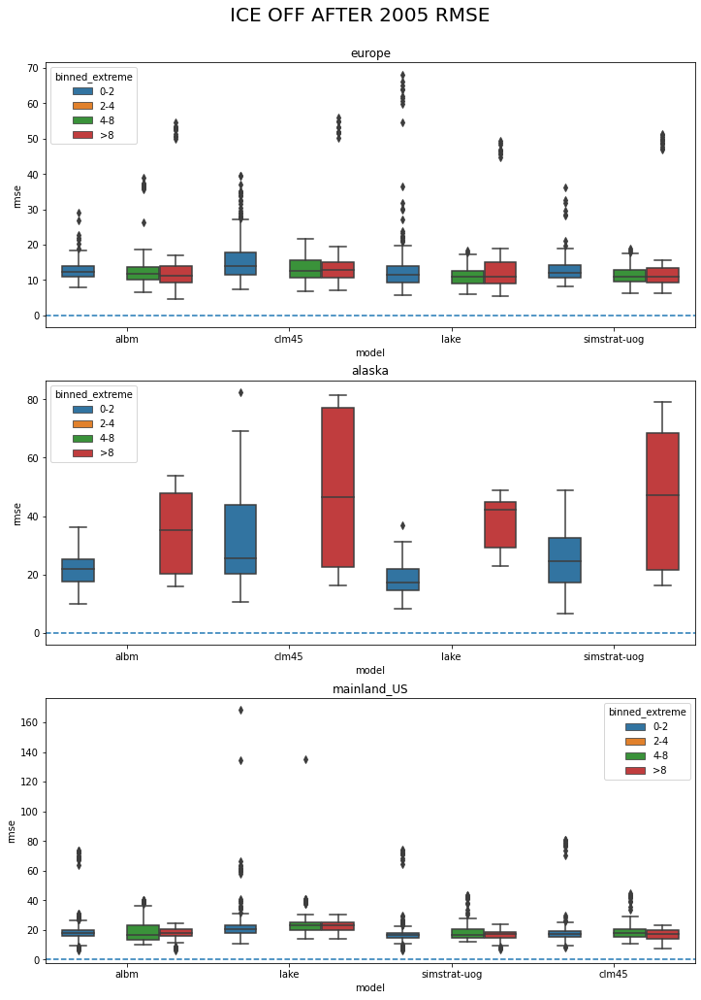

In [89]:
fig, (ax1, ax2, ax3) = graph.subplots(3, 1, figsize= (12, 16))

for location, ax in zip(df_ice_off_slopes['location'].unique(), [ax1, ax2, ax3]):

    temp_ice_off_df = df_ice_off_slopes.loc[df_ice_off_slopes['location'] == location]
    
    ax.set_title(f'{location}')
    sns.boxplot(y='rmse', x='model', hue='binned_extreme', data=temp_ice_off_df, whis=1.5, ax=ax)
    ax.axhline(0, linestyle='--')

fig.suptitle('ICE OFF AFTER 2005 RMSE', fontsize=20)
fig.subplots_adjust(top=0.93)
# fig.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/ice_off_locations_slope_diff_boxplots_after_2005.png', 
#             bbox_inches = 'tight')
fig.show()

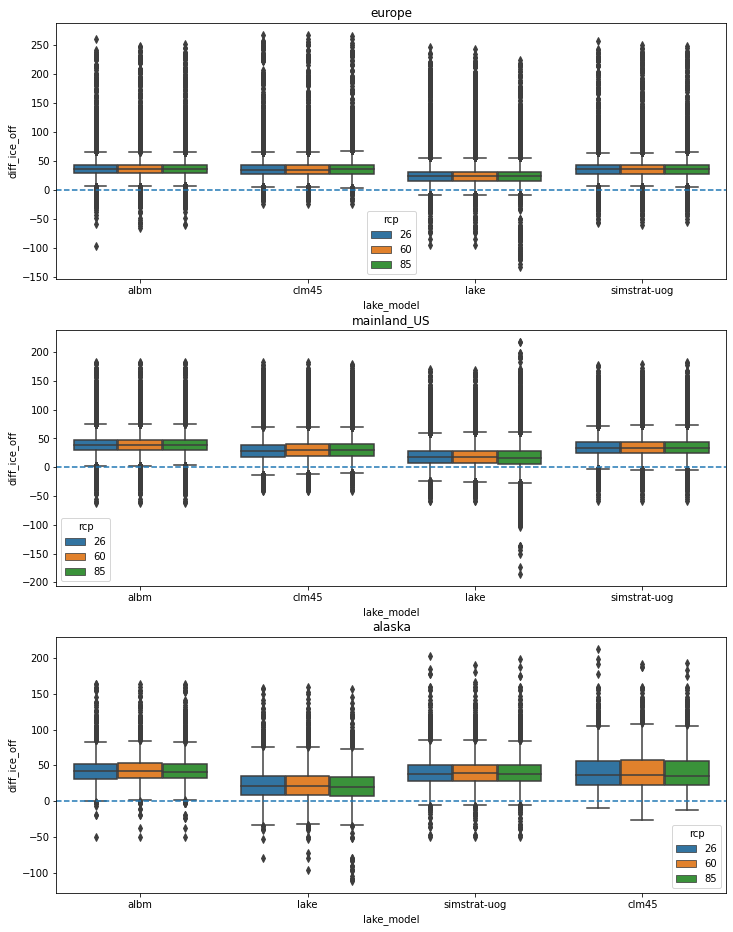

In [82]:
fig, (ax1, ax2, ax3) = graph.subplots(3, 1, figsize= (12, 16))

for location, ax in zip(df['location'].unique(), [ax1, ax2, ax3]):

    temp_df = df.loc[df['location'] == location]
    
    ax.set_title(f'{location}')
    sns.boxplot(y='diff_ice_off', x='lake_model', hue='rcp', data=temp_df, whis=1.5, ax=ax)
    ax.axhline(0, linestyle='--')

fig.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/ice_off_locations_raw_diff_boxplots.png', 
            bbox_inches = 'tight')
fig.show()

In [21]:
for df in [df_ice_on_slopes, df_ice_off_slopes]:
    df['lat'] = df['lat_long'].str.split('_').str.get(0).astype(float)
    df['lon'] = df['lat_long'].str.split('_').str.get(1).astype(float)
    df['mean_diff'] = df['mean_model'] - df['mean_in_situ']
    df['slope_diff'] = df['slope_model'] - df['slope_in_situ']

In [25]:
df_ice_on_slopes_depth = df_ice_on_slopes.merge(isimip_depth_area)
df_ice_off_slopes_depth = df_ice_off_slopes.merge(isimip_depth_area)

display(df_ice_off_slopes_depth.head(), df_ice_on_slopes_depth.head())

df_ice_off_slopes_depth.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_depth_area_oct_07_after_2005.csv', 
                               index=False)
df_ice_on_slopes_depth.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_depth_area_oct_07_after_2005.csv', 
                               index=False)

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,mean_in_situ,slope_in_situ,perc_extreme,lon,location,slope_diff,mean_diff,lat,model_avg_area,model_depth
0,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,...,163.285714,-0.246154,0.0,20.75,europe,-0.50989,0.571429,69.75,10.625994,10.000000
1,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,...,163.285714,-0.246154,0.0,20.75,europe,-0.50989,0.571429,69.25,4.355806,10.886524
2,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,...,163.285714,-0.246154,0.0,20.75,europe,-0.50989,0.571429,68.75,4.436429,10.170097
3,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,...,163.285714,-0.246154,0.0,20.75,europe,-0.50989,0.571429,68.25,6.356070,9.571223
4,69.25_20.75,14,ice_off,albm_gfdl-esm2m,163.857143,-0.756044,10.184021,26,albm,14,...,163.285714,-0.246154,0.0,20.75,europe,-0.50989,0.571429,67.75,10.235497,10.207747


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,cov_model,rmse,rcp,perc_outside_range_models,...,mean_in_situ,slope_in_situ,perc_extreme,lon,location,slope_diff,mean_diff,lat,model_avg_area,model_depth
0,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.20626,26,1.0,...,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.5,69.75,10.625994,10.000000
1,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.20626,26,1.0,...,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.5,69.25,4.355806,10.886524
2,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.20626,26,1.0,...,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.5,68.75,4.436429,10.170097
3,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.20626,26,1.0,...,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.5,68.25,6.356070,9.571223
4,69.25_20.75,14,ice_on,albm_gfdl-esm2m,-55.642857,1.026374,-0.153642,16.20626,26,1.0,...,-44.142857,0.628571,0.071429,20.75,europe,0.397802,-11.5,67.75,10.235497,10.207747


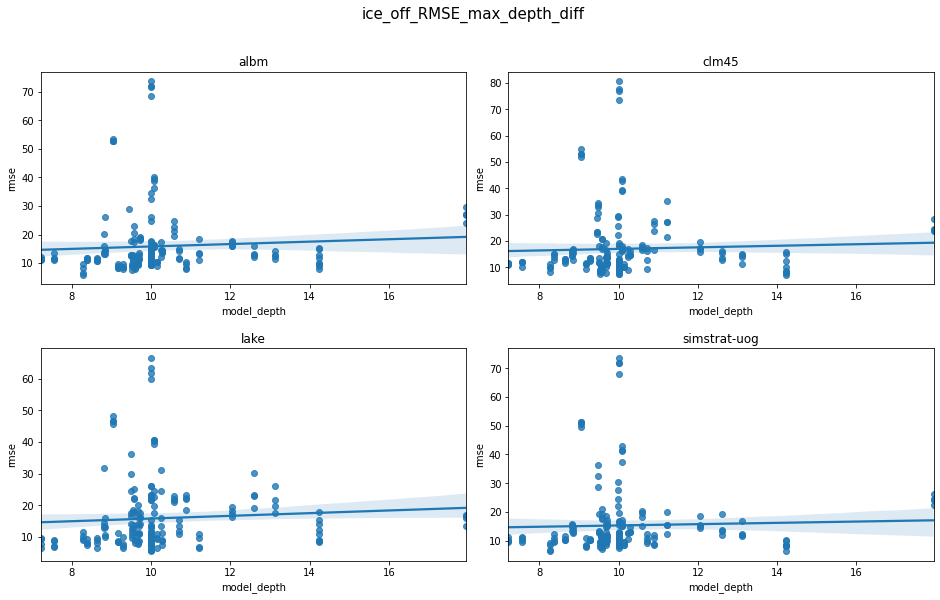

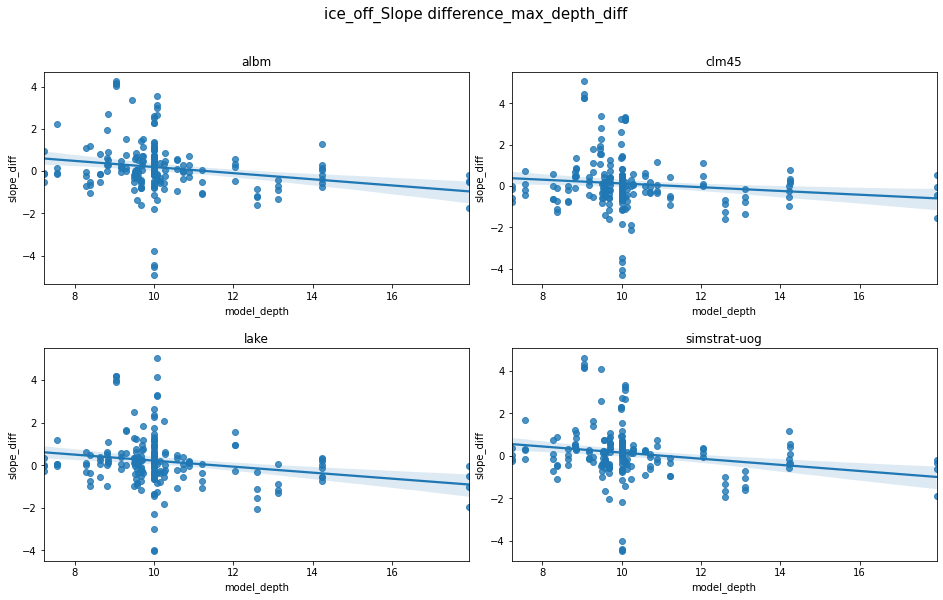

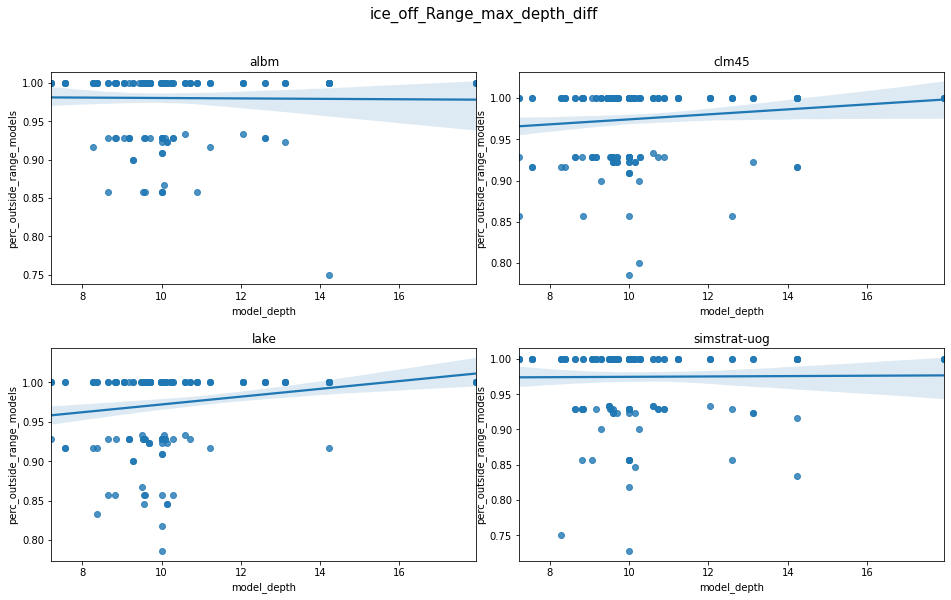

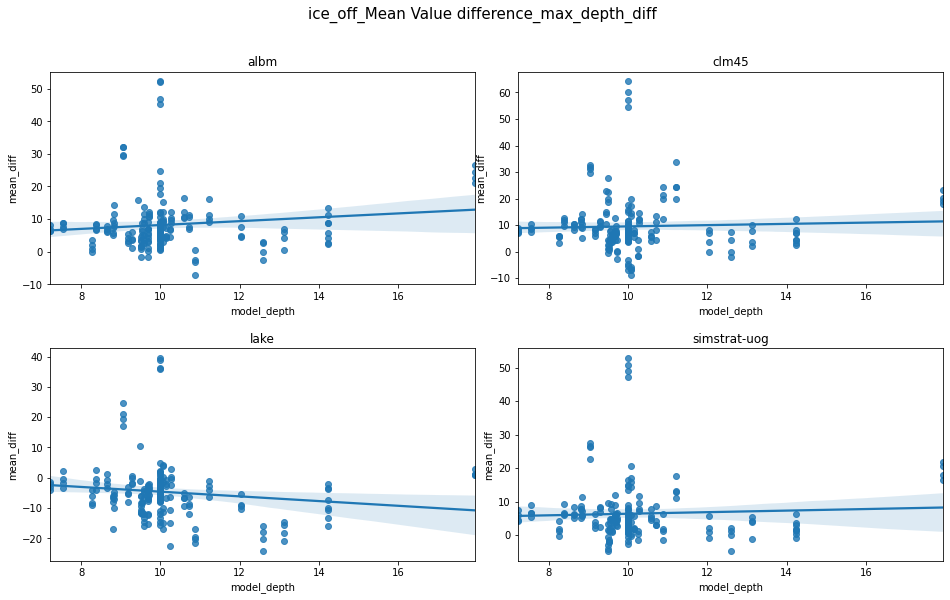

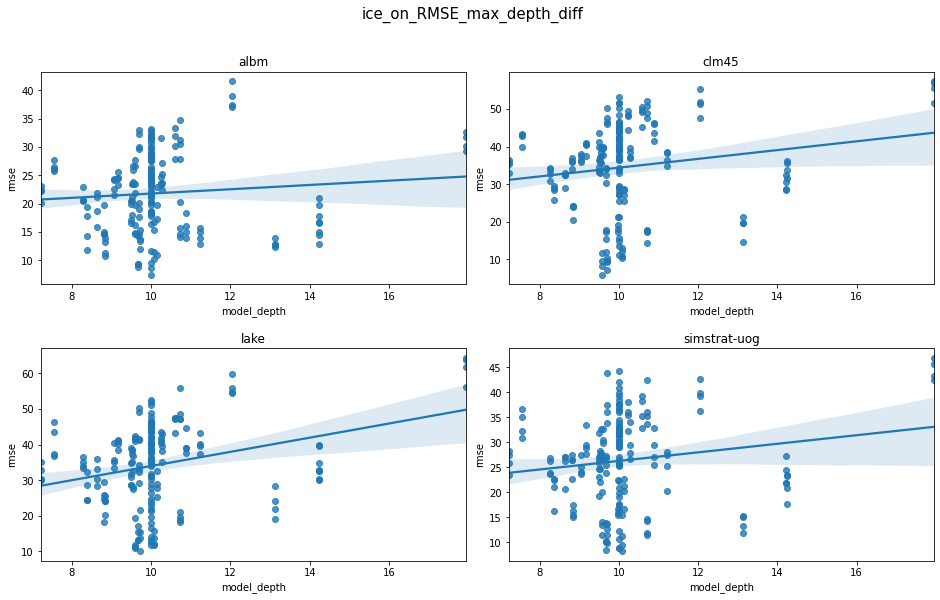

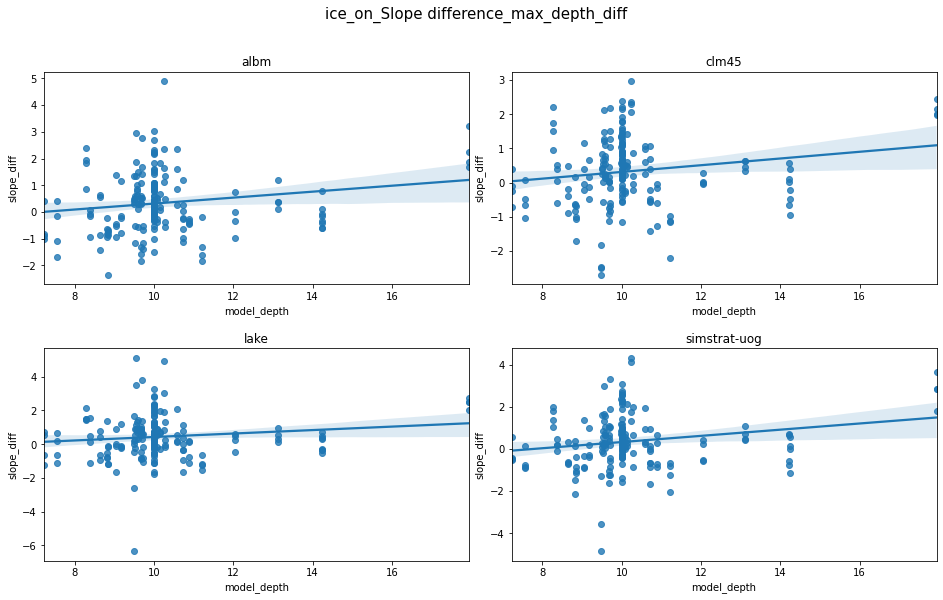

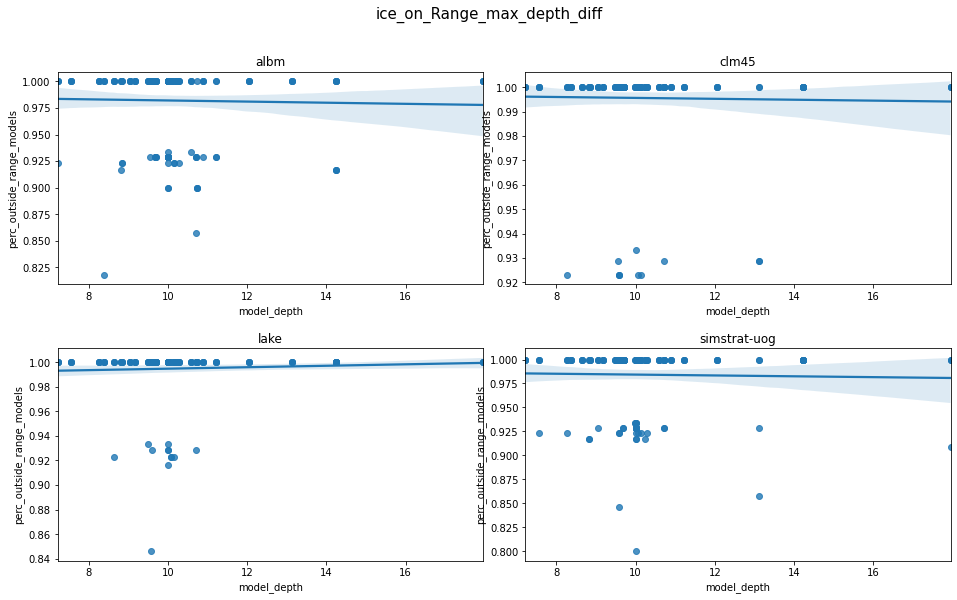

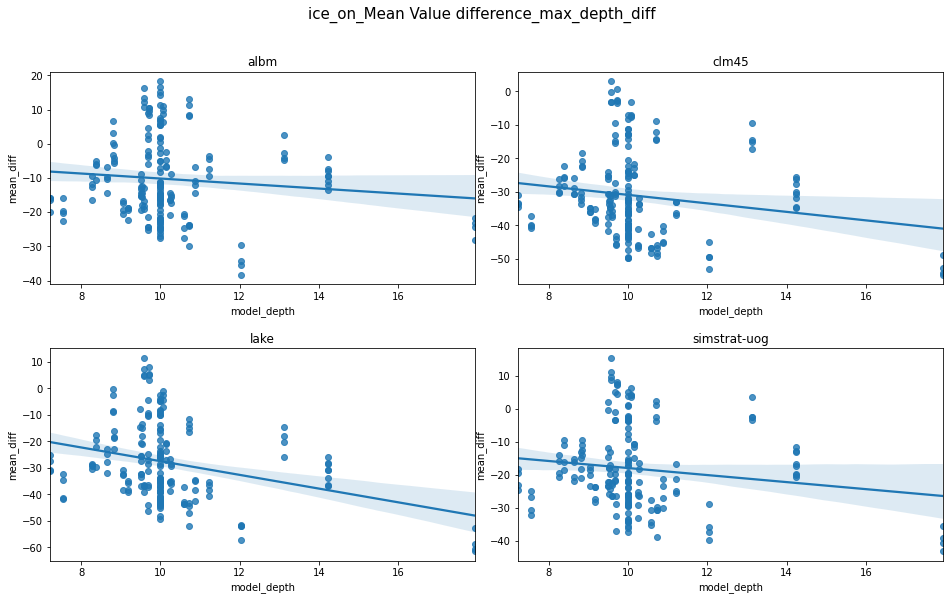

In [223]:
for df, variable in zip([df_ice_off_slopes_depth, df_ice_on_slopes_depth], ['ice_off', 'ice_on']):
    
    for metric, title_text in zip(['rmse', 'slope_diff', 'perc_outside_range_models', 'mean_diff'], 
                                  ['RMSE', 'Slope difference', 'Range', 'Mean Value difference']):
        
        fig, axs = graph.subplots(2,2, figsize=(16, 9))
        fig.subplots_adjust(hspace = 0.3, wspace = 0.1)
        axs = axs.ravel()
        
        for i, model in enumerate(df_ice_off_slopes_depth['model'].unique()):
            
            temp_df = df.loc[(df['model'] == model) & 
                            (df['rcp'] == 60) &
                                                  (df['model_depth'] < 50)]
            axs[i].set_title(model)
            sns.regplot(temp_df['model_depth'], 
                        temp_df[metric], ax=axs[i])
        fig.suptitle(f'{variable}_{title_text}_max_depth_diff', fontsize=15)
        fig.savefig(f'/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/Depth/{variable}_{title_text}_max_depth.png', 
                    bbox_inches='tight')

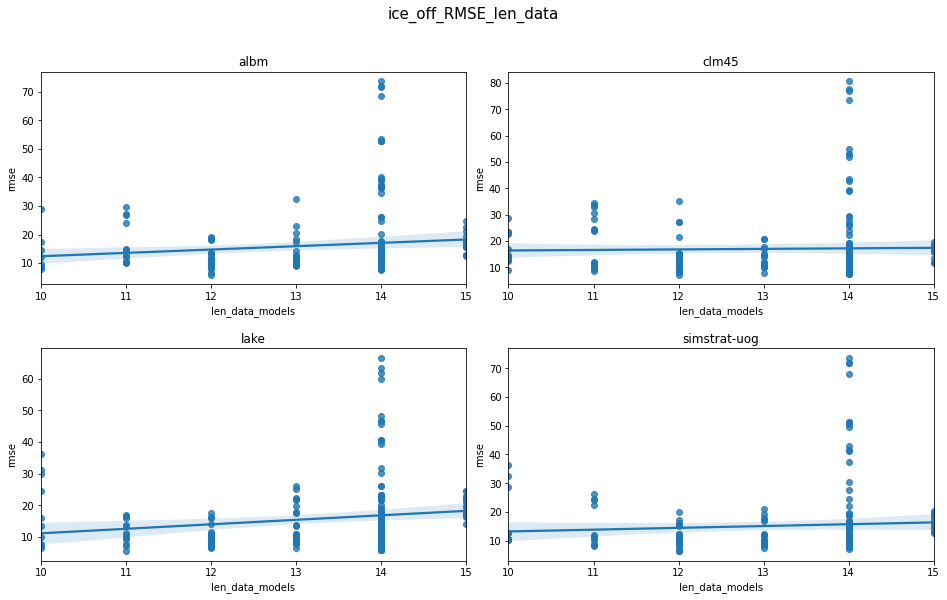

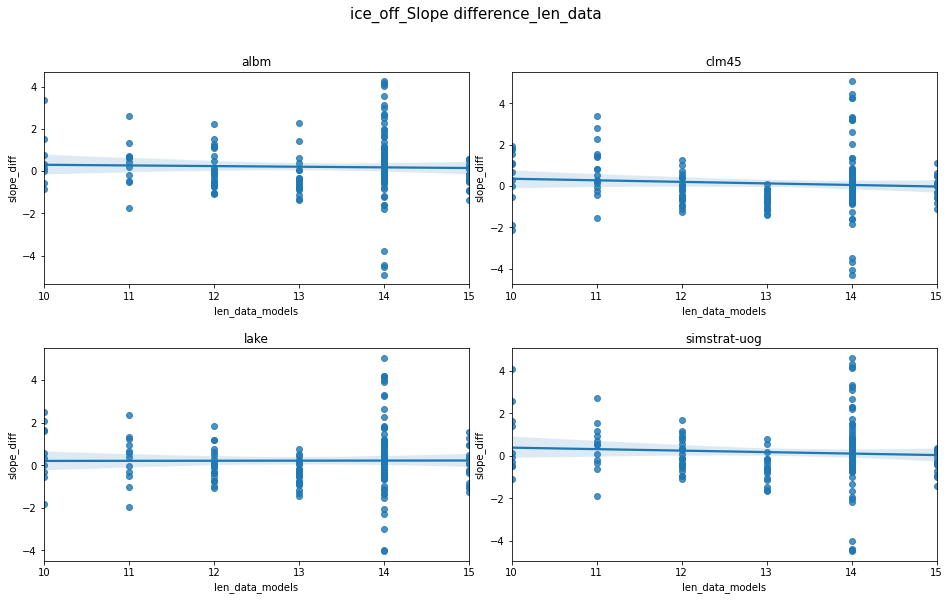

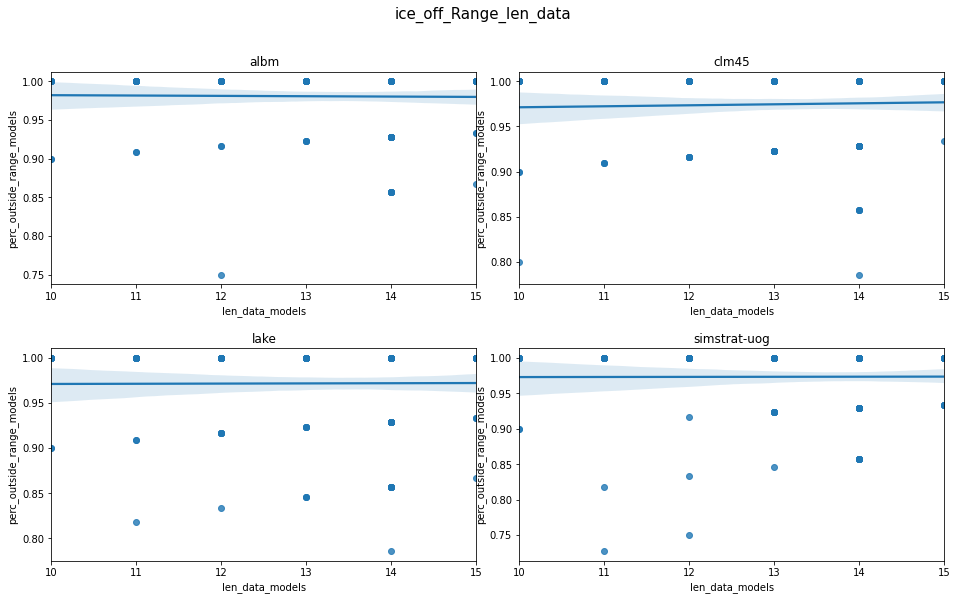

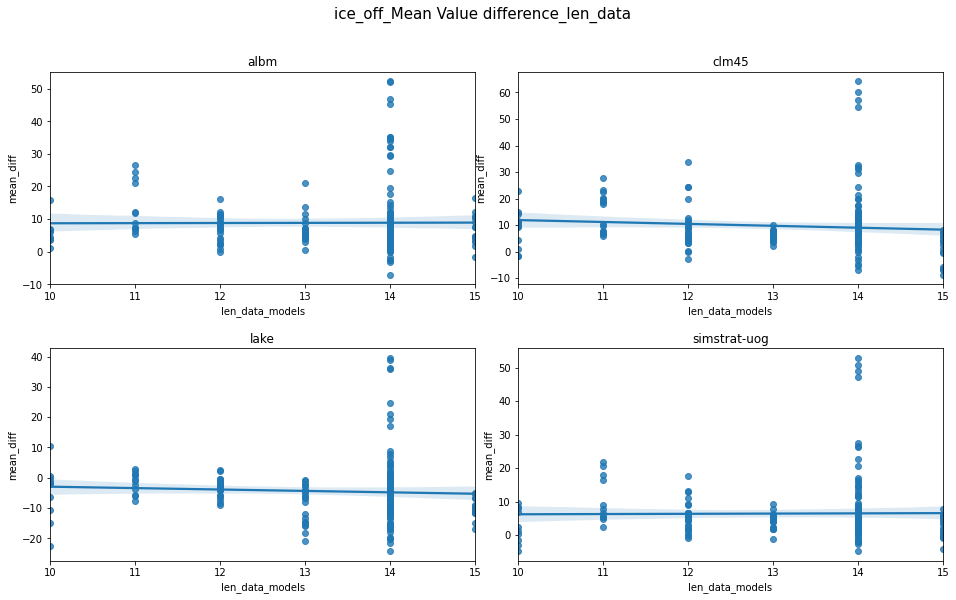

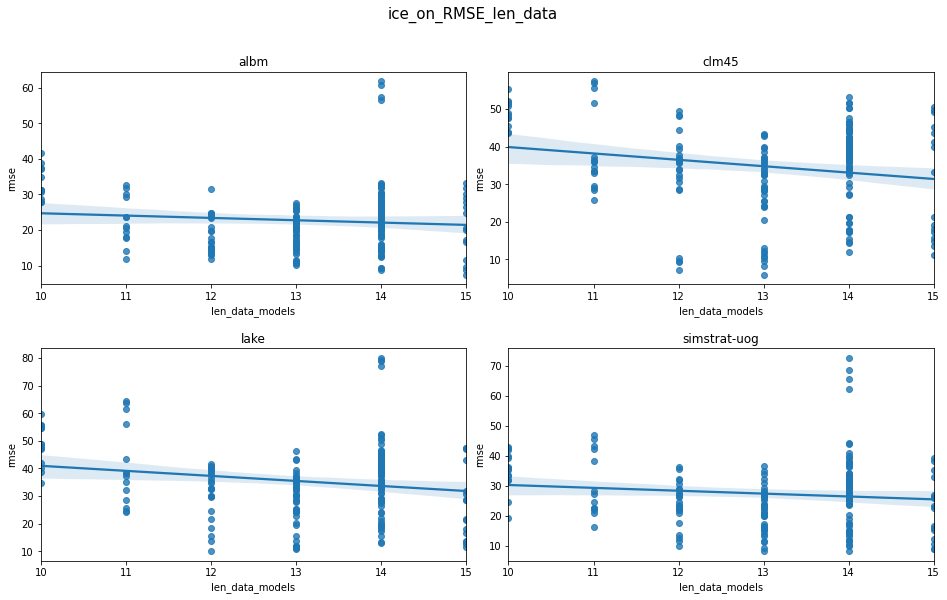

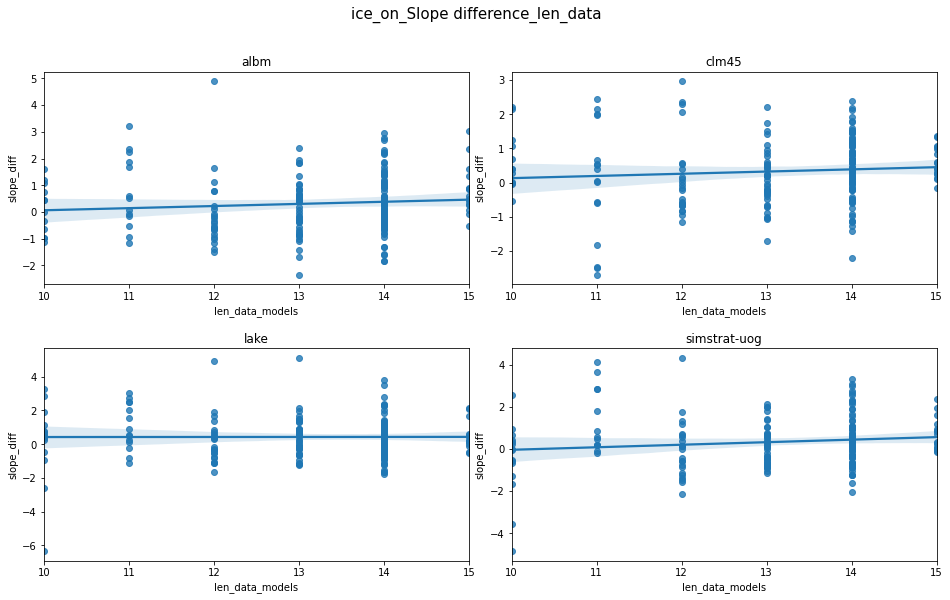

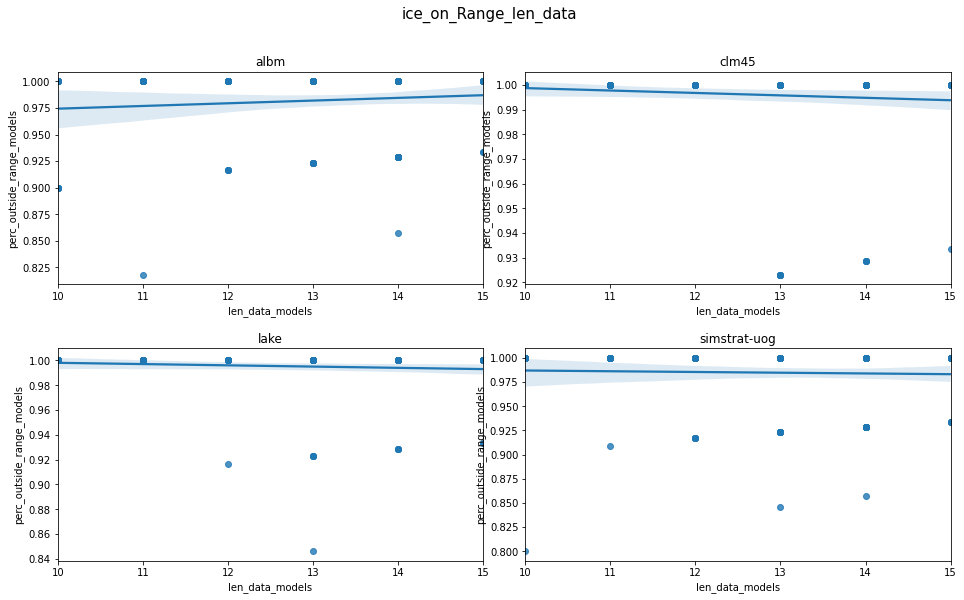

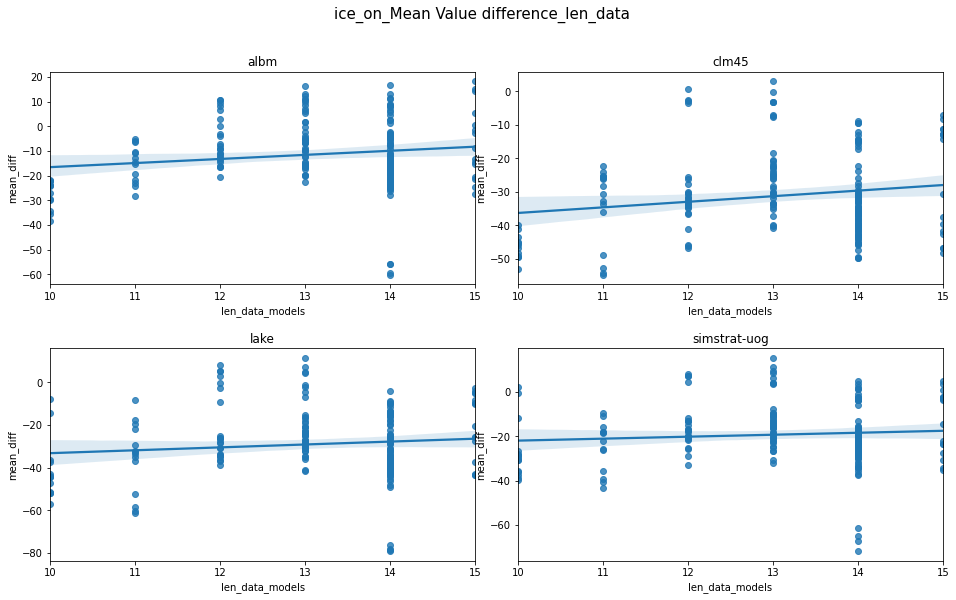

In [225]:
for df, variable in zip([df_ice_off_slopes_depth, df_ice_on_slopes_depth], ['ice_off', 'ice_on']):
    
    for metric, title_text in zip(['rmse', 'slope_diff', 'perc_outside_range_models', 'mean_diff'], 
                                  ['RMSE', 'Slope difference', 'Range', 'Mean Value difference']):
        
        fig, axs = graph.subplots(2,2, figsize=(16, 9))
        fig.subplots_adjust(hspace = 0.3, wspace = 0.1)
        axs = axs.ravel()
        
        for i, model in enumerate(df_ice_off_slopes_depth['model'].unique()):
            
            temp_df = df.loc[(df['model'] == model) & 
                            (df['rcp'] == 60)]
            axs[i].set_title(model)
            sns.regplot(temp_df['len_data_models'], 
                        temp_df[metric], ax=axs[i])
        fig.suptitle(f'{variable}_{title_text}_len_data', fontsize=15)
        fig.savefig(f'/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/Depth/{variable}_{title_text}_len_datah.png', 
                    bbox_inches='tight')

# Worldwide time series graph

In [99]:
%%time
df = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/merged_kev_iestyn_jul_28_2021.csv')
print(len(df))
df['lake_model'] = df['model'].str.split('_').str.get(0)
df.dropna(subset=['diff_ice_on', 'diff_ice_off'], how='all', inplace=True)
print(len(df))
display(df)

1954156
1944496


,Unnamed: 0,lat,lon,icestart,years,rcp,model,lat_long,grouped_icestart,iceend,...,latitude,longitude,ice_on_doy,ice_off_doy,grouped_ice_on,grouped_ice_off,diff_ice_on,diff_ice_off,ice_end_converted,lake_model
0,0,74.75,101.25,0.0,1959.0,26,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,...,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0,albm
1,1,74.75,101.25,0.0,1959.0,60,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,...,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0,albm
2,2,74.75,101.25,0.0,1959.0,85,albm_gfdl-esm2m,74.75_101.25,-91.0,315.0,...,74.75,101.25,NaN,166.0,NaN,166.0,NaN,28.0,194.0,albm
3,3,74.75,101.25,-1.0,1959.0,26,albm_hadgem2-es,74.75_101.25,-92.0,338.0,...,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0,albm
4,4,74.75,101.25,-1.0,1959.0,60,albm_hadgem2-es,74.75_101.25,-92.0,338.0,...,74.75,101.25,NaN,166.0,NaN,166.0,NaN,51.0,217.0,albm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1954151,1954151,53.75,23.25,36.0,1963.0,26,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,...,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0,lake
1954152,1954152,53.75,23.25,36.0,1963.0,60,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,...,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0,lake
1954153,1954153,53.75,23.25,36.0,1963.0,85,lake_ipsl-cm5a-lr,53.75_23.25,-55.0,213.0,...,53.75,23.25,-17.0,108.0,-17.0,108.0,-38.0,-16.0,92.0,lake
1954154,1954154,53.75,23.25,70.0,1963.0,26,lake_miroc5,53.75_23.25,-21.0,217.0,...,53.75,23.25,-17.0,108.0,-17.0,108.0,-4.0,-12.0,96.0,lake


CPU times: user 9.78 s, sys: 15.9 s, total: 25.7 s
Wall time: 28.9 s


In [130]:
df = df[['lat', 'lon', 'lat_long', 'years', 'rcp', 'grouped_icestart', 'grouped_iceend', 'lake_model']]
df.drop_duplicates(inplace=True)
df

,lat,lon,lat_long,years,rcp,grouped_icestart,grouped_iceend,lake_model
0,74.75,101.25,74.75_101.25,1959.0,26,-91.0,194.0,albm
1,74.75,101.25,74.75_101.25,1959.0,60,-91.0,194.0,albm
2,74.75,101.25,74.75_101.25,1959.0,85,-91.0,194.0,albm
3,74.75,101.25,74.75_101.25,1959.0,26,-92.0,217.0,albm
4,74.75,101.25,74.75_101.25,1959.0,60,-92.0,217.0,albm
...,...,...,...,...,...,...,...,...
1954151,53.75,23.25,53.75_23.25,1963.0,26,-55.0,92.0,lake
1954152,53.75,23.25,53.75_23.25,1963.0,60,-55.0,92.0,lake
1954153,53.75,23.25,53.75_23.25,1963.0,85,-55.0,92.0,lake
1954154,53.75,23.25,53.75_23.25,1963.0,26,-21.0,96.0,lake


In [101]:
df['years'].min()

1901.0

In [139]:
df_pixel_average = df.loc[df['years'] < 1931]

print(df_pixel_average['years'].min(), df_pixel_average['years'].max())

df_pixel_average['mean_icestart'] = df_pixel_average.groupby('lat_long')[['grouped_icestart']].transform('mean')
df_pixel_average['mean_iceend'] = df_pixel_average.groupby('lat_long')[['grouped_iceend']].transform('mean')

df_pixel_average.drop(columns=['years', 'grouped_icestart', 'grouped_iceend'], inplace=True)
df_pixel_average.drop_duplicates(inplace=True)

df_pixel_average

1901.0 1930.0


,lat,lon,lat_long,rcp,lake_model,mean_icestart,mean_iceend
15424,69.25,28.25,69.25_28.25,26,albm,-68.669118,156.318519
15425,69.25,28.25,69.25_28.25,60,albm,-68.669118,156.318519
15426,69.25,28.25,69.25_28.25,85,albm,-68.669118,156.318519
15436,69.25,28.25,69.25_28.25,26,clm45,-68.669118,156.318519
15437,69.25,28.25,69.25_28.25,60,clm45,-68.669118,156.318519
...,...,...,...,...,...,...,...
1951214,42.75,-74.75,42.75_-74.75,60,lake,-29.731707,87.265244
1951215,42.75,-74.75,42.75_-74.75,85,lake,-29.731707,87.265244
1952468,42.25,-85.25,42.25_-85.25,26,lake,-15.787879,78.242424
1952469,42.25,-85.25,42.25_-85.25,60,lake,-15.787879,78.242424


In [140]:
df_merged_means = pd.merge(df, df_pixel_average, how='left')
df_merged_means

,lat,lon,lat_long,years,rcp,grouped_icestart,grouped_iceend,lake_model,mean_icestart,mean_iceend
0,74.75,101.25,74.75_101.25,1959.0,26,-91.0,194.0,albm,NaN,NaN
1,74.75,101.25,74.75_101.25,1959.0,60,-91.0,194.0,albm,NaN,NaN
2,74.75,101.25,74.75_101.25,1959.0,85,-91.0,194.0,albm,NaN,NaN
3,74.75,101.25,74.75_101.25,1959.0,26,-92.0,217.0,albm,NaN,NaN
4,74.75,101.25,74.75_101.25,1959.0,60,-92.0,217.0,albm,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
1044663,53.75,23.25,53.75_23.25,1963.0,26,-55.0,92.0,lake,-29.909091,98.344498
1044664,53.75,23.25,53.75_23.25,1963.0,60,-55.0,92.0,lake,-29.909091,98.344498
1044665,53.75,23.25,53.75_23.25,1963.0,85,-55.0,92.0,lake,-29.909091,98.344498
1044666,53.75,23.25,53.75_23.25,1963.0,26,-21.0,96.0,lake,-29.909091,98.344498


In [142]:
df_merged_means['diff_icestart'] = df_merged_means['grouped_icestart'] - df_merged_means['mean_icestart']
df_merged_means['diff_iceend'] = df_merged_means['grouped_iceend'] - df_merged_means['mean_iceend']
df_merged_means.dropna(subset=['diff_icestart', 'diff_iceend'], inplace=True)

df_merged_means_before_2005 = df_merged_means.loc[df_merged_means['years'] <= 2005]
df_merged_means_before_2005.drop(columns = ['rcp'], inplace=True)
df_merged_means_before_2005.drop_duplicates(inplace=True)

df_merged_means_after_2005 = df_merged_means.loc[df_merged_means['years'] > 2004]

display(df_merged_means_before_2005)
display(df_merged_means_after_2005)

,lat,lon,lat_long,years,grouped_icestart,grouped_iceend,lake_model,mean_icestart,mean_iceend,diff_icestart,diff_iceend
15294,69.25,28.25,69.25_28.25,1925.0,-61.0,162.0,albm,-68.669118,156.318519,7.669118,5.681481
15297,69.25,28.25,69.25_28.25,1925.0,-62.0,166.0,albm,-68.669118,156.318519,6.669118,9.681481
15300,69.25,28.25,69.25_28.25,1925.0,-57.0,168.0,albm,-68.669118,156.318519,11.669118,11.681481
15303,69.25,28.25,69.25_28.25,1925.0,-72.0,158.0,clm45,-68.669118,156.318519,-3.330882,1.681481
15306,69.25,28.25,69.25_28.25,1925.0,-70.0,160.0,clm45,-68.669118,156.318519,-1.330882,3.681481
...,...,...,...,...,...,...,...,...,...,...,...
1044527,42.25,-85.25,42.25_-85.25,2005.0,5.0,85.0,lake,-15.787879,78.242424,20.787879,6.757576
1044530,42.25,-85.25,42.25_-85.25,2005.0,-34.0,61.0,lake,-15.787879,78.242424,-18.212121,-17.242424
1044660,53.75,23.25,53.75_23.25,1963.0,-25.0,96.0,lake,-29.909091,98.344498,4.909091,-2.344498
1044663,53.75,23.25,53.75_23.25,1963.0,-55.0,92.0,lake,-29.909091,98.344498,-25.090909,-6.344498


,lat,lon,lat_long,years,rcp,grouped_icestart,grouped_iceend,lake_model,mean_icestart,mean_iceend,diff_icestart,diff_iceend
43353,67.75,20.75,67.75_20.75,2005.0,26,-61.0,157.0,albm,-73.031451,154.988313,12.031451,2.011687
43354,67.75,20.75,67.75_20.75,2005.0,60,-61.0,157.0,albm,-73.031451,154.988313,12.031451,2.011687
43355,67.75,20.75,67.75_20.75,2005.0,85,-61.0,157.0,albm,-73.031451,154.988313,12.031451,2.011687
43356,67.75,20.75,67.75_20.75,2005.0,26,-56.0,144.0,albm,-73.031451,154.988313,17.031451,-10.988313
43357,67.75,20.75,67.75_20.75,2005.0,60,-56.0,144.0,albm,-73.031451,154.988313,17.031451,-10.988313
...,...,...,...,...,...,...,...,...,...,...,...,...
1044655,42.25,-85.25,42.25_-85.25,2018.0,85,-11.0,10.0,lake,-15.787879,78.242424,4.787879,-68.242424
1044656,42.25,-85.25,42.25_-85.25,2018.0,26,-18.0,89.0,lake,-15.787879,78.242424,-2.212121,10.757576
1044657,42.25,-85.25,42.25_-85.25,2018.0,60,-2.0,49.0,lake,-15.787879,78.242424,13.787879,-29.242424
1044658,42.25,-85.25,42.25_-85.25,2018.0,85,24.0,60.0,lake,-15.787879,78.242424,39.787879,-18.242424


In [143]:
df_albm_means_before = df_merged_means_before_2005.loc[df_merged_means_before_2005['lake_model'] == 'albm']
df_albm_means_after = df_merged_means_after_2005.loc[df_merged_means_after_2005['lake_model'] == 'albm']
df_albm_means_before

,lat,lon,lat_long,years,grouped_icestart,grouped_iceend,lake_model,mean_icestart,mean_iceend,diff_icestart,diff_iceend
15294,69.25,28.25,69.25_28.25,1925.0,-61.0,162.0,albm,-68.669118,156.318519,7.669118,5.681481
15297,69.25,28.25,69.25_28.25,1925.0,-62.0,166.0,albm,-68.669118,156.318519,6.669118,9.681481
15300,69.25,28.25,69.25_28.25,1925.0,-57.0,168.0,albm,-68.669118,156.318519,11.669118,11.681481
15337,69.25,28.25,69.25_28.25,1926.0,-62.0,157.0,albm,-68.669118,156.318519,6.669118,0.681481
15340,69.25,28.25,69.25_28.25,1926.0,-71.0,171.0,albm,-68.669118,156.318519,-2.330882,14.681481
...,...,...,...,...,...,...,...,...,...,...,...
1037406,43.75,-79.25,43.75_-79.25,1973.0,38.0,115.0,albm,0.212454,97.852684,37.787546,17.147316
1037409,43.75,-79.25,43.75_-79.25,1973.0,40.0,92.0,albm,0.212454,97.852684,39.787546,-5.852684
1037412,43.75,-79.25,43.75_-79.25,1973.0,22.0,101.0,albm,0.212454,97.852684,21.787546,3.147316
1037935,43.75,-79.25,43.75_-79.25,1976.0,34.0,107.0,albm,0.212454,97.852684,33.787546,9.147316


In [144]:
df_albm_before_avg = df_albm_means_before.groupby('years').mean().reset_index()
df_albm_before_avg.drop_duplicates(inplace=True)
df_albm_after_avg = df_albm_means_after.groupby(['years', 'rcp']).mean().reset_index()
df_albm_after_avg.drop_duplicates(inplace=True)
df_albm_after_avg

,years,rcp,lat,lon,grouped_icestart,grouped_iceend,mean_icestart,mean_iceend,diff_icestart,diff_iceend
0,2005.0,26,52.403941,-34.105911,-21.177340,116.541872,-38.523608,118.239301,17.346268,-1.697430
1,2005.0,60,52.403941,-34.105911,-21.177340,116.541872,-38.523608,118.239301,17.346268,-1.697430
2,2005.0,85,52.403941,-34.105911,-21.177340,116.541872,-38.523608,118.239301,17.346268,-1.697430
3,2006.0,26,52.568302,-34.987401,-23.859416,114.885942,-39.461580,119.211821,15.602164,-4.325880
4,2006.0,60,52.541005,-35.108466,-23.748677,116.462963,-39.389713,119.139693,15.641035,-2.676730
5,2006.0,85,52.502632,-35.355263,-23.784211,121.057895,-39.343933,119.087313,15.559722,1.970582
6,2007.0,26,52.706000,-33.024667,-21.904000,116.970667,-39.478461,119.258839,17.574461,-2.288172
7,2007.0,60,52.613158,-33.144737,-21.365789,119.123684,-39.200778,118.981870,17.834989,0.141814
8,2007.0,85,52.632586,-33.044195,-22.319261,118.794195,-39.215225,118.988092,16.895964,-0.193897
9,2008.0,26,52.758499,-32.635269,-24.541076,121.167139,-39.166352,118.993257,14.625276,2.173882


In [132]:
df.head()

,lat,lon,lat_long,years,rcp,grouped_icestart,grouped_iceend,lake_model
0,74.75,101.25,74.75_101.25,1959.0,26,-91.0,194.0,albm
1,74.75,101.25,74.75_101.25,1959.0,60,-91.0,194.0,albm
2,74.75,101.25,74.75_101.25,1959.0,85,-91.0,194.0,albm
3,74.75,101.25,74.75_101.25,1959.0,26,-92.0,217.0,albm
4,74.75,101.25,74.75_101.25,1959.0,60,-92.0,217.0,albm


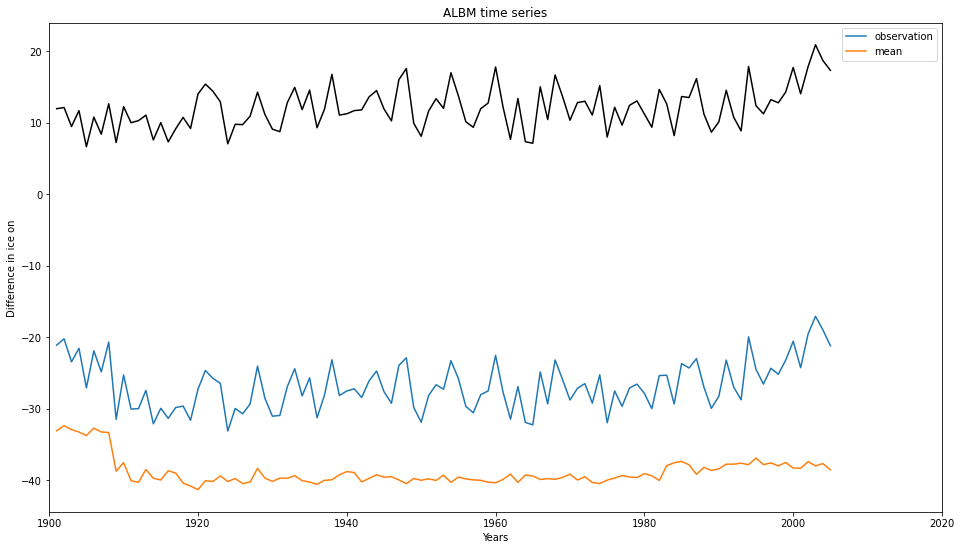

In [147]:
size = 1
alpha = 0.05

graph.figure(figsize=(16, 9))
graph.title('ALBM time series')


graph.plot(df_albm_before_avg['years'], df_albm_before_avg['diff_icestart'], color='black')
graph.plot(df_albm_before_avg['years'], df_albm_before_avg['grouped_icestart'], label='observation')
graph.plot(df_albm_before_avg['years'], df_albm_before_avg['mean_icestart'], label='mean')


graph.legend(loc='upper right')
graph.xlim(1900, 2020)
# graph.ylim(-35, 80)
graph.xlabel('Years')
graph.ylabel('Difference in ice on')
graph.legend()
graph.show()

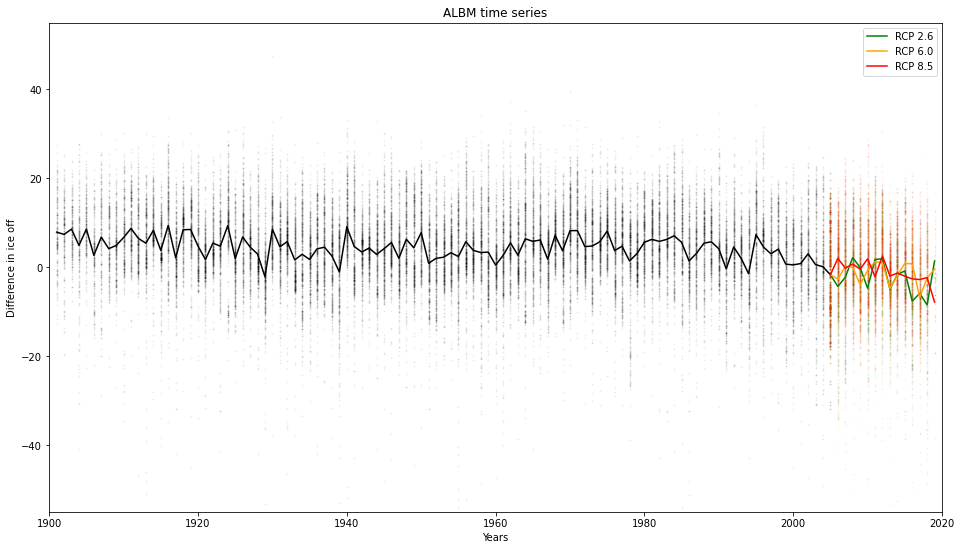

In [116]:
size = 1
alpha = 0.05

graph.figure(figsize=(16, 9))
graph.title('ALBM time series')
graph.scatter(df_albm_means_before['years'], df_albm_means_before['diff_iceend'], 
              s=size, alpha=alpha, color='black')
graph.scatter(df_albm_means_after.loc[df_albm_means_after['rcp'] == 26]['years'], 
              df_albm_means_after.loc[df_albm_means_after['rcp'] == 26]['diff_iceend'], 
              s=size, alpha=alpha, color='green')
graph.scatter(df_albm_means_after.loc[df_albm_means_after['rcp'] == 60]['years'], 
              df_albm_means_after.loc[df_albm_means_after['rcp'] == 60]['diff_iceend'], 
              s=size, alpha=alpha, color='orange')
graph.scatter(df_albm_means_after.loc[df_albm_means_after['rcp'] == 85]['years'], 
              df_albm_means_after.loc[df_albm_means_after['rcp'] == 85]['diff_iceend'], 
              s=size, alpha=alpha, color='red')

graph.plot(df_albm_before_avg['years'], df_albm_before_avg['diff_iceend'], color='black')
graph.plot(df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 26]['years'], 
           df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 26]['diff_iceend'], color='green', label='RCP 2.6')
graph.plot(df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 60]['years'], 
           df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 60]['diff_iceend'], color='orange', label='RCP 6.0')
graph.plot(df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 85]['years'], 
           df_albm_after_avg.loc[df_albm_after_avg['rcp'] == 85]['diff_iceend'], color='red', label='RCP 8.5')

graph.legend(loc='upper right')
graph.xlim(1900, 2020)
graph.ylim(-55, 55)
graph.xlabel('Years')
graph.ylabel('Difference in ice off')
graph.show()

In [ ]:
# Standard deviation as error bar
# Include lake models in the error bars

In [2]:
df_ice_off_slopes_depth = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_off_slopes_depth_area_sep_23.csv')
df_ice_on_slopes_depth = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Analysis/ice_on_slopes_depth_area_sep_23.csv')

df_ice_off_slopes_depth = df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['rcp'] == 60]
df_ice_on_slopes_depth = df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['rcp'] == 60]

df_ice_on_slopes_depth.head()

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,end_year,mean_in_situ,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth
1,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,60,albm,26,...,1985.0,-87.653846,0.234872,0.076923,74.75,101.25,-3.769231,-0.209915,105.696793,7.434675
4,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,60,albm,26,...,1985.0,-87.653846,0.234872,0.076923,74.75,101.25,-4.000000,-0.234530,105.696793,7.434675
7,74.75_101.25,26,ice_on,albm_ipsl-cm5a-lr,-91.346154,-0.014017,8.987170,60,albm,26,...,1985.0,-87.653846,0.234872,0.076923,74.75,101.25,-3.692308,-0.248889,105.696793,7.434675
10,74.75_101.25,26,ice_on,albm_miroc5,-91.384615,-0.064957,9.104099,60,albm,26,...,1985.0,-87.653846,0.234872,0.076923,74.75,101.25,-3.730769,-0.299829,105.696793,7.434675
13,74.75_101.25,26,ice_on,clm45_gfdl-esm2m,-92.269231,-0.002393,9.207021,60,clm45,26,...,1985.0,-87.653846,0.234872,0.076923,74.75,101.25,-4.615385,-0.237265,105.696793,7.434675


In [3]:
bins = [-1, 50, 90, 150]
labels = ['0-50', '51-90', '>90']

df_concat_ice_on_ice_off_slopes['binned_years'] = pd.cut(df_concat_ice_on_ice_off_slopes['len_data_models'], 
                                                         bins, labels = labels)

for df in [df_ice_on_slopes_depth, df_ice_off_slopes_depth]:
    df['binned_years'] = pd.cut(df['len_data_models'], bins, labels = labels)

display(df_ice_on_slopes_depth)

NameError: name 'df_concat_ice_on_ice_off_slopes' is not defined

In [4]:
df_concat_ice_on_ice_off_slopes = pd.concat([df_ice_off_slopes_depth, df_ice_on_slopes_depth])

df_concat_ice_on_ice_off_slopes.rename(columns = {'rmse': 'RMSE', 'mean_diff': 'Mean Difference', 
                                                  'slope_diff': 'Trend Difference'}, 
                                       inplace=True)

df_concat_ice_on_ice_off_slopes.replace({'albm': 'ALBM', 'clm45': 'CLM45', 'lake': 'LAKE', 'simstrat-uog': 'SIMSTRAT'}, 
                                        inplace= True)

bins = [-1, 50, 90, 150]
labels = ['0-50', '51-90', '>90']

df_concat_ice_on_ice_off_slopes['binned_years'] = pd.cut(df_concat_ice_on_ice_off_slopes['len_data_models'], 
                                                         bins, labels = labels)

df_concat_ice_on_ice_off_slopes

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,RMSE,rcp,model,len_in_situ_data,...,mean_in_situ,slope_in_situ,perc_extreme,lat,lon,Mean Difference,Trend Difference,model_avg_area,model_depth,binned_years
1,74.75_101.25,27,ice_off,albm_gfdl-esm2m,205.000000,0.157509,24.430552,60,ALBM,27,...,182.148148,-0.026252,0.074074,74.75,101.25,22.851852,0.183761,105.696793,7.434675,0-50
4,74.75_101.25,27,ice_off,albm_hadgem2-es,214.074074,0.031746,34.895612,60,ALBM,27,...,182.148148,-0.026252,0.074074,74.75,101.25,31.925926,0.057998,105.696793,7.434675,0-50
7,74.75_101.25,27,ice_off,albm_ipsl-cm5a-lr,211.074074,-0.090965,31.785741,60,ALBM,27,...,182.148148,-0.026252,0.074074,74.75,101.25,28.925926,-0.064713,105.696793,7.434675,0-50
10,74.75_101.25,27,ice_off,albm_miroc5,213.740741,-0.113553,35.317082,60,ALBM,27,...,182.148148,-0.026252,0.074074,74.75,101.25,31.592593,-0.087302,105.696793,7.434675,0-50
13,74.75_101.25,27,ice_off,clm45_gfdl-esm2m,187.148148,-0.094017,11.493960,60,CLM45,27,...,182.148148,-0.026252,0.074074,74.75,101.25,5.000000,-0.067766,105.696793,7.434675,0-50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15669,41.25_-73.75,34,ice_on,lake_miroc5,-6.941176,0.492419,18.403165,60,LAKE,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,0.205882,0.192036,9.788189,9.750054,0-50
15671,41.25_-73.75,33,ice_on,simstrat-uog_gfdl-esm2m,9.636364,0.703251,23.842285,60,SIMSTRAT,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,16.783422,0.402868,9.788189,9.750054,0-50
15674,41.25_-73.75,29,ice_on,simstrat-uog_hadgem2-es,9.344828,0.087984,25.745438,60,SIMSTRAT,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,16.491886,-0.212399,9.788189,9.750054,0-50
15677,41.25_-73.75,31,ice_on,simstrat-uog_ipsl-cm5a-lr,8.806452,0.052755,25.204966,60,SIMSTRAT,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,15.953510,-0.247628,9.788189,9.750054,0-50


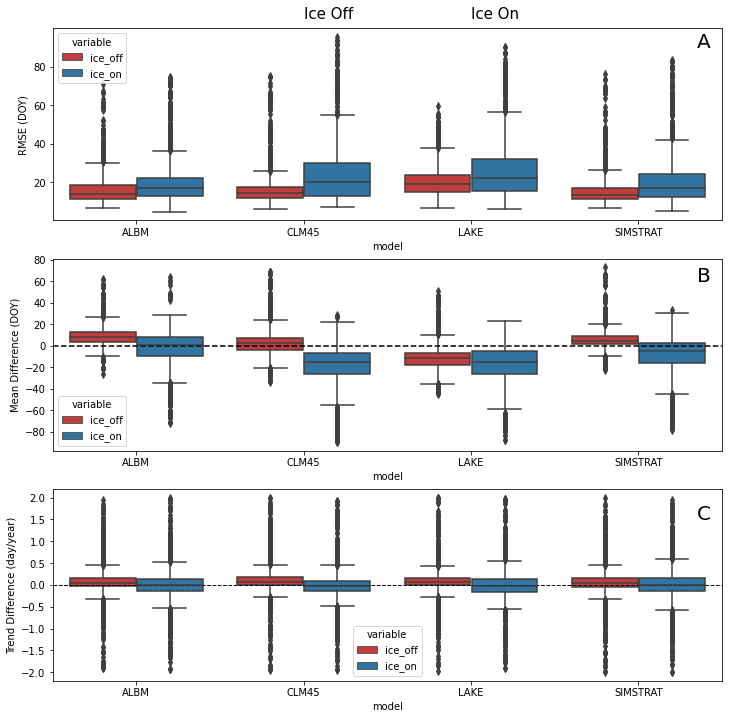

In [17]:
fig, (ax1, ax2, ax3) = graph.subplots(3, 1, figsize= (12, 12))

my_palette = {'ice_off': 'tab:red', 'ice_on': 'tab:blue'}
sns.boxplot(y = 'RMSE', x = 'model', hue='variable', 
            data=df_concat_ice_on_ice_off_slopes, ax=ax1, palette= my_palette).set(ylabel = 'RMSE (DOY)')

sns.boxplot(y = 'Mean Difference', x = 'model', hue='variable', 
            data=df_concat_ice_on_ice_off_slopes, ax=ax2, palette= my_palette).set(ylabel = 'Mean Difference (DOY)')

df_concat_slopes = df_concat_ice_on_ice_off_slopes.loc[(df_concat_ice_on_ice_off_slopes['Trend Difference'] < 2) & 
                                                       (df_concat_ice_on_ice_off_slopes['Trend Difference'] > -2)]
sns.boxplot(y = 'Trend Difference', x = 'model', hue='variable', 
            data=df_concat_slopes, ax=ax3, palette= my_palette).set(ylabel = 'Trend Difference (day/year)')

ax2.axhline(0, linewidth=1.5, linestyle='--', color = 'black')
ax3.axhline(0, linewidth=1, linestyle='--', color = 'black')

ax1.text(3.35, 90, 'A', fontsize=20)
ax2.text(3.35, 60, 'B', fontsize=20)
ax3.text(3.35, 1.5, 'C', fontsize=20)
ax1.text(1, 105, 'Ice Off', fontsize=15)
ax1.text(2, 105, 'Ice On', fontsize=15)

graph.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/boxplots_rmse_mean_trend.png', 
              bbox_inches='tight')
graph.show()

In [8]:
import statsmodels

In [11]:
print(df_ice_on_slopes_depth.columns)
display(df_ice_on_slopes_depth.head())
print(df_ice_on_slopes_depth['model'].unique())

Index(['lat_long', 'len_data_models', 'variable', 'lake_model', 'mean_model',
       'slope_model', 'rmse', 'rcp', 'model', 'len_in_situ_data', 'start_year',
       'end_year', 'mean_in_situ', 'slope_in_situ', 'perc_extreme', 'lat',
       'lon', 'mean_diff', 'slope_diff', 'model_avg_area', 'model_depth',
       'binned_years'],
      dtype='object')


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,mean_in_situ,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth,binned_years
1,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,60,albm,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.769231,-0.209915,105.696793,7.434675,21-40
4,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,60,albm,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-4.000000,-0.234530,105.696793,7.434675,21-40
7,74.75_101.25,26,ice_on,albm_ipsl-cm5a-lr,-91.346154,-0.014017,8.987170,60,albm,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.692308,-0.248889,105.696793,7.434675,21-40
10,74.75_101.25,26,ice_on,albm_miroc5,-91.384615,-0.064957,9.104099,60,albm,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.730769,-0.299829,105.696793,7.434675,21-40
13,74.75_101.25,26,ice_on,clm45_gfdl-esm2m,-92.269231,-0.002393,9.207021,60,clm45,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-4.615385,-0.237265,105.696793,7.434675,21-40


['albm' 'clm45' 'lake' 'simstrat-uog']


In [20]:
print('Parametric ANOVA')
print(stats.f_oneway(df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'albm']['rmse'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'clm45']['rmse'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'lake']['rmse'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'simstrat-uog']['rmse']))

print(stats.f_oneway(df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'albm']['mean_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'clm45']['mean_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'lake']['mean_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'simstrat-uog']['mean_diff']))

print(stats.f_oneway(df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'albm']['slope_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'clm45']['slope_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'lake']['slope_diff'], 
                     df_ice_on_slopes_depth.loc[df_ice_on_slopes_depth['model'] == 'simstrat-uog']['slope_diff']))

Parametric ANOVA
F_onewayResult(statistic=64.72044843065828, pvalue=4.2425113206799863e-41)
F_onewayResult(statistic=251.61710594370132, pvalue=1.0001332025136646e-152)
F_onewayResult(statistic=0.3025255075848686, pvalue=0.8235971500562025)


In [19]:
print('Parametric ANOVA')
print(stats.f_oneway(df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'albm']['rmse'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'clm45']['rmse'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'lake']['rmse'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'simstrat-uog']['rmse']))

print(stats.f_oneway(df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'albm']['mean_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'clm45']['mean_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'lake']['mean_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'simstrat-uog']['mean_diff']))

print(stats.f_oneway(df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'albm']['slope_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'clm45']['slope_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'lake']['slope_diff'], 
                     df_ice_off_slopes_depth.loc[df_ice_off_slopes_depth['model'] == 'simstrat-uog']['slope_diff']))

Parametric ANOVA
F_onewayResult(statistic=97.87410203430012, pvalue=6.421350044992798e-62)
F_onewayResult(statistic=1055.137119434524, pvalue=0.0)
F_onewayResult(statistic=1.597722660671348, pvalue=0.18769875226086585)


In [19]:
# bins = [-1, 50, 90, 150]
# labels = ['0-50', '51-90', '>90']

bins = [-1, 10, 20, 40, 80, 150]
labels = ['0-10', '11-20', '21-40', '41-80', '>80']

df_concat_ice_on_ice_off_slopes['binned_years'] = pd.cut(df_concat_ice_on_ice_off_slopes['len_data_models'], 
                                                         bins, labels = labels)

for df in [df_ice_on_slopes_depth, df_ice_off_slopes_depth]:
    df['binned_years'] = pd.cut(df['len_data_models'], bins, labels = labels)
    df['model'] = df['model'].str.upper()

display(df_ice_on_slopes_depth)

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,mean_in_situ,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth,binned_years
1,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,60,ALBM,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.769231,-0.209915,105.696793,7.434675,21-40
4,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,60,ALBM,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-4.000000,-0.234530,105.696793,7.434675,21-40
7,74.75_101.25,26,ice_on,albm_ipsl-cm5a-lr,-91.346154,-0.014017,8.987170,60,ALBM,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.692308,-0.248889,105.696793,7.434675,21-40
10,74.75_101.25,26,ice_on,albm_miroc5,-91.384615,-0.064957,9.104099,60,ALBM,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-3.730769,-0.299829,105.696793,7.434675,21-40
13,74.75_101.25,26,ice_on,clm45_gfdl-esm2m,-92.269231,-0.002393,9.207021,60,CLM45,26,...,-87.653846,0.234872,0.076923,74.75,101.25,-4.615385,-0.237265,105.696793,7.434675,21-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15669,41.25_-73.75,34,ice_on,lake_miroc5,-6.941176,0.492419,18.403165,60,LAKE,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,0.205882,0.192036,9.788189,9.750054,21-40
15671,41.25_-73.75,33,ice_on,simstrat-uog_gfdl-esm2m,9.636364,0.703251,23.842285,60,SIMSTRAT-UOG,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,16.783422,0.402868,9.788189,9.750054,21-40
15674,41.25_-73.75,29,ice_on,simstrat-uog_hadgem2-es,9.344828,0.087984,25.745438,60,SIMSTRAT-UOG,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,16.491886,-0.212399,9.788189,9.750054,21-40
15677,41.25_-73.75,31,ice_on,simstrat-uog_ipsl-cm5a-lr,8.806452,0.052755,25.204966,60,SIMSTRAT-UOG,34,...,-7.147059,0.300383,0.000000,41.25,-73.75,15.953510,-0.247628,9.788189,9.750054,21-40


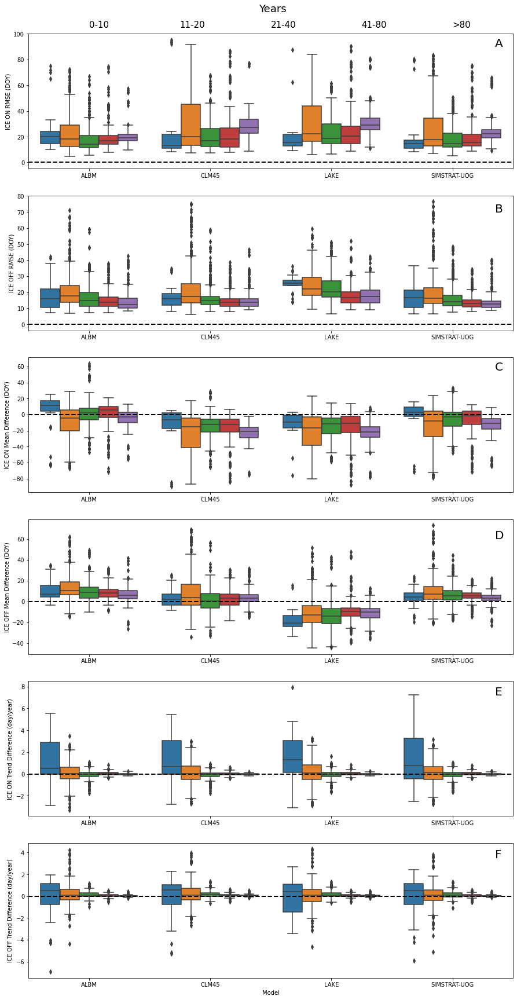

In [46]:
fig, (ax1, ax2, ax3, ax4, ax5, ax6) = graph.subplots(6, 1, figsize= (15, 30))

sns.boxplot(y = 'rmse', x = 'model', hue='binned_years', 
            data=df_ice_on_slopes_depth, ax=ax1).set(ylabel = 'ICE ON RMSE (DOY)')
sns.boxplot(y = 'rmse', x = 'model', hue='binned_years', 
            data=df_ice_off_slopes_depth, ax=ax2).set(ylabel = 'ICE OFF RMSE (DOY)')

sns.boxplot(y = 'mean_diff', x = 'model', hue='binned_years', 
            data=df_ice_on_slopes_depth, ax=ax3).set(ylabel = 'ICE ON Mean Difference (DOY)')
sns.boxplot(y = 'mean_diff', x = 'model', hue='binned_years', 
            data=df_ice_off_slopes_depth, ax=ax4).set(ylabel = 'ICE OFF Mean Difference (DOY)')

sns.boxplot(y = 'slope_diff', x = 'model', hue='binned_years', 
            data=df_ice_on_slopes_depth, ax=ax5).set(ylabel = 'ICE ON Trend Difference (day/year)')
sns.boxplot(y = 'slope_diff', x = 'model', hue='binned_years', 
            data=df_ice_off_slopes_depth, ax=ax6).set(ylabel = 'ICE OFF Trend Difference (day/year)', xlabel='Model')

ax1.axhline(0, linewidth=2, linestyle='--', color = 'black')
ax2.axhline(0, linewidth=2, linestyle='--', color = 'black')
ax3.axhline(0, linewidth=2, linestyle='--', color = 'black')
ax4.axhline(0, linewidth=2, linestyle='--', color = 'black')
ax5.axhline(0, linewidth=2, linestyle='--', color = 'black')
ax6.axhline(0, linewidth=2, linestyle='--', color = 'black')

ax1.text(3.35, 90, 'A', fontsize=20)
ax2.text(3.35, 70, 'B', fontsize=20)
ax3.text(3.35, 55, 'C', fontsize=20)
ax4.text(3.35, 60, 'D', fontsize=20)
ax5.text(3.35, 7.2, 'E', fontsize=20)
ax6.text(3.35, 3.5, 'F', fontsize=20)

# Legend Labels
ax1.text(1.4, 117, 'Years', fontsize=18)
ax1.text(0, 105, '0-10', fontsize=15)
ax1.text(0.75, 105, '11-20', fontsize=15)
ax1.text(1.5, 105, '21-40', fontsize=15)
ax1.text(2.25, 105, '41-80', fontsize=15)
ax1.text(3, 105, '>80', fontsize=15)

for axes in [ax1, ax2, ax3, ax4, ax5, ax6]:
    axes.legend([],[], frameon=False)
    if axes != ax6:
        axes.set(xlabel='')
    
graph.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/binned_years_boxplots_rmse_mean_trend.png', 
              bbox_inches='tight')

graph.show()

In [90]:
# df_ice_off_slopes_depth.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/ice_off_slopes_binned_years_oct_29_2021.csv', 
#                                index=False)
# df_ice_on_slopes_depth.to_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/ice_on_slopes_binned_years_oct_29_2021.csv', 
#                                index=False)

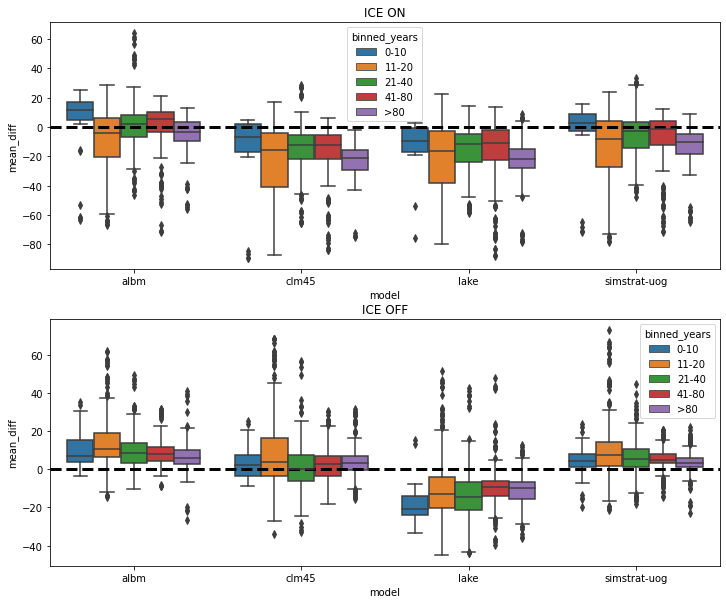

In [11]:
fig, (ax1, ax2) = graph.subplots(2, 1, figsize= (12, 10))

sns.boxplot(y = 'mean_diff', x = 'model', hue='binned_years', data=df_ice_on_slopes_depth, ax=ax1).set_title('ICE ON')
sns.boxplot(y = 'mean_diff', x = 'model', hue='binned_years', data=df_ice_off_slopes_depth, ax=ax2).set_title('ICE OFF')

ax1.axhline(0, linewidth=3, linestyle='--', color = 'black')
ax2.axhline(0, linewidth=3, linestyle='--', color = 'black')

graph.show()

In [24]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay, partial_dependence

In [155]:
df_ice_off_slopes_depth

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,mean_in_situ,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth,binned_years
1,74.75_101.25,27,ice_off,albm_gfdl-esm2m,205.000000,0.157509,24.430552,60,albm,27,...,182.148148,-0.026252,0.074074,74.75,101.25,22.851852,0.183761,105.696793,7.434675,21-40
4,74.75_101.25,27,ice_off,albm_hadgem2-es,214.074074,0.031746,34.895612,60,albm,27,...,182.148148,-0.026252,0.074074,74.75,101.25,31.925926,0.057998,105.696793,7.434675,21-40
7,74.75_101.25,27,ice_off,albm_ipsl-cm5a-lr,211.074074,-0.090965,31.785741,60,albm,27,...,182.148148,-0.026252,0.074074,74.75,101.25,28.925926,-0.064713,105.696793,7.434675,21-40
10,74.75_101.25,27,ice_off,albm_miroc5,213.740741,-0.113553,35.317082,60,albm,27,...,182.148148,-0.026252,0.074074,74.75,101.25,31.592593,-0.087302,105.696793,7.434675,21-40
13,74.75_101.25,27,ice_off,clm45_gfdl-esm2m,187.148148,-0.094017,11.493960,60,clm45,27,...,182.148148,-0.026252,0.074074,74.75,101.25,5.000000,-0.067766,105.696793,7.434675,21-40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18123,41.25_-73.75,35,ice_off,lake_miroc5,73.514286,0.046779,19.048060,60,lake,35,...,73.485714,0.035854,0.000000,41.25,-73.75,0.028571,0.010924,9.788189,9.750054,21-40
18125,41.25_-73.75,34,ice_off,simstrat-uog_gfdl-esm2m,68.647059,-0.362066,18.025309,60,simstrat-uog,35,...,73.485714,0.035854,0.000000,41.25,-73.75,-4.838655,-0.397921,9.788189,9.750054,21-40
18128,41.25_-73.75,30,ice_off,simstrat-uog_hadgem2-es,71.933333,-0.078887,18.135600,60,simstrat-uog,35,...,73.485714,0.035854,0.000000,41.25,-73.75,-1.552381,-0.114741,9.788189,9.750054,21-40
18131,41.25_-73.75,31,ice_off,simstrat-uog_ipsl-cm5a-lr,68.870968,-0.406379,18.633130,60,simstrat-uog,35,...,73.485714,0.035854,0.000000,41.25,-73.75,-4.614747,-0.442233,9.788189,9.750054,21-40


In [186]:
for df in [df_ice_off_slopes_depth, df_ice_on_slopes_depth]:
    df['location'] = np.where(df['lon'] < -120, 'alaska', np.nan)
#     df['location'] = np.where((df['lon'] > -120) & (df['lon'] <-20), 
#                               'mainland_US', df['location'])
    df['location'] = np.where((df['lon'] > -120), 'europe', df['location'])

    display(df.head())

,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth,binned_years,location
1,74.75_101.25,27,ice_off,albm_gfdl-esm2m,205.000000,0.157509,24.430552,60,albm,27,...,-0.026252,0.074074,74.75,101.25,22.851852,0.183761,105.696793,7.434675,21-40,europe
4,74.75_101.25,27,ice_off,albm_hadgem2-es,214.074074,0.031746,34.895612,60,albm,27,...,-0.026252,0.074074,74.75,101.25,31.925926,0.057998,105.696793,7.434675,21-40,europe
7,74.75_101.25,27,ice_off,albm_ipsl-cm5a-lr,211.074074,-0.090965,31.785741,60,albm,27,...,-0.026252,0.074074,74.75,101.25,28.925926,-0.064713,105.696793,7.434675,21-40,europe
10,74.75_101.25,27,ice_off,albm_miroc5,213.740741,-0.113553,35.317082,60,albm,27,...,-0.026252,0.074074,74.75,101.25,31.592593,-0.087302,105.696793,7.434675,21-40,europe
13,74.75_101.25,27,ice_off,clm45_gfdl-esm2m,187.148148,-0.094017,11.493960,60,clm45,27,...,-0.026252,0.074074,74.75,101.25,5.000000,-0.067766,105.696793,7.434675,21-40,europe


,lat_long,len_data_models,variable,lake_model,mean_model,slope_model,rmse,rcp,model,len_in_situ_data,...,slope_in_situ,perc_extreme,lat,lon,mean_diff,slope_diff,model_avg_area,model_depth,binned_years,location
1,74.75_101.25,26,ice_on,albm_gfdl-esm2m,-91.423077,0.024957,8.597853,60,albm,26,...,0.234872,0.076923,74.75,101.25,-3.769231,-0.209915,105.696793,7.434675,21-40,europe
4,74.75_101.25,26,ice_on,albm_hadgem2-es,-91.653846,0.000342,9.042634,60,albm,26,...,0.234872,0.076923,74.75,101.25,-4.000000,-0.234530,105.696793,7.434675,21-40,europe
7,74.75_101.25,26,ice_on,albm_ipsl-cm5a-lr,-91.346154,-0.014017,8.987170,60,albm,26,...,0.234872,0.076923,74.75,101.25,-3.692308,-0.248889,105.696793,7.434675,21-40,europe
10,74.75_101.25,26,ice_on,albm_miroc5,-91.384615,-0.064957,9.104099,60,albm,26,...,0.234872,0.076923,74.75,101.25,-3.730769,-0.299829,105.696793,7.434675,21-40,europe
13,74.75_101.25,26,ice_on,clm45_gfdl-esm2m,-92.269231,-0.002393,9.207021,60,clm45,26,...,0.234872,0.076923,74.75,101.25,-4.615385,-0.237265,105.696793,7.434675,21-40,europe


In [180]:
display(df_ice_on_slopes_depth[['rmse']].describe(percentiles=[0.025, 0.975]))
display(df_ice_off_slopes_depth[['rmse']].describe(percentiles=[0.025, 0.975]))

,rmse
count,5342.000000
mean,22.935364
std,14.341080
min,4.721665
2.5%,8.959345
50%,18.644648
97.5%,68.655082
max,95.386582


,rmse
count,6312.000000
mean,17.444714
std,8.759422
min,6.111705
2.5%,9.121438
50%,14.989679
97.5%,42.447681
max,76.500149


In [187]:
display(df_ice_off_slopes_depth.groupby('location')[['rmse']].describe(percentiles=[0.025, 0.975]))
display(df_ice_on_slopes_depth.groupby('location')[['rmse']].describe(percentiles=[0.025, 0.975]))

rmse                                                       \
           count       mean        std       min      2.5%        50%   
location                                                                
alaska     514.0  25.121850  14.610607  8.058298  9.124454  20.362366   
europe    5798.0  16.764126   7.677935  6.111705  9.121667  14.717904   

                                
              97.5%        max  
location                        
alaska    62.763019  74.933817  
europe    36.941487  76.500149

rmse                                                       \
           count       mean        std       min      2.5%        50%   
location                                                                
alaska     514.0  37.514044  24.630410  6.012807  8.278573  31.618083   
europe    4828.0  21.383284  11.749537  4.721665  9.027788  18.256864   

                                
              97.5%        max  
location                        
alaska    86.067065  95.386582  
europe    54.997962  90.370209

In [63]:
ice_off_x = df_ice_off_slopes_depth[['lat', 'len_in_situ_data', 'model_depth', 'model_avg_area', 'perc_extreme', 'lon']]
ice_off_x.rename(columns = {'lat': 'Latitude', 
                           'len_in_situ_data': 'Length Data', 
                           'model_depth': 'Depth', 
                           'model_avg_area': 'Area',
                           'perc_extreme': '% Extreme', 
                           'lon': 'Longitude'}, inplace=True)
ice_off_y = df_ice_off_slopes_depth['rmse'].values

In [64]:
ice_on_x = df_ice_on_slopes_depth[['lat', 'len_in_situ_data', 'model_depth', 'model_avg_area', 'perc_extreme', 'lon']]
ice_on_x.rename(columns = {'lat': 'Latitude', 
                           'len_in_situ_data': 'Length Data', 
                           'model_depth': 'Depth', 
                           'model_avg_area': 'Area',
                           'perc_extreme': '% Extreme', 
                           'lon': 'Longitude'}, inplace=True)
ice_on_y = df_ice_on_slopes_depth['rmse'].values

In [65]:
rnd_clf_off = RandomForestRegressor(n_estimators=500, n_jobs=-1, random_state=42)
rnd_clf_off.fit(ice_off_x, ice_off_y)

RandomForestRegressor(n_estimators=500, n_jobs=-1, random_state=42)

In [66]:
rnd_clf_on = RandomForestRegressor(n_estimators=500, n_jobs=-1, random_state=42)
rnd_clf_on.fit(ice_on_x, ice_on_y)

RandomForestRegressor(n_estimators=500, n_jobs=-1, random_state=42)

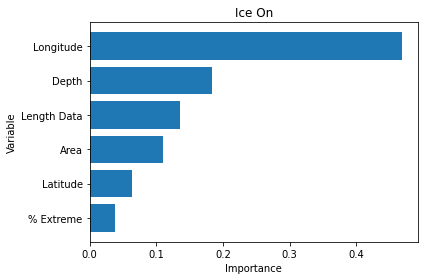

In [144]:
features_on = ice_on_x.columns
importances_on = rnd_clf_on.feature_importances_
indices_on = np.argsort(importances_on)

graph.title('Ice On')
graph.barh(range(len(indices_on)), importances_on[indices_on], align='center', color='tab:blue')
graph.yticks(range(len(indices_on)), [features_on[i] for i in indices_on])
graph.xlabel('Importance')
graph.ylabel('Variable')
graph.tight_layout()
graph.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/rmse_feature_importance_ice_on.pdf')
graph.show()

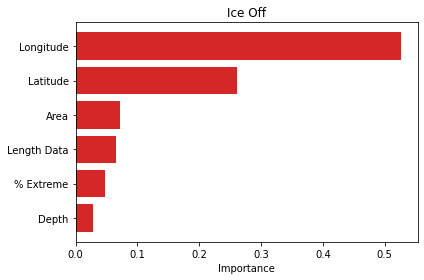

In [145]:
features_off = ice_off_x.columns
importances_off = rnd_clf_off.feature_importances_
indices_off = np.argsort(importances_off)

graph.title('Ice Off')
graph.barh(range(len(indices_off)), importances_off[indices_off], color='tab:red', align='center')
graph.yticks(range(len(indices_off)), [features_off[i] for i in indices_off])
graph.xlabel('Importance')
graph.tight_layout()
graph.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/rmse_feature_importance_ice_off.pdf')
graph.show()

TypeError: from_estimator() got an unexpected keyword argument 'color'

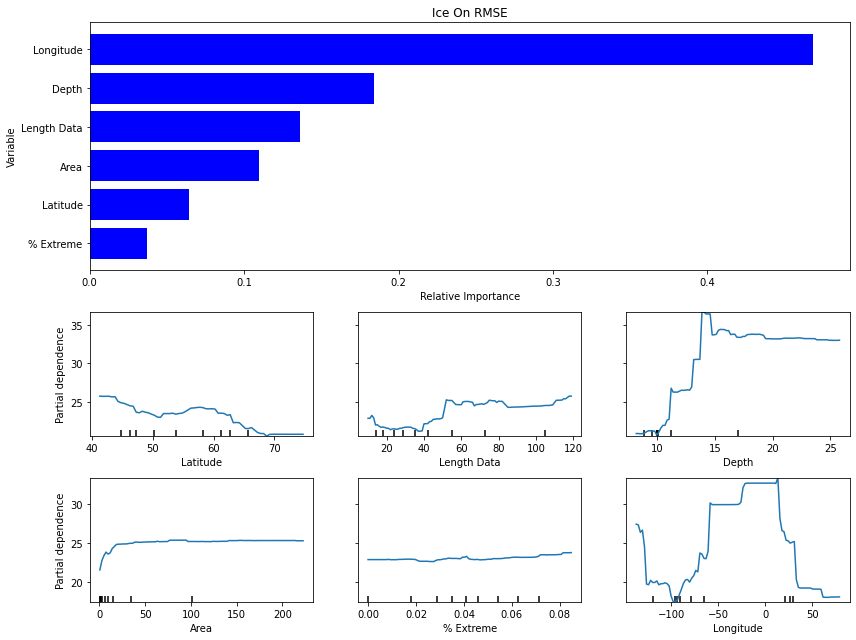

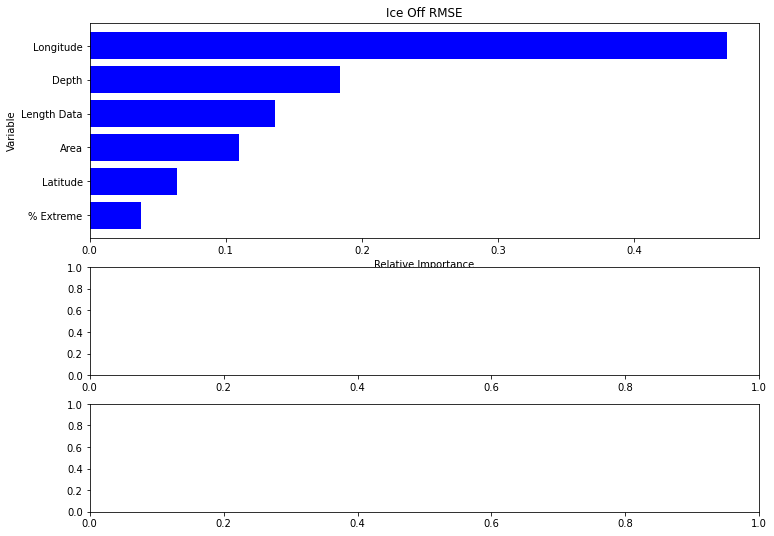

In [77]:
fig, (ax1, ax2, ax3) = graph.subplots(3, 1, figsize=(12, 9), 
                                      gridspec_kw={'height_ratios': [1, 0.5, 0.5]})

ax1.set_title('Ice On RMSE')
ax1.barh(range(len(indices_on)), importances_on[indices_on], color='b', align='center')
ax1.set_yticklabels(['_', '% Extreme', 'Latitude', 'Area', 'Length Data', 'Depth', 'Longitude'])
ax1.set_xlabel('Relative Importance')
ax1.set_ylabel('Variable')

first_pdp_on = PartialDependenceDisplay.from_estimator(rnd_clf_on, ice_on_x, [0, 1, 2], ax=ax2)
second_pdp_on = PartialDependenceDisplay.from_estimator(rnd_clf_on, ice_on_x, [3, 4, 5], ax=ax3)

# first_pdp_off = PartialDependenceDisplay.from_estimator(rnd_clf_off, ice_off_x, [0, 1, 2], ax=ax2)
# second_pdp_off = PartialDependenceDisplay.from_estimator(rnd_clf_off, ice_off_x, [3, 4, 5], ax=ax3)

fig.tight_layout()
fig.show()

#################### ICE OFF #############################

fig, (ax1, ax2, ax3) = graph.subplots(3, 1, figsize=(12, 9), 
                                      gridspec_kw={'height_ratios': [1, 0.5, 0.5]})

ax1.set_title('Ice Off RMSE')
ax1.barh(range(len(indices_on)), importances_on[indices_on], color='b', align='center')
ax1.set_yticklabels(['_', '% Extreme', 'Latitude', 'Area', 'Length Data', 'Depth', 'Longitude'])
ax1.set_xlabel('Relative Importance')
ax1.set_ylabel('Variable')

# first_pdp_on = PartialDependenceDisplay.from_estimator(rnd_clf_on, ice_on_x, [0, 1, 2], ax=ax2)
# second_pdp_on = PartialDependenceDisplay.from_estimator(rnd_clf_on, ice_on_x, [3, 4, 5], ax=ax3)

first_pdp_off = PartialDependenceDisplay.from_estimator(rnd_clf_off, ice_off_x, [0, 1, 2], ax=ax2, color='orange')
second_pdp_off = PartialDependenceDisplay.from_estimator(rnd_clf_off, ice_off_x, [3, 4, 5], ax=ax3)

fig.tight_layout()
fig.show()

In [140]:
pdp_on_lat, on_axes_lat = partial_dependence(rnd_clf_on, ice_on_x, [0])
pdp_on_len, on_axes_len = partial_dependence(rnd_clf_on, ice_on_x, [1])
pdp_on_depth, on_axes_depth = partial_dependence(rnd_clf_on, ice_on_x, [2])
pdp_on_area, on_axes_area = partial_dependence(rnd_clf_on, ice_on_x, [3])
pdp_on_extreme, on_axes_extreme = partial_dependence(rnd_clf_on, ice_on_x, [4])
pdp_on_lon, on_axes_lon = partial_dependence(rnd_clf_on, ice_on_x, [5])

In [141]:
pdp_off_lat, off_axes_lat = partial_dependence(rnd_clf_off, ice_off_x, [0])
pdp_off_len, off_axes_len = partial_dependence(rnd_clf_off, ice_off_x, [1])
pdp_off_depth, off_axes_depth = partial_dependence(rnd_clf_off, ice_off_x, [2])
pdp_off_area, off_axes_area = partial_dependence(rnd_clf_off, ice_off_x, [3])
pdp_off_extreme, off_axes_extreme = partial_dependence(rnd_clf_off, ice_off_x, [4])
pdp_off_lon, off_axes_lon = partial_dependence(rnd_clf_off, ice_off_x, [5])

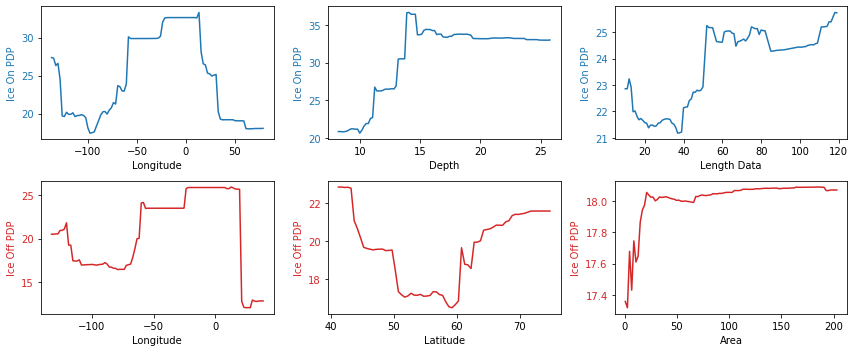

In [148]:
pdp_lists = ['Latitude', 'Length Data', 'Depth (m)', 'Area (km2)', '% Extreme', 'Longitude']

fig, axes = graph.subplots(2, 3, figsize=(12, 5), )
ax1, ax2, ax3, ax4, ax5, ax6 = axes.flatten()

for subplot, pdp_on, axes_on, label in zip([ax1, ax2, ax3], 
                                           [pdp_on_lon, pdp_on_depth, pdp_on_len], 
                                           [on_axes_lon, on_axes_depth, on_axes_len], 
                                           ['Longitude', 'Depth', 'Length Data']):
    
    color='tab:blue'
    subplot.plot(axes_on[0], pdp_on[0], color=color)
    subplot.set_ylabel('Ice On PDP', color=color)
    subplot.set_xlabel(f'{label}')
    subplot.tick_params(axis='y', labelcolor=color)

for subplot, pdp_off, axes_off, label in zip([ax4, ax5, ax6], 
                                             [pdp_off_lon, pdp_off_lat, pdp_off_area], 
                                             [off_axes_lon, off_axes_lat, off_axes_area], 
                                             ['Longitude', 'Latitude', 'Area']):
    
    color='tab:red'
    subplot.plot(axes_off[0], pdp_off[0], color=color)
    subplot.set_ylabel('Ice Off PDP', color=color)
    subplot.set_xlabel(f'{label}')
    subplot.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/partial_dependence_rmse_top_3.pdf')
fig.show()

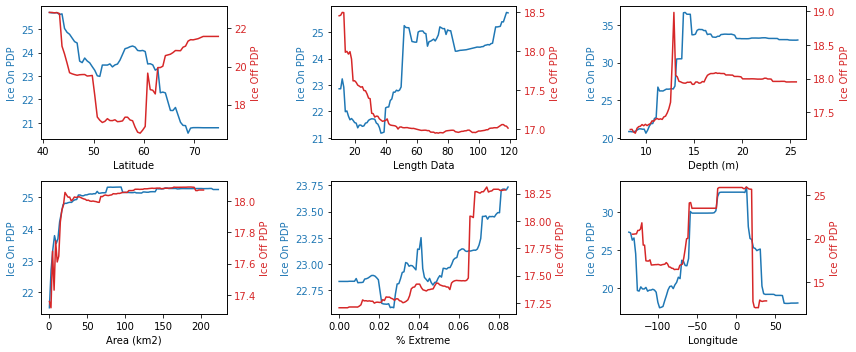

In [149]:
pdp_lists = ['Latitude', 'Length Data', 'Depth (m)', 'Area (km2)', '% Extreme', 'Longitude']

fig, axes = graph.subplots(2, 3, figsize=(12, 5), )
ax1, ax3, ax5, ax7, ax9, ax11 = axes.flatten()

for label, subplot, i in zip(pdp_lists, [ax1, ax3, ax5, ax7, ax9, ax11], range(6)):
    
    pdp_on, axes_on = partial_dependence(rnd_clf_on, ice_on_x, [i])
    pdp_off, axes_off = partial_dependence(rnd_clf_off, ice_off_x, [i])
    
    color='tab:blue'
    subplot.plot(axes_on[0], pdp_on[0], color=color)
    subplot.set_ylabel('Ice On PDP', color=color)
    subplot.set_xlabel(f'{label}')
    subplot.tick_params(axis='y', labelcolor=color)

    subplot_2 = subplot.twinx()
    color = 'tab:red'
    subplot_2.plot(axes_off[0], pdp_off[0], color=color)
    subplot_2.set_ylabel('Ice Off PDP', color=color)
    subplot_2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
fig.savefig('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/Graphs/partial_dependence_rmse.pdf')
fig.show()

In [189]:
df_ice_off_slopes_depth.columns

Index(['lat_long', 'len_data_models', 'variable', 'lake_model', 'mean_model',
       'slope_model', 'rmse', 'rcp', 'model', 'len_in_situ_data', 'start_year',
       'end_year', 'mean_in_situ', 'slope_in_situ', 'perc_extreme', 'lat',
       'lon', 'mean_diff', 'slope_diff', 'model_avg_area', 'model_depth',
       'binned_years', 'location'],
      dtype='object')

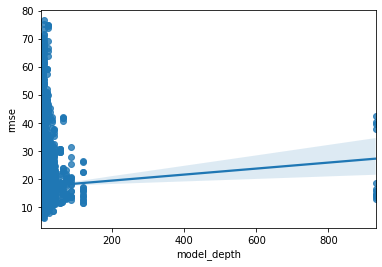

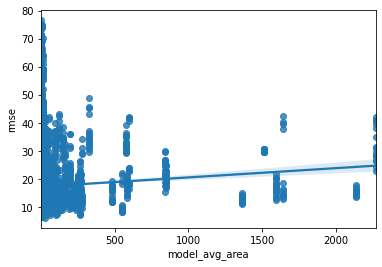

In [194]:
sns.regplot(df_ice_off_slopes_depth['model_depth'], df_ice_off_slopes_depth['rmse'])
graph.show()

sns.regplot(df_ice_off_slopes_depth['model_avg_area'], df_ice_off_slopes_depth['rmse'])
graph.show()

In [151]:
kevin = pd.read_csv('/mnt/c/Users/imrit/Downloads/Sapna_work/Climate_change_lake_model_uncertainty/all_lakes_ts_minimal_KB_Aug31.csv')
display(kevin.head())

,lakecode,lake,start_year,froze,froze_1,froze_2,froze_3,froze_4,froze_5,froze_6,...,ice_off_4,ice_on_5,ice_off_5,ice_on_6,ice_off_6,orig_duration,orig_duration_column,latitude,longitude,other_lakenames
0,ARAI1,suwa,1443,Y,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,Lake Suwa;LAKE SUWA;Suwa
1,ARAI1,suwa,1444,Y,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,Lake Suwa;LAKE SUWA;Suwa
2,ARAI1,suwa,1445,Y,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,Lake Suwa;LAKE SUWA;Suwa
3,ARAI1,suwa,1446,Y,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,Lake Suwa;LAKE SUWA;Suwa
4,ARAI1,suwa,1447,Y,Y,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,None,36.04,138.08,Lake Suwa;LAKE SUWA;Suwa


In [154]:
print(kevin['start_year'].min(), kevin['start_year'].max())

874 2019
